# <ins> <span style="color:lightblue">Home Loan Default Prediction - Sprint 2</span> <ins>

## <ins> <span style="color:lightblue">Table of Contents </span> <ins>

### [Introduction](#Intro)

### [Loading and Preparation of Data](#LoadandPrep)

### [Part 1 - Data Cleaning]
1. [Assessment]
2. [Handling Duplicates]
3. [Extracting Categorical and numerical Data type]
4. [Null Values]

### [Part 2 - Preliminary Expolatory Data Analysis 1](#preliminaryeda1)
1. [Study of Individual Variables]
2. [Relationship Analysis]
    
### [Part 3 - Preliminary Expolatory Data Analysis 2](#preliminaryeda2)
1. [Positive and Negative Correlation]
    
### [Part 4 - Feature Engineering](#featureeng)
1. [Categorical-to-Numerical conversion]
2. [Addressing Multicollinearity]
3. [Variance Inflation Factor (VIF)]
4. [Train and Test Split]
    
### [Part 5 - Baseline Model Introduction and setup](#baselinemodel)
1. [Split into Training and Validation Datasets]
2. [Fit Baseline Models]
3. [Apply SMOTE (Synthetic Minority Over-sampling Technique) to the Training Set (dealing with imbalanced classes)]
4. [Logistic Regression]
5. [Decision Tree Model]
6. [Random Forest Model]
7. [XGBoost Model]
8. [Support Vector Machine (SVM)]
9. [Gradient Boosting Model]
10. [Summary of Baseline Models]
11. [Comparison of metrics of Baseline Models with SMOTE]
12. [Overall Explanation of Model Performance]

### [Part 6 - Conclusion and Next Steps](#conclusion)

____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________

# <ins> Introduction <a id='Intro'></a> <ins>

Home loan default prediction is a crucial task in the banking and financial sector to mitigate risks associated with lending. With the emergence of machine learning techniques, it has become possible to analyse historical data to develop predictive models that can accurately identify potential defaulters. In this project, we aim to utilize machine learning algorithms to predict the likelihood of a borrower defaulting on a home loan. We will be dividing this project into 3 parts, namely:

* Sprint 1 
* Sprint 2
* Sprint 3

In our Sprint 1 we went through 

1. Data Cleaning
2. Basic Exploratory Data Analysis 1

Where we cleaned the data, handled a huge amount of NULL values and studied characteristics of different variables and their relationship with the target variable. 

_________________________________________________________________________________________________________________________________________________________________

This will be the Sprint 2 part of our project where we will get to preprocess our dataset and run advanced EDA processes inorder to prepare the dataset for our Machine learning Models during our final part of our main Project. 

The Sprint 2 has been divided into 3 steps :- Exploratory Data Analysis 2, Feature Engineering, and Baseline Modeling. 

Part 3: <ins> Preliminary Exploratory Data Analysis (EDA) <ins> 
    
We start with a thorough EDA to understand the dataset's characteristics, focusing on identifying both positive and negative correlations between features and the target variable.

Part 4: <ins> Feature Engineering<ins> 
    
Feature engineering involves converting categorical variables to numerical formats and addressing multicollinearity. We use Variance Inflation Factor (VIF) to detect and mitigate multicollinearity issues, ensuring robust feature representation.

Part 5: <ins> Baseline Model Introduction and Setup<ins> 

Split into Training and Validation Datasets: We divide the data into training and validation sets to build and evaluate models.
    
Fit Baseline Models: We train several baseline models including Logistic Regression, Decision Tree, Random Forest, XGBoost, Support Vector Machine (SVM), and Gradient Boosting.
    
Apply SMOTE: We use SMOTE to handle class imbalance in the training data by generating synthetic samples of the minority class.
    
Model Evaluation: We evaluate each model's performance on both the original and SMOTE-transformed datasets. We compare metrics such as accuracy, precision, recall, and F1 score to understand how SMOTE impacts model effectiveness.
    
Part 6: <ins> Conclusion and Next Steps <ins> 
    
Finally, we summarize the findings, compare the performance of the baseline models, and outline the next steps for further improvement and model refinement.

____________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________________

# <ins> Loading and Preparation of Data <ins> <a id='Loading-&-Preparation-of-Data'></a>

Lets first prepare our Notebook for the project by installing an upgrade on Pandas, running all the necessary imports essential for the project and load the dataset to work on

In [9]:
# To install any updates or upgrades in Panda
!pip3 install --upgrade pandas

In [10]:
pip install seaborn --upgrade

Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.


In [12]:
# Lets run all the necessary imports
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

In [13]:
# This code is to get rid of the red warnings through out this notebook
pd.options.mode.copy_on_write = True 

In [14]:
# Lets read and load the train_data csv file
raw_data = pd.read_csv('train_data.csv') 

In [15]:
# Shows first 5 rows of the data
raw_data.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
0,450407,Cash loans,F,N,Y,1,67500.0,227520.0,11065.5,180000.0,...,0,0,0,0.0,0.0,0.0,1.0,0.0,2.0,0
1,271298,Cash loans,M,Y,Y,1,247500.0,1882372.5,65560.5,1719000.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,3.0,0
2,122238,Cash loans,M,Y,Y,1,180000.0,101880.0,10827.0,90000.0,...,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0,0
3,305311,Cash loans,M,N,N,0,81000.0,405000.0,20677.5,405000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
4,414121,Cash loans,F,N,Y,0,157500.0,888840.0,29506.5,675000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0


___________________________________________________________________________________________________________________________________________________________________________________

# Part 1: <ins> Data Cleaning <a id='Datacleaning'></a> <ins>

This section focuses on exploring the dataset further. It aims to:

* Determine the total shape of the data.
* Identify any null values that require handling, either by filling or deleting them.
* Detect any duplicate entries within the dataset.

## <ins> Assessment <a id='Assessment'></a> <ins>

Lets look at the first 20 rows of the dataset.

In [21]:
# Shows first 20 rows of the data
raw_data.head(20)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
0,450407,Cash loans,F,N,Y,1,67500.0,227520.0,11065.5,180000.0,...,0,0,0,0.0,0.0,0.0,1.0,0.0,2.0,0
1,271298,Cash loans,M,Y,Y,1,247500.0,1882372.5,65560.5,1719000.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,3.0,0
2,122238,Cash loans,M,Y,Y,1,180000.0,101880.0,10827.0,90000.0,...,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0,0
3,305311,Cash loans,M,N,N,0,81000.0,405000.0,20677.5,405000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
4,414121,Cash loans,F,N,Y,0,157500.0,888840.0,29506.5,675000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
5,188073,Cash loans,M,Y,Y,0,202500.0,1350000.0,64948.5,1350000.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
6,123261,Cash loans,F,N,Y,0,180000.0,1113840.0,44302.5,900000.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,6.0,0
7,103883,Cash loans,F,N,Y,0,103500.0,45000.0,4738.5,45000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,0
8,169250,Cash loans,F,N,Y,0,157500.0,728460.0,38938.5,675000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0
9,105040,Cash loans,M,Y,N,0,90000.0,1078200.0,31653.0,900000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0


In the Dataset above we can see that each row represents an individual applicant, and there's a wide range of features captured, from basic demographic information like age and gender to financial specifics like income and credit amount.

The dataset includes a mix of numerical and categorical data. Numerical data includes columns like income, credit amount, and various ratios, while categorical data includes things like gender, education type, and housing type.

This summary provides a quick overview of the dataset's structure, data types, missing values, unique values, and sample values for each column.

In [24]:
# The summarytable function will provide a comprehensive overview of the raw data
def summarytable(raw_data):
    print(f"Dataset Shape: {raw_data.shape}")
    summary = pd.DataFrame(raw_data.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = raw_data.isnull().sum().values
    summary['Missing_Percentage'] = np.round(raw_data.isnull().sum().values/raw_data.shape[0]*100,2)
    summary['Uniques'] = raw_data.nunique().values
    summary['Uniques_Percentage'] = np.round(raw_data.nunique().values/raw_data.shape[0]*100,2)
    summary['First Value'] = raw_data.loc[0].values
    summary['Second Value'] = raw_data.loc[1].values
    summary['Third Value'] = raw_data.loc[2].values
    summary['Last Value'] = raw_data.iloc[-1].values

    return summary

summarytable(raw_data)

Dataset Shape: (184506, 122)


,Name,dtypes,Missing,Missing_Percentage,Uniques,Uniques_Percentage,First Value,Second Value,Third Value,Last Value
0,SK_ID_CURR,int64,0,0.00,184506,100.00,450407,271298,122238,125605
1,NAME_CONTRACT_TYPE,object,0,0.00,2,0.00,Cash loans,Cash loans,Cash loans,Cash loans
2,CODE_GENDER,object,0,0.00,3,0.00,F,M,M,F
3,FLAG_OWN_CAR,object,0,0.00,2,0.00,N,Y,Y,N
4,FLAG_OWN_REALTY,object,0,0.00,2,0.00,Y,Y,Y,Y
...,...,...,...,...,...,...,...,...,...,...
117,AMT_REQ_CREDIT_BUREAU_WEEK,float64,24998,13.55,8,0.00,0.0,0.0,0.0,0.0
118,AMT_REQ_CREDIT_BUREAU_MON,float64,24998,13.55,22,0.01,1.0,0.0,2.0,0.0
119,AMT_REQ_CREDIT_BUREAU_QRT,float64,24998,13.55,11,0.01,0.0,1.0,0.0,0.0
120,AMT_REQ_CREDIT_BUREAU_YEAR,float64,24998,13.55,22,0.01,2.0,3.0,1.0,2.0


This function, summarytable, generates a summary table for the provided raw data. Here's a breakdown of what each part of the summary table represents:

Name: Name of the column in the dataset. <br>
dtypes: Data type of the column. <br>
Missing: Number of missing values in the column. <br>
Missing_Percentage: Percentage of missing values in the column. <br>
Uniques: Number of unique values in the column. <br>
Uniques_Percentage: Percentage of unique values in the column. <br>
First Value: Value of the column in the first row of the dataset. <br>
Second Value: Value of the column in the second row of the dataset. <br>
Third Value: Value of the column in the third row of the dataset. <br>
Last Value: Value of the column in the last row of the dataset. <br>

This summary table provides a quick overview of the dataset's structure, including the data types, missing values, unique values, and some sample values for each feature. It helps in understanding the composition and distribution of data within the dataset, which can be useful for data preprocessing and analysis tasks.

## <ins> Handling Duplicates <a id='Duplicates'></a> <ins>

Lets check if there are any Duplicates in the Dataset

In [28]:
# Check for duplicate rows
raw_data.duplicated().sum()

0

There are no Duplicates 

## <ins> Extracting Categorical and numerical Data types <a id='catandnum'></a> <ins>

Some obvious categorical features can be extracted using select_dtypes() and excluding all numeric columns. There are 16 such features. 

Before that lets change the column names to lower cases for easy accessibility.

In [32]:
# Change all column names to lowercase so that it is easier to refer to them
raw_data.columns = raw_data.columns.str.lower()
raw_data.columns

Index(['sk_id_curr', 'name_contract_type', 'code_gender', 'flag_own_car',
       'flag_own_realty', 'cnt_children', 'amt_income_total', 'amt_credit',
       'amt_annuity', 'amt_goods_price',
       ...
       'flag_document_19', 'flag_document_20', 'flag_document_21',
       'amt_req_credit_bureau_hour', 'amt_req_credit_bureau_day',
       'amt_req_credit_bureau_week', 'amt_req_credit_bureau_mon',
       'amt_req_credit_bureau_qrt', 'amt_req_credit_bureau_year', 'target'],
      dtype='object', length=122)

In [33]:
# Extract categorical variables 
non_numeric = raw_data.select_dtypes(exclude="number")
non_numeric.head(10)

,name_contract_type,code_gender,flag_own_car,flag_own_realty,name_type_suite,name_income_type,name_education_type,name_family_status,name_housing_type,occupation_type,weekday_appr_process_start,organization_type,fondkapremont_mode,housetype_mode,wallsmaterial_mode,emergencystate_mode
0,Cash loans,F,N,Y,Family,Commercial associate,Secondary / secondary special,Married,House / apartment,Sales staff,WEDNESDAY,Business Entity Type 3,NaN,block of flats,Mixed,No
1,Cash loans,M,Y,Y,Unaccompanied,Working,Higher education,Civil marriage,House / apartment,Managers,TUESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
2,Cash loans,M,Y,Y,"Spouse, partner",Working,Higher education,Married,House / apartment,Laborers,MONDAY,Transport: type 4,reg oper account,block of flats,Panel,No
3,Cash loans,M,N,N,Unaccompanied,Working,Secondary / secondary special,Single / not married,With parents,NaN,WEDNESDAY,Other,NaN,NaN,NaN,NaN
4,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Sales staff,TUESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
5,Cash loans,M,Y,Y,Unaccompanied,Commercial associate,Incomplete higher,Single / not married,With parents,Laborers,TUESDAY,Self-employed,NaN,block of flats,Panel,No
6,Cash loans,F,N,Y,Family,Pensioner,Secondary / secondary special,Married,House / apartment,NaN,SUNDAY,XNA,reg oper account,block of flats,Panel,No
7,Cash loans,F,N,Y,Family,Commercial associate,Secondary / secondary special,Married,House / apartment,Sales staff,SATURDAY,Self-employed,reg oper account,block of flats,Panel,No
8,Cash loans,F,N,Y,Family,Working,Secondary / secondary special,Married,House / apartment,Sales staff,TUESDAY,Trade: type 7,NaN,block of flats,Mixed,No
9,Cash loans,M,Y,N,Unaccompanied,Pensioner,Lower secondary,Married,House / apartment,NaN,FRIDAY,XNA,not specified,block of flats,"Stone, brick",No


Now, lets store the above categorical columns in a list so that we can use them later.

In [35]:
# Lets define the categorical columns for easy access
categorical_cols = non_numeric.columns.to_list()
categorical_cols

['name_contract_type',
 'code_gender',
 'flag_own_car',
 'flag_own_realty',
 'name_type_suite',
 'name_income_type',
 'name_education_type',
 'name_family_status',
 'name_housing_type',
 'occupation_type',
 'weekday_appr_process_start',
 'organization_type',
 'fondkapremont_mode',
 'housetype_mode',
 'wallsmaterial_mode',
 'emergencystate_mode']

In [36]:
# Determine the length of categorical columns
len(categorical_cols)

16

There are 16 categorical columns in the Dataset.

In [38]:
# Extract numerical columns
non_object = raw_data.select_dtypes(exclude="object")

In [39]:
# Show the first 5 rows of the Dataset
non_object.head()

,sk_id_curr,cnt_children,amt_income_total,amt_credit,amt_annuity,amt_goods_price,region_population_relative,days_birth,days_employed,days_registration,...,flag_document_19,flag_document_20,flag_document_21,amt_req_credit_bureau_hour,amt_req_credit_bureau_day,amt_req_credit_bureau_week,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year,target
0,450407,1,67500.0,227520.0,11065.5,180000.0,0.018634,-17210,-774,-5580.0,...,0,0,0,0.0,0.0,0.0,1.0,0.0,2.0,0
1,271298,1,247500.0,1882372.5,65560.5,1719000.0,0.018850,-18640,-96,-5711.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,3.0,0
2,122238,1,180000.0,101880.0,10827.0,90000.0,0.022625,-14649,-6130,-1776.0,...,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0,0
3,305311,0,81000.0,405000.0,20677.5,405000.0,0.035792,-12762,-5891,-6430.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
4,414121,0,157500.0,888840.0,29506.5,675000.0,0.018801,-16329,-345,-1413.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0


In [40]:
# Add the numerical columns to a list
numerical_cols = non_object.columns.to_list()
numerical_cols

['sk_id_curr',
 'cnt_children',
 'amt_income_total',
 'amt_credit',
 'amt_annuity',
 'amt_goods_price',
 'region_population_relative',
 'days_birth',
 'days_employed',
 'days_registration',
 'days_id_publish',
 'own_car_age',
 'flag_mobil',
 'flag_emp_phone',
 'flag_work_phone',
 'flag_cont_mobile',
 'flag_phone',
 'flag_email',
 'cnt_fam_members',
 'region_rating_client',
 'region_rating_client_w_city',
 'hour_appr_process_start',
 'reg_region_not_live_region',
 'reg_region_not_work_region',
 'live_region_not_work_region',
 'reg_city_not_live_city',
 'reg_city_not_work_city',
 'live_city_not_work_city',
 'ext_source_1',
 'ext_source_2',
 'ext_source_3',
 'apartments_avg',
 'basementarea_avg',
 'years_beginexpluatation_avg',
 'years_build_avg',
 'commonarea_avg',
 'elevators_avg',
 'entrances_avg',
 'floorsmax_avg',
 'floorsmin_avg',
 'landarea_avg',
 'livingapartments_avg',
 'livingarea_avg',
 'nonlivingapartments_avg',
 'nonlivingarea_avg',
 'apartments_mode',
 'basementarea_mode',
 

In [41]:
# length of numerical columns
len(numerical_cols)

106

There are 106 numerical columns

## <ins> Null Values <a id='Null'></a> <ins>

As we saw in the summary stats of all the columns in the data at the above section, its quite evident that there are huge number of null values present in the dataset. 

Lets have a detail look at the dataset in large to see if there are any other values apart from Nan values present in the data which needs a careful look at.

In [45]:
raw_data.head(100)

,sk_id_curr,name_contract_type,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit,amt_annuity,amt_goods_price,...,flag_document_19,flag_document_20,flag_document_21,amt_req_credit_bureau_hour,amt_req_credit_bureau_day,amt_req_credit_bureau_week,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year,target
0,450407,Cash loans,F,N,Y,1,67500.0,227520.0,11065.5,180000.0,...,0,0,0,0.0,0.0,0.0,1.0,0.0,2.0,0
1,271298,Cash loans,M,Y,Y,1,247500.0,1882372.5,65560.5,1719000.0,...,0,0,0,0.0,0.0,0.0,0.0,1.0,3.0,0
2,122238,Cash loans,M,Y,Y,1,180000.0,101880.0,10827.0,90000.0,...,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0,0
3,305311,Cash loans,M,N,N,0,81000.0,405000.0,20677.5,405000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
4,414121,Cash loans,F,N,Y,0,157500.0,888840.0,29506.5,675000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,240169,Cash loans,F,N,N,1,99000.0,1256400.0,40657.5,900000.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0
96,246722,Revolving loans,M,Y,N,0,108000.0,270000.0,13500.0,270000.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0
97,249080,Cash loans,F,N,N,0,144000.0,481495.5,33511.5,454500.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,0
98,255162,Cash loans,M,Y,N,1,121500.0,517788.0,33219.0,427500.0,...,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,0


I took a sample of 100 rows to see if there are any other different value apart from Nan that needs attention, and I found out that the column name Organization type has a value named XNA which looks like a <br> 
null value. Lets go ahead and look at the variable in detail. 

In [47]:
# Find out unique values of Organization type column
raw_data["organization_type"].unique()

array(['Business Entity Type 3', 'Transport: type 4', 'Other',
       'Self-employed', 'XNA', 'Trade: type 7', 'Kindergarten',
       'Transport: type 2', 'Restaurant', 'Insurance', 'Government',
       'Medicine', 'Bank', 'Industry: type 3', 'Military', 'Security',
       'Realtor', 'Industry: type 9', 'Culture', 'Business Entity Type 2',
       'Legal Services', 'Emergency', 'Postal', 'Business Entity Type 1',
       'Electricity', 'Housing', 'Trade: type 3', 'School', 'Agriculture',
       'Hotel', 'University', 'Construction', 'Police',
       'Industry: type 7', 'Security Ministries', 'Transport: type 3',
       'Services', 'Trade: type 2', 'Trade: type 6', 'Industry: type 11',
       'Cleaning', 'Industry: type 2', 'Industry: type 5', 'Religion',
       'Trade: type 1', 'Mobile', 'Industry: type 1', 'Industry: type 12',
       'Industry: type 4', 'Transport: type 1', 'Advertising', 'Telecom',
       'Trade: type 5', 'Industry: type 10', 'Industry: type 6',
       'Trade: type 4',

 Lets now go ahead and convert the XNA or XAP values (if any) to Nan value for easy evaluation

In [49]:
x_null_cols = [col for col in raw_data.columns if ((raw_data[col] == "XNA") | (raw_data[col] == "XAP")).any()]

for col in x_null_cols:
    raw_data.loc[(raw_data[col] == "XNA") | (raw_data[col] == "XAP"), col] = np.nan

Now that we have successfully converted the XNA and XAP values to Nan, Lets now find out the Null Value Percentage in the data below

In [51]:
def null_percentage(raw_data):
    null_values_total = raw_data.isnull().sum().sort_values(ascending = False)
    total_null_percent = (raw_data.isnull().sum()/raw_data.isnull().count() * 100).sort_values(ascending = False)
    return pd.concat([null_values_total, total_null_percent], axis = 1, keys = ['Total Null Sum', 'Null Percentage'])

In [52]:
null_percentage(raw_data)[0: 100]

,Total Null Sum,Null Percentage
commonarea_mode,128971,69.900708
commonarea_medi,128971,69.900708
commonarea_avg,128971,69.900708
nonlivingapartments_medi,128146,69.453568
nonlivingapartments_mode,128146,69.453568
...,...,...
amt_income_total,0,0.000000
amt_credit,0,0.000000
name_income_type,0,0.000000
name_education_type,0,0.000000


The code calculates the percentage of missing values for each column in the raw_data and sorts the results in ascending order. 
Here's a breakdown of the interpretation:

Columns with 0% missing values:<br>
These columns have no missing data. They are complete and contain values for all rows in the dataset. Examples include SK_ID_CURR, REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, and so on.

Columns with less than 1% missing values:<br>
These columns have minimal missing data, which is unlikely to significantly impact analysis or modeling.
Examples include DAYS_LAST_PHONE_CHANGE and CNT_FAM_MEMBERS.

Columns with missing values between 1% to 10%:<br>
These columns have a small percentage of missing values, which may require attention but are not critical.
Examples include AMT_ANNUITY, AMT_GOODS_PRICE, and EXT_SOURCE_2.

Columns with missing values between 10% to 50%:<br>
These columns have a moderate to high percentage of missing values, indicating substantial missing data.
Missing data in these columns may significantly impact analysis or modeling, and imputation or other strategies may be necessary.
Examples include OCCUPATION_TYPE, EXT_SOURCE_3, and EMERGENCYSTATE_MODE.

Columns with missing values over 50%:<br>
These columns have a very high percentage of missing values, suggesting a considerable amount of missing data.
Imputation may be challenging for these columns, and careful consideration is needed before including them in analysis or modeling.
Examples include FONDKAPREMONT_MODE, HOUSE_TYPE_MODE, and TOTALAREA_MODE.

Interpretation of specific columns:<br>
For instance, OWN_CAR_AGE has approximately 66% missing values, indicating that the majority of entries do not have information about the age of the owned car. This could imply that a large portion of the population in the dataset does not own a car.
Similarly, YEARS_BEGINEXPLUATATION_AVG, YEARS_BEGINEXPLUATATION_MODE, and YEARS_BEGINEXPLUATATION_MEDI have around 48% missing values, suggesting a significant lack of data regarding the average, modal, and median years of building exploitation. This might indicate either missing records or a lack of this information for a substantial portion of the dataset.

In [54]:
# Extract Null values in the categorical columns in a list
cat_null_cols = [col for col in categorical_cols if raw_data[col].isna().any()]
cat_null_cols

['code_gender',
 'name_type_suite',
 'occupation_type',
 'organization_type',
 'fondkapremont_mode',
 'housetype_mode',
 'wallsmaterial_mode',
 'emergencystate_mode']

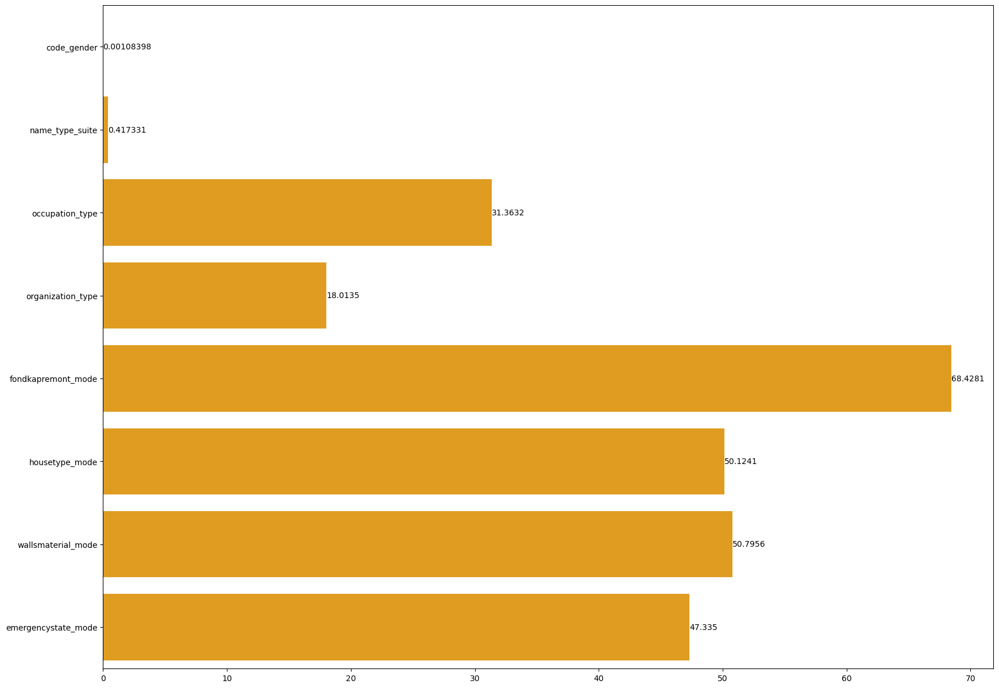

In [55]:
# Plot a bar plot of all the null valued categorical columns
plt.figure(figsize=(20, 15))
data = [(sum(raw_data[col].isna()) / len(raw_data)) * 100 for col in cat_null_cols]
ax = sns.barplot(x=data, y=cat_null_cols, orient="h", color='orange')
_ = ax.bar_label(ax.containers[0])

From the above graph its quite evident that the highest null value containing Categorical column is the fondkapremomt_mode. Lowest being code gender.

In [57]:
# Extract mumerical columns in a list
numerical_null_cols = [col for col in numerical_cols if raw_data[col].isna().any()]
numerical_null_cols

['amt_annuity',
 'amt_goods_price',
 'own_car_age',
 'cnt_fam_members',
 'ext_source_1',
 'ext_source_2',
 'ext_source_3',
 'apartments_avg',
 'basementarea_avg',
 'years_beginexpluatation_avg',
 'years_build_avg',
 'commonarea_avg',
 'elevators_avg',
 'entrances_avg',
 'floorsmax_avg',
 'floorsmin_avg',
 'landarea_avg',
 'livingapartments_avg',
 'livingarea_avg',
 'nonlivingapartments_avg',
 'nonlivingarea_avg',
 'apartments_mode',
 'basementarea_mode',
 'years_beginexpluatation_mode',
 'years_build_mode',
 'commonarea_mode',
 'elevators_mode',
 'entrances_mode',
 'floorsmax_mode',
 'floorsmin_mode',
 'landarea_mode',
 'livingapartments_mode',
 'livingarea_mode',
 'nonlivingapartments_mode',
 'nonlivingarea_mode',
 'apartments_medi',
 'basementarea_medi',
 'years_beginexpluatation_medi',
 'years_build_medi',
 'commonarea_medi',
 'elevators_medi',
 'entrances_medi',
 'floorsmax_medi',
 'floorsmin_medi',
 'landarea_medi',
 'livingapartments_medi',
 'livingarea_medi',
 'nonlivingapartmen

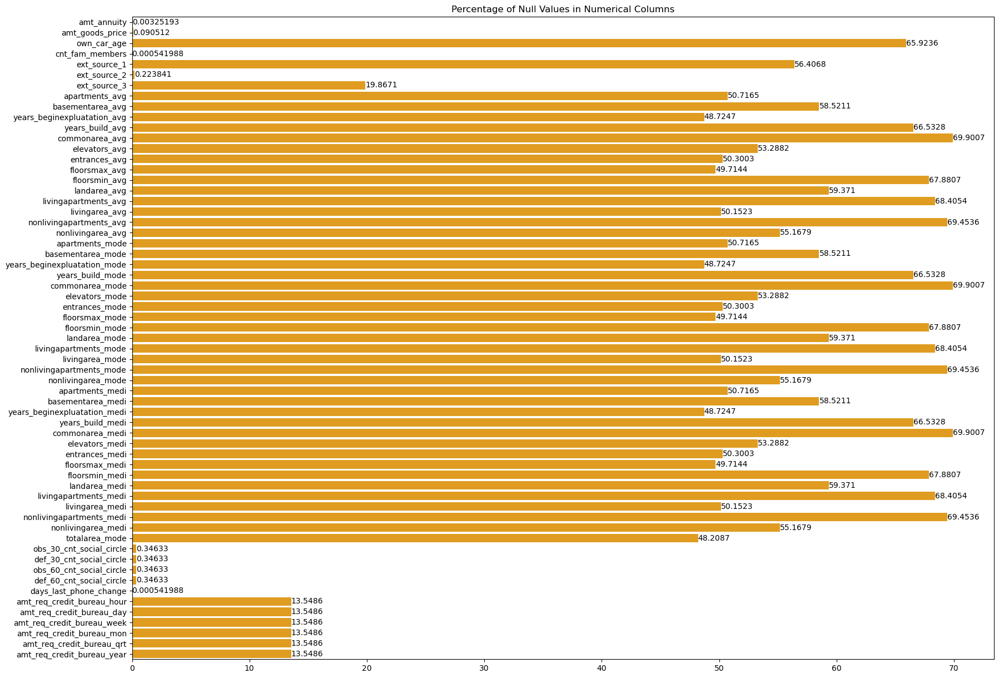

In [58]:
# Assuming raw_data is your DataFrame and numerical_null_cols contains the names of numerical columns with null values
plt.figure(figsize=(20, 15))

# Calculate the percentage of null values in each numerical column
data = [(sum(raw_data[col].isna()) / len(raw_data)) * 100 for col in numerical_null_cols]

# Create the bar plot
ax = sns.barplot(x=data, y=numerical_null_cols, orient="h", color='orange')

# Add labels to the bars
ax.bar_label(ax.containers[0])

# Add title to the plot
plt.title('Percentage of Null Values in Numerical Columns')

# Show the plot
plt.show()

All of the variables above have upto 70% missing values. I will be deleting 20% and more missing valued columns since we dont have any insider information to fill in this huge amount of null values. 

One of the variables above that caught my eye which has around 31% of missing values, which is Occupation type. This column can play an important role in determining if the applicant can default their payments or <br> not. Therefore, lets look at ways how to fill this column instead of deleting them.

In [60]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = raw_data['occupation_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

occupation_type
Accountants               5897
Cleaning staff            2766
Cooking staff             3621
Core staff               16492
Drivers                  11238
HR staff                   321
High skill tech staff     6859
IT staff                   314
Laborers                 32968
Low-skill Laborers        1223
Managers                 12780
Medicine staff            5130
Private service staff     1565
Realty agents              434
Sales staff              19351
Secretaries                787
Security staff            4074
Waiters/barmen staff       819
NaN                      57867
Name: count, dtype: int64
Sum of unique values including NaN: 184506


As you can see the majority of Nan values present is the highest among the rest of the data. It constitutes to around 57867 applicants. I wont delete the row or column for now. Lets create another category named 'Unknown' <br> for now and add these Nan values to the newly created category. Lets analyse this later in our EDA part of project to see if this needs deleting or not

In [62]:
# Creating a new category 'Unknown' to the 'Occupation_type' column
new_category = 'Unknown'  # Name for the new category

# Fill missing values in the 'occupation' column with the new category
raw_data['occupation_type'] = raw_data['occupation_type'].fillna(new_category)

Lets do a sanity check if this has been filled or not.

In [64]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = raw_data['occupation_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

occupation_type
Accountants               5897
Cleaning staff            2766
Cooking staff             3621
Core staff               16492
Drivers                  11238
HR staff                   321
High skill tech staff     6859
IT staff                   314
Laborers                 32968
Low-skill Laborers        1223
Managers                 12780
Medicine staff            5130
Private service staff     1565
Realty agents              434
Sales staff              19351
Secretaries                787
Security staff            4074
Unknown                  57867
Waiters/barmen staff       819
Name: count, dtype: int64
Sum of unique values including NaN: 184506


We have successfully filled in the Occupation type with Unknown category. Since this column plays an important role for the purpose of our project, I do prefer to keep this column for now instead of deleting the <br> whole column all together for now. 

Lets now plot the column Organization type to understand the figures better

C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\2989171337.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=raw_data, x=raw_data[column],\
C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\2989171337.py:3: UserWarning: 
The palette list has fewer values (1) than needed (19) and will cycle, which may produce an uninterpretable plot.
  ax = sns.countplot(data=raw_data, x=raw_data[column],\
C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\2989171337.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45);


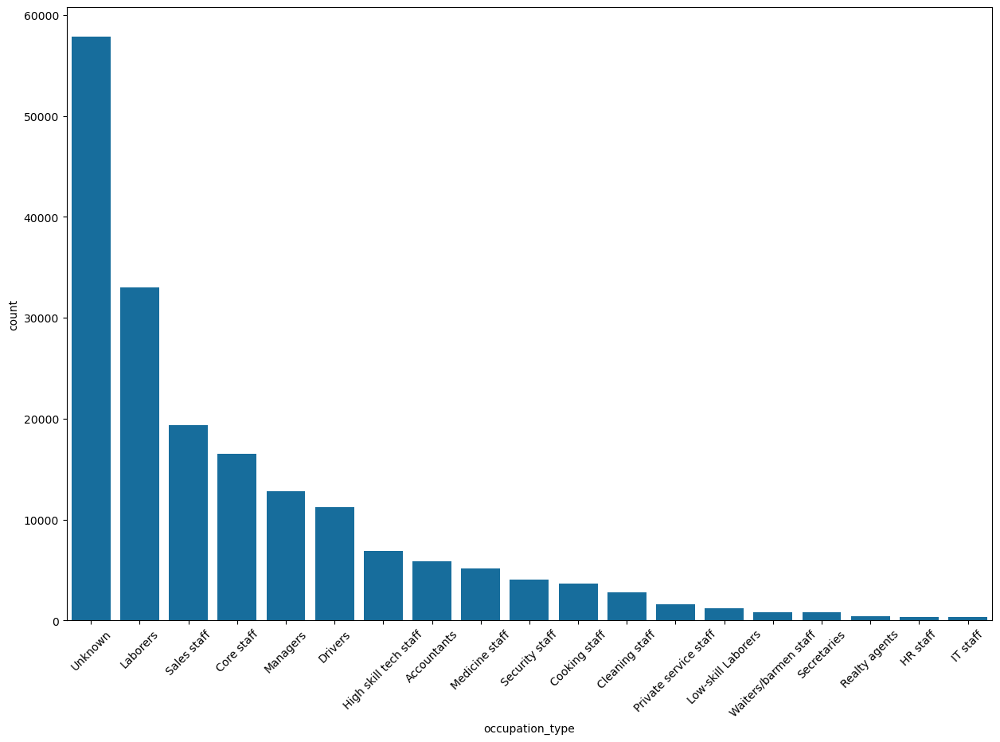

In [67]:
def bar_maker(raw_data,column):
    plt.figure(figsize=(15,10))
    ax = sns.countplot(data=raw_data, x=raw_data[column],\
          palette=[sns.color_palette("colorblind")[0]],order=raw_data[column].value_counts().index)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

bar_maker(raw_data,'occupation_type')

The newly created category exhibits the highest in figures amonth the occupation type column. The second highest is laborers. We may have to look at this column later to see if we will have to remove the Unknown or not.

Becasue we have a large amount of missing value and we dont have any insider information to fill in the missing values. Therefore we can delete more than 20% of the missing value columns.

In [70]:
# Create a copy of the original dataframe
df_clean = raw_data.copy()

# Get the columns with more than 20% missing values
cols_to_drop = df_clean.columns[df_clean.isnull().sum() / len(df_clean) * 100 > 20]

# Drop the columns with more than 20% missing values
df_clean.drop(cols_to_drop, axis=1, inplace=True)

In [71]:
# Check the shape of the dataframe
df_clean.shape

(184506, 73)

We now have 184506 rows and 73 columns.

Lets run a ratio of the total number of rows dropped and the percentage of rows dropped.

In [73]:
# Extract the number and percentage of rows dropped
Number_of_rows_dropped = raw_data.shape[0] - df_clean.dropna().shape[0]
print("The total number of rows dropped is {}".format(Number_of_rows_dropped))
print("The percentage of rows dropped is {}%".format(np.round(Number_of_rows_dropped / len(df_clean) * 100, 2)))

The total number of rows dropped is 64306
The percentage of rows dropped is 34.85%


In [74]:
# To check the null values from 0 - 20%
(df_clean.isnull().sum() / df_clean.isnull().count()).sort_values(ascending = False).iloc[0: 20]

ext_source_3                  0.198671
organization_type             0.180135
amt_req_credit_bureau_year    0.135486
amt_req_credit_bureau_qrt     0.135486
amt_req_credit_bureau_mon     0.135486
amt_req_credit_bureau_week    0.135486
amt_req_credit_bureau_day     0.135486
amt_req_credit_bureau_hour    0.135486
name_type_suite               0.004173
obs_30_cnt_social_circle      0.003463
def_60_cnt_social_circle      0.003463
obs_60_cnt_social_circle      0.003463
def_30_cnt_social_circle      0.003463
ext_source_2                  0.002238
amt_goods_price               0.000905
amt_annuity                   0.000033
code_gender                   0.000011
days_last_phone_change        0.000005
cnt_fam_members               0.000005
flag_document_7               0.000000
dtype: float64

MMethodology:

Check the Percentage of Missing Values:

The initial step involves calculating the percentage of missing values in each column of the original DataFrame (raw_data). Using the isnull() method, The number of missing values for each column is then summed and divided by the total number of rows in the DataFrame to compute the percentage of missing values for each column.

Create a Copy of the Original DataFrame:

A copy of the original DataFrame raw_data is created and assigned to a new DataFrame called df_clean. This step ensures that the original DataFrame remains unchanged, and any modifications are applied to the new copy.

Identify Columns with More Than 20% Missing Values:

The code identifies the columns in the raw_data DataFrame that have more than 20% missing values. Boolean indexing and comparison are used to filter out the column names that meet this condition.

Drop Columns with More Than 20% Missing Values:

The identified columns with more than 20% missing values are dropped from the raw_data DataFrame using the drop() method and the cols_to_drop variable, which contains the column names to be removed. The axis=1 parameter specifies that columns are being dropped.

Check the Shape of the DataFrame:

After dropping the columns with more than 20% missing values, the shape of the resulting df_clean DataFrame is displayed. This shows the number of rows and columns in the cleaned DataFrame.

Findings:

The original DataFrame df had 184506 rows and a total of 122 columns.<br>
After data cleaning and removing columns with more than 20% missing values, the cleaned DataFrame df_clean now has 184506 rows and 73 columns.

This indicates that several columns in the original DataFrame had more than 20% missing values and were removed to handle missing data effectively. The cleaned DataFrame retains the same number of rows but has fewer columns, resulting in a more manageable and complete dataset for further analysis or modeling.

In addition to the deleted null values, lets now check the data types of the remaining null valued columns

In [77]:
# Find columns with null values and their data types
columns_with_null = [key for key, value in df_clean.items() if any(pd.isnull(value))]
dtypes_of_null_columns = {col: type(df_clean[col][0]) for col in columns_with_null}

print("Data types of columns with null values:")
print(dtypes_of_null_columns)

Data types of columns with null values:
{'code_gender': <class 'str'>, 'amt_annuity': <class 'numpy.float64'>, 'amt_goods_price': <class 'numpy.float64'>, 'name_type_suite': <class 'str'>, 'cnt_fam_members': <class 'numpy.float64'>, 'organization_type': <class 'str'>, 'ext_source_2': <class 'numpy.float64'>, 'ext_source_3': <class 'numpy.float64'>, 'obs_30_cnt_social_circle': <class 'numpy.float64'>, 'def_30_cnt_social_circle': <class 'numpy.float64'>, 'obs_60_cnt_social_circle': <class 'numpy.float64'>, 'def_60_cnt_social_circle': <class 'numpy.float64'>, 'days_last_phone_change': <class 'numpy.float64'>, 'amt_req_credit_bureau_hour': <class 'numpy.float64'>, 'amt_req_credit_bureau_day': <class 'numpy.float64'>, 'amt_req_credit_bureau_week': <class 'numpy.float64'>, 'amt_req_credit_bureau_mon': <class 'numpy.float64'>, 'amt_req_credit_bureau_qrt': <class 'numpy.float64'>, 'amt_req_credit_bureau_year': <class 'numpy.float64'>}


In [78]:
# Run the Summary of the column
df_clean['ext_source_3'].describe()

count    147850.000000
mean          0.510894
std           0.194894
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.893976
Name: ext_source_3, dtype: float64

In [79]:
# Run the median of the column
df_clean['ext_source_3'].median()

0.5352762504724826

C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\1060371900.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_clean['ext_source_3'], kde=True)


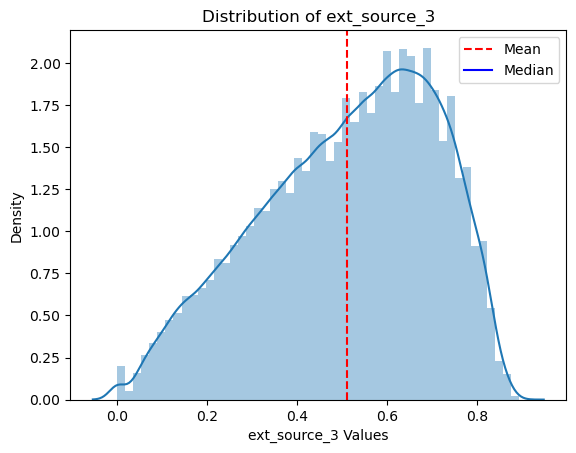

In [80]:
# Plot the distribution
sns.distplot(df_clean['ext_source_3'], kde=True)

# Calculate mean and median
mean_val = np.mean(df_clean['ext_source_3'])
median_val = np.median(df_clean['ext_source_3'])

# Plot mean and median as vertical lines
plt.axvline(mean_val, color='red', linestyle='--', label='Mean')
plt.axvline(median_val, color='blue', linestyle='-', label='Median')

# Add title and labels
plt.title('Distribution of ext_source_3')
plt.xlabel('ext_source_3 Values')
plt.ylabel('Density')

# Add legend
plt.legend()

# Show plot
plt.show()

By filling the null values of the column 'ext_source_3' with the mean or median significantly changes the distribution of the variable, which suggests that the missing values <br>
are not missing at random (MAR). In such cases, blindly imputing missing values with mean or median could introduce bias or distort the original distribution of the data.

Therefore lets look at doing a Forward filling method to see if this does not change the distribution of the variable

In [82]:
# Forward fill missing values
df_clean['ext_source_3'] = df_clean['ext_source_3'].ffill()

C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\1060371900.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_clean['ext_source_3'], kde=True)


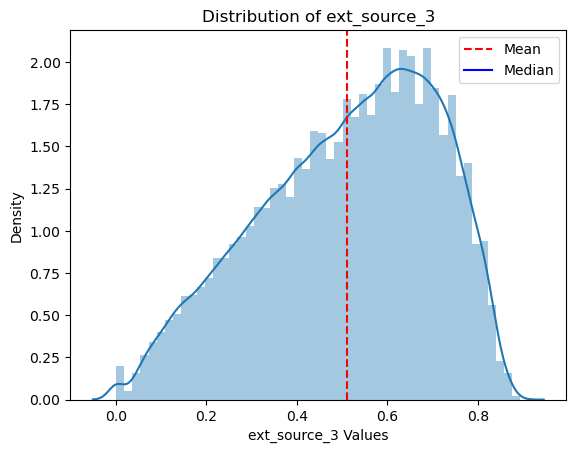

In [83]:
# Plot the distribution
sns.distplot(df_clean['ext_source_3'], kde=True)

# Calculate mean and median
mean_val = np.mean(df_clean['ext_source_3'])
median_val = np.median(df_clean['ext_source_3'])

# Plot mean and median as vertical lines
plt.axvline(mean_val, color='red', linestyle='--', label='Mean')
plt.axvline(median_val, color='blue', linestyle='-', label='Median')

# Add title and labels
plt.title('Distribution of ext_source_3')
plt.xlabel('ext_source_3 Values')
plt.ylabel('Density')

# Add legend
plt.legend()

# Show plot
plt.show()

The distribution of the column has not changed. Lets check if the variable ext_source_3 has been filled in

In [85]:
# Extract Null values in the data
df_clean.isna().sum().sort_values()

sk_id_curr                         0
hour_appr_process_start            0
reg_region_not_live_region         0
reg_region_not_work_region         0
live_region_not_work_region        0
                               ...  
amt_req_credit_bureau_week     24998
amt_req_credit_bureau_mon      24998
amt_req_credit_bureau_qrt      24998
amt_req_credit_bureau_year     24998
organization_type              33236
Length: 73, dtype: int64

The majority of the missing values has been filled in except for one value. Since 'ffill' fills missing values with the last known non-null value in the column, propagating forward. 

Lets check if that one missing value is the first value of the column

In [87]:
# Extract unique vakues of the column
df_clean['ext_source_3'].unique()

array([           nan, 6.86382335e-01, 5.40654450e-01, 3.37672722e-01,
       8.19317692e-01, 8.06149281e-01, 4.92060094e-01, 6.61023539e-01,
       7.03203305e-01, 1.00803706e-01, 7.92264474e-01, 3.63945239e-01,
       2.60855914e-01, 4.34733249e-01, 5.91976618e-01, 3.96219572e-01,
       6.04112600e-01, 3.17031779e-01, 6.21226338e-01, 4.50747282e-01,
       4.32961667e-01, 5.81483706e-01, 7.62335618e-01, 3.53987608e-01,
       3.00107757e-01, 3.75711010e-01, 5.01075160e-01, 6.51260219e-01,
       2.44516392e-01, 3.84206813e-01, 4.79448981e-01, 2.62248971e-01,
       1.96333966e-01, 2.04422625e-01, 6.22922000e-01, 5.29889834e-01,
       7.38019620e-01, 6.59405532e-01, 3.39287700e-01, 3.57293268e-01,
       2.91097380e-01, 5.62060483e-01, 3.79100485e-01, 5.79727423e-01,
       3.65616507e-01, 7.53067392e-01, 3.45784802e-01, 6.47976860e-01,
       7.13631400e-01, 4.25892898e-01, 5.42445144e-01, 2.52598698e-01,
       5.76208836e-01, 7.16570245e-01, 7.12155155e-01, 6.24614658e-01,
      

This is the first missing value, therefore ffill will not work. Let try bfill (backward filling method) for the one Nan value

In [89]:
# Backward fill missing values
df_clean['ext_source_3'] = df_clean['ext_source_3'].bfill()

Now lets look at the distribution of the column ext_source_3

C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\1060371900.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_clean['ext_source_3'], kde=True)


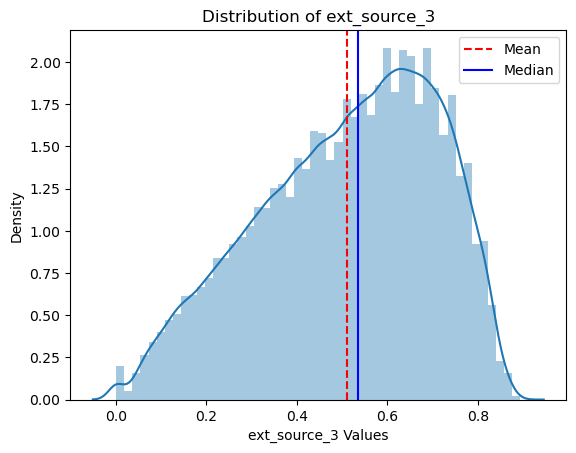

In [91]:
# Plot the distribution
sns.distplot(df_clean['ext_source_3'], kde=True)

# Calculate mean and median
mean_val = np.mean(df_clean['ext_source_3'])
median_val = np.median(df_clean['ext_source_3'])

# Plot mean and median as vertical lines
plt.axvline(mean_val, color='red', linestyle='--', label='Mean')
plt.axvline(median_val, color='blue', linestyle='-', label='Median')

# Add title and labels
plt.title('Distribution of ext_source_3')
plt.xlabel('ext_source_3 Values')
plt.ylabel('Density')

# Add legend
plt.legend()

# Show plot
plt.show()

The distribution has not changed and now lets look at if the Nan values have all been filled in. 

In [93]:
# Find all the null values in the Dataset
df_clean.isna().sum().sort_values()

sk_id_curr                         0
reg_region_not_live_region         0
reg_region_not_work_region         0
live_region_not_work_region        0
reg_city_not_live_city             0
                               ...  
amt_req_credit_bureau_week     24998
amt_req_credit_bureau_mon      24998
amt_req_credit_bureau_qrt      24998
amt_req_credit_bureau_year     24998
organization_type              33236
Length: 73, dtype: int64

The ext_source_3 has all been filled in without disturbing the distribution of the variable. Lets look at our next categorical variable, 'name_type_suite'

In [95]:
# To extract the value counts of the variable name_type_suite
value_counts_with_nan = df_clean['name_type_suite'].value_counts(dropna=False)

# To print the count of unique values including NaN
print(value_counts_with_nan)

# To sum up all the unique values including NaN
unique_sum_with_nan = value_counts_with_nan.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan)

name_type_suite
Unaccompanied      149059
Family              24044
Spouse, partner      6869
Children             1982
Other_B              1081
NaN                   770
Other_A               528
Group of people       173
Name: count, dtype: int64
Sum of unique values including NaN: 184506


There are a huge number of Unaccaopanied Values in the column and there are 770 Nan values. Lets look at the summary stats of the variable and the distribution of the column

In [97]:
# To fund the summary of the variable
df_clean['name_type_suite'].describe()

count            183736
unique                7
top       Unaccompanied
freq             149059
Name: name_type_suite, dtype: object

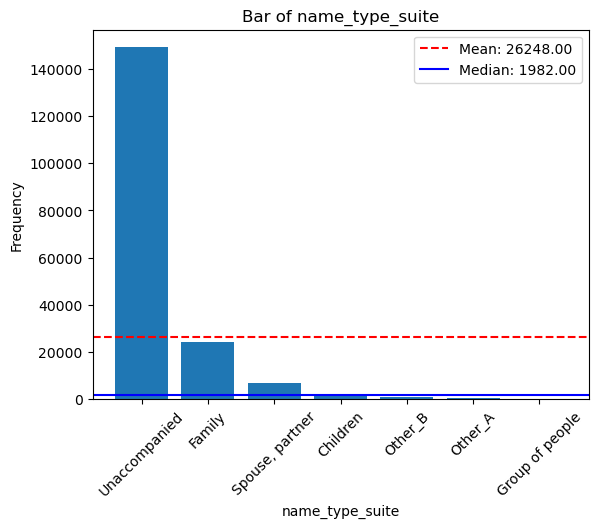

In [98]:
# Assuming 'object_column' is the object data column
name_type_suite_column = 'name_type_suite'

# Count the frequency of each category
category_counts = df_clean[name_type_suite_column].value_counts()

# Plot histogram
plt.bar(category_counts.index, category_counts.values)

# Calculate mean and median
mean_val = category_counts.mean()
median_val = category_counts.median()

# Plot mean and median as horizontal lines
plt.axhline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Add labels and title
plt.xlabel(name_type_suite_column)
plt.ylabel('Frequency')
plt.title(f'Bar of {name_type_suite_column}')

# Add legend
plt.legend()

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Show plot
plt.show()

Lets safely assume that we could fill in the Nan values with Unaccompanied as thats the largest number in the column present and we shall check the distribution of the column later

In [100]:
# Replace null values with a custom value like 'Unaccompanied'
df_clean['name_type_suite'] = df_clean['name_type_suite'].fillna('Unaccompanied')

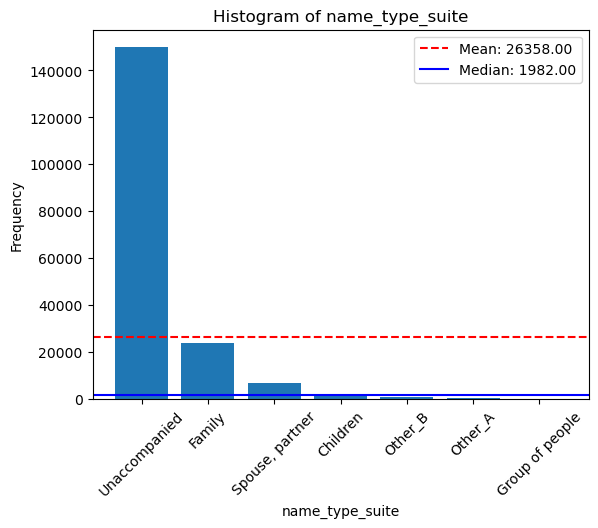

In [101]:
# Assuming 'object_column' is the object data column
name_type_suite_column = 'name_type_suite'

# Count the frequency of each category
category_counts = df_clean[name_type_suite_column].value_counts()

# Plot histogram
plt.bar(category_counts.index, category_counts.values)

# Calculate mean and median
mean_val = category_counts.mean()
median_val = category_counts.median()

# Plot mean and median as horizontal lines
plt.axhline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axhline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Add labels and title
plt.xlabel(name_type_suite_column)
plt.ylabel('Frequency')
plt.title(f'Histogram of {name_type_suite_column}')

# Add legend
plt.legend()

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Show plot
plt.show()

We cant see any visible changes in the distribution apart from the Mean going slightly up than the previous figure from 26248 to 26358 due to the slight increase in the total number of Unaccompanied section of the column. Lets look at the sum of unique values present.

In [103]:
# To extract the value counts of the variable name_type_suite
value_counts_with_nan = df_clean['name_type_suite'].value_counts(dropna=False)

# To print the count of unique values including NaN
print(value_counts_with_nan)

# To sum up all the unique values including NaN
unique_sum_with_nan = value_counts_with_nan.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan)

name_type_suite
Unaccompanied      149829
Family              24044
Spouse, partner      6869
Children             1982
Other_B              1081
Other_A               528
Group of people       173
Name: count, dtype: int64
Sum of unique values including NaN: 184506


The filling was successful. Lets now look at our rest of the Nan values

In [105]:
# To find anu null values in the Dataset
df_clean.isna().sum().sort_values()

sk_id_curr                         0
reg_region_not_live_region         0
reg_region_not_work_region         0
live_region_not_work_region        0
reg_city_not_live_city             0
                               ...  
amt_req_credit_bureau_day      24998
amt_req_credit_bureau_week     24998
amt_req_credit_bureau_mon      24998
amt_req_credit_bureau_qrt      24998
organization_type              33236
Length: 73, dtype: int64

Apart from the ones that has very minute number of Nan values such as amt_annuity, code_gender, cnt_fam_members and days_last_phone_change, 

Lets look the rest of the numerical columns except organization type

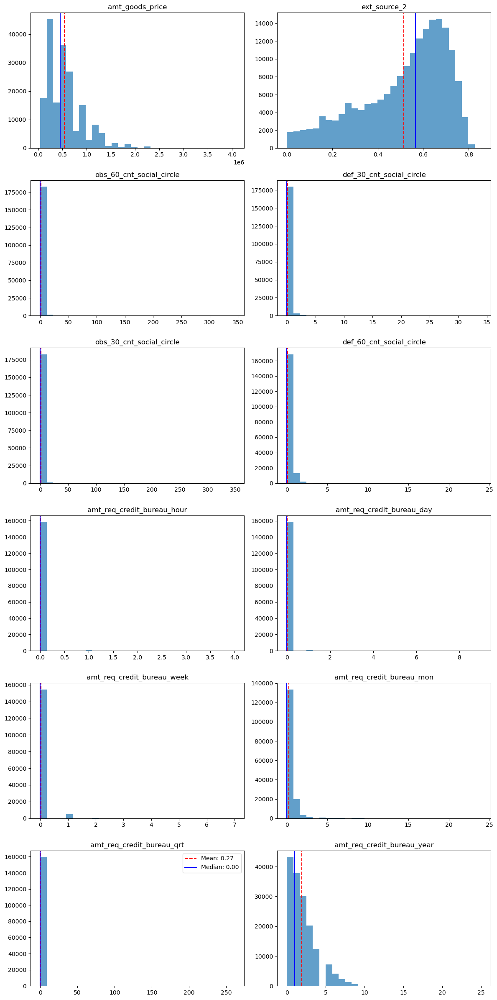

In [107]:
# Select columns with null values
null_columns = ['amt_goods_price',
                'ext_source_2', 'obs_60_cnt_social_circle', 'def_30_cnt_social_circle', 
                'obs_30_cnt_social_circle', 'def_60_cnt_social_circle', 'amt_req_credit_bureau_hour',
                'amt_req_credit_bureau_day', 'amt_req_credit_bureau_week', 'amt_req_credit_bureau_mon',
                'amt_req_credit_bureau_qrt', 'amt_req_credit_bureau_year']

# Determine number of subplots
num_plots = len(null_columns)
num_rows = num_plots // 2 + (num_plots % 2)  # Adjust for odd number of plots

# Create subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(12, num_rows*4))

# Plot histograms for columns with null values
for i, col in enumerate(null_columns):
    row_idx = i // 2
    col_idx = i % 2
    
    # Plot histogram
    axes[row_idx][col_idx].hist(df_clean[col].dropna(), bins=30, alpha=0.7)
    axes[row_idx][col_idx].set_title(col)
    
    # Calculate mean and median
    mean_val = np.mean(df_clean[col].dropna())
    median_val = np.median(df_clean[col].dropna())
    
    # Plot mean and median as vertical lines
    axes[row_idx][col_idx].axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
    axes[row_idx][col_idx].axvline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Adjust layout
if num_plots % 2 != 0:
    fig.delaxes(axes[-1][-1])  # Remove last subplot if it's empty
    axes[-1][-2].set_xlabel('Values')  # Add x-axis label to the last subplot

# Add legend
axes[-1][-2].legend(loc='upper right')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

Lets safely assume that Forward filling method, should not disturb the distribution of the columns and go ahead with the filling of the Nan values

In [109]:
# Forward fill missing values
df_clean['ext_source_2'] = df_clean['ext_source_2'].ffill()

In [110]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_year'] = df_clean['amt_req_credit_bureau_year'].ffill()

In [111]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_qrt'] = df_clean['amt_req_credit_bureau_qrt'].ffill()

In [112]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_mon'] = df_clean['amt_req_credit_bureau_mon'].ffill()

In [113]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_week'] = df_clean['amt_req_credit_bureau_week'].ffill()

In [114]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_day'] = df_clean['amt_req_credit_bureau_day'].ffill()

In [115]:
# Forward fill missing values
df_clean['amt_req_credit_bureau_hour'] = df_clean['amt_req_credit_bureau_hour'].ffill()

In [116]:
# Forward fill missing values
df_clean['def_60_cnt_social_circle'] = df_clean['def_60_cnt_social_circle'].ffill()

In [117]:
# Forward fill missing values
df_clean['obs_60_cnt_social_circle'] = df_clean['obs_60_cnt_social_circle'].ffill()

In [118]:
# Forward fill missing values
df_clean['def_30_cnt_social_circle'] = df_clean['def_30_cnt_social_circle'].ffill()

In [119]:
# Forward fill missing values
df_clean['obs_30_cnt_social_circle'] = df_clean['obs_30_cnt_social_circle'].ffill()

In [120]:
# Forward fill missing values
df_clean['obs_30_cnt_social_circle'] = df_clean['obs_30_cnt_social_circle'].ffill()

In [121]:
# Forward fill missing values
df_clean['amt_goods_price'] = df_clean['amt_goods_price'].ffill()

Now lets look at if the ffill has successfully filled in the Nan values above

In [123]:
# To fiind the total null values in the dataset
df_clean.isna().sum().sort_values()

sk_id_curr                    0
flag_document_8               0
flag_document_7               0
flag_document_6               0
flag_document_5               0
                          ...  
cnt_fam_members               1
days_last_phone_change        1
code_gender                   2
amt_annuity                   6
organization_type         33236
Length: 73, dtype: int64

Apart from the columns that we left behind, rest of the missing values have been filled. Lets check at their distribution once again.

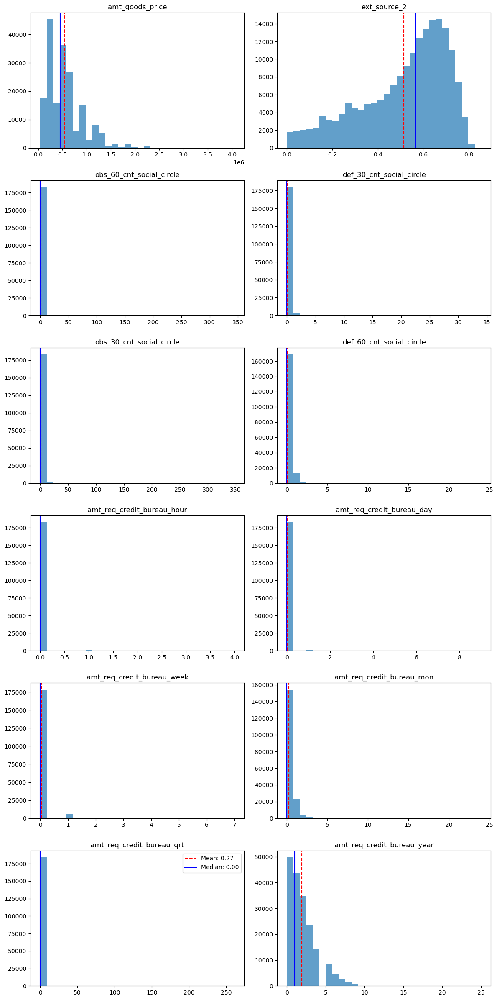

In [125]:
# Select columns with null values
null_columns = ['amt_goods_price',
                'ext_source_2', 'obs_60_cnt_social_circle', 'def_30_cnt_social_circle', 
                'obs_30_cnt_social_circle', 'def_60_cnt_social_circle', 'amt_req_credit_bureau_hour',
                'amt_req_credit_bureau_day', 'amt_req_credit_bureau_week', 'amt_req_credit_bureau_mon',
                'amt_req_credit_bureau_qrt', 'amt_req_credit_bureau_year']

# Determine number of subplots
num_plots = len(null_columns)
num_rows = num_plots // 2 + (num_plots % 2)  # Adjust for odd number of plots

# Create subplots
fig, axes = plt.subplots(num_rows, 2, figsize=(12, num_rows*4))

# Plot histograms for columns with null values
for i, col in enumerate(null_columns):
    row_idx = i // 2
    col_idx = i % 2
    
    # Plot histogram
    axes[row_idx][col_idx].hist(df_clean[col].dropna(), bins=30, alpha=0.7)
    axes[row_idx][col_idx].set_title(col)
    
    # Calculate mean and median
    mean_val = np.mean(df_clean[col].dropna())
    median_val = np.median(df_clean[col].dropna())
    
    # Plot mean and median as vertical lines
    axes[row_idx][col_idx].axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
    axes[row_idx][col_idx].axvline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Adjust layout
if num_plots % 2 != 0:
    fig.delaxes(axes[-1][-1])  # Remove last subplot if it's empty
    axes[-1][-2].set_xlabel('Values')  # Add x-axis label to the last subplot

# Add legend
axes[-1][-2].legend(loc='upper right')

# Adjust layout and show plot
plt.tight_layout()
plt.show()

Once again, there is no visible changes in the distribution of the variable, Therefore the filling has been successful.

In [127]:
# Summary statistics for 'amt_annuity', 'cnt_fam_members', 'days_last_phone_change' columns
Null_Columns = df_clean[['amt_annuity', 'cnt_fam_members', 'days_last_phone_change'
           ]].describe()
print("Summary Statistics for Binary Null Value Columns:")
print(Null_Columns)

Summary Statistics for Binary Null Value Columns:
         amt_annuity  cnt_fam_members  days_last_phone_change
count  184500.000000    184505.000000           184505.000000
mean    27114.455805         2.152706             -961.984591
std     14468.652072         0.907545              827.403575
min      1615.500000         1.000000            -4185.000000
25%     16555.500000         2.000000            -1569.000000
50%     24939.000000         2.000000             -756.000000
75%     34596.000000         3.000000             -272.000000
max    258025.500000        20.000000                0.000000


Since the Total number of missing values in the above three columns are 6,1 and 1, lets go ahead and fill in the missing values with mean.

In [129]:
cnt_fam_members_mean=df_clean['cnt_fam_members'].mean()

df_clean['cnt_fam_members']=df_clean['cnt_fam_members'].fillna(cnt_fam_members_mean)

In [130]:
amt_annuity_mean=df_clean['amt_annuity'].mean()

df_clean['amt_annuity']=df_clean['amt_annuity'].fillna(amt_annuity_mean)

In [131]:
days_last_phone_change_mean=df_clean['days_last_phone_change'].mean()

df_clean['days_last_phone_change']=df_clean['days_last_phone_change'].fillna(days_last_phone_change_mean)

In [132]:
df_clean.isna().sum().sort_values()

sk_id_curr               0
flag_document_8          0
flag_document_7          0
flag_document_6          0
flag_document_5          0
                     ...  
flag_mobil               0
occupation_type          0
target                   0
code_gender              2
organization_type    33236
Length: 73, dtype: int64

The filling was successful, Now lets look at our remaining two categorical columns. Organization_type, lets look at this column in detail.

In [134]:
# To extract the value counts of the variable organization type
value_counts_with_nan = df_clean['organization_type'].value_counts(dropna=False)

# To print the count of unique values including NaN
print(value_counts_with_nan)

# To sum up all the unique values including NaN
unique_sum_with_nan = value_counts_with_nan.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan)

organization_type
Business Entity Type 3    40943
NaN                       33236
Self-employed             22877
Other                      9961
Medicine                   6752
Business Entity Type 2     6332
Government                 6225
School                     5303
Trade: type 7              4692
Kindergarten               4150
Construction               4075
Business Entity Type 1     3529
Transport: type 4          3228
Trade: type 3              2093
Industry: type 3           2011
Security                   1993
Industry: type 9           1983
Housing                    1786
Industry: type 11          1613
Military                   1548
Bank                       1493
Agriculture                1439
Police                     1406
Transport: type 2          1347
Postal                     1311
Security Ministries        1205
Trade: type 2              1200
Restaurant                 1094
Services                    944
University                  793
Industry: type 7      

From the above results, we can see there are a long list of organization type. There is a section named 'other' and lets go ahead and fill in the Nan values with the value name <br>
'other', Before that lets check the distribution of the variable. 

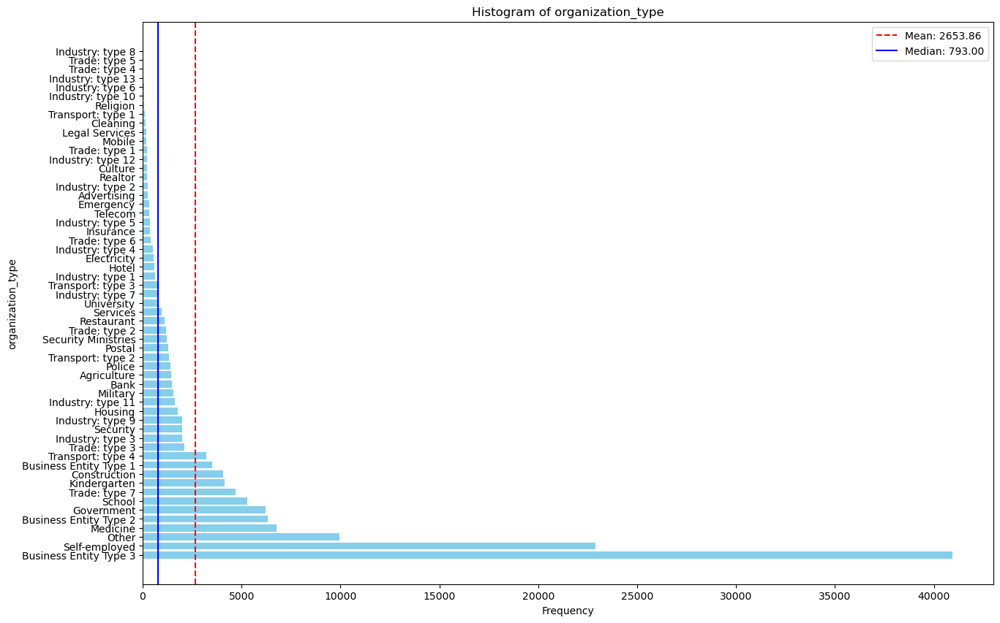

In [136]:
# Assuming 'object_column' is the object data column
organization_type_column = 'organization_type'

# Count the frequency of each category
category_counts = df_clean[organization_type_column].value_counts()

# Plot histogram horizontally
plt.figure(figsize=(15, 10))  # Adjust figsize as needed
plt.barh(category_counts.index, category_counts.values, color='skyblue')

# Calculate mean and median
mean_val = category_counts.mean()
median_val = category_counts.median()

# Plot mean and median as vertical lines
plt.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Add labels and title
plt.xlabel('Frequency')
plt.ylabel(organization_type_column)
plt.title(f'Histogram of {organization_type_column}')

# Add legend
plt.legend()

# Show plot
plt.show()

Now lets go ahead and fill in the column with the value name 'other'

In [138]:
# Replace null values with a custom value like 'other'
df_clean['organization_type'] = df_clean['organization_type'].fillna('Other')

In [139]:
# To extract the value counts of the variableorganization type
value_counts_with_nan = df_clean['organization_type'].value_counts(dropna=False)

# To print the count of unique values including NaN
print(value_counts_with_nan)

# To sum up all the unique values including NaN
unique_sum_with_nan = value_counts_with_nan.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan)

organization_type
Other                     43197
Business Entity Type 3    40943
Self-employed             22877
Medicine                   6752
Business Entity Type 2     6332
Government                 6225
School                     5303
Trade: type 7              4692
Kindergarten               4150
Construction               4075
Business Entity Type 1     3529
Transport: type 4          3228
Trade: type 3              2093
Industry: type 3           2011
Security                   1993
Industry: type 9           1983
Housing                    1786
Industry: type 11          1613
Military                   1548
Bank                       1493
Agriculture                1439
Police                     1406
Transport: type 2          1347
Postal                     1311
Security Ministries        1205
Trade: type 2              1200
Restaurant                 1094
Services                    944
University                  793
Industry: type 7            777
Transport: type 3     

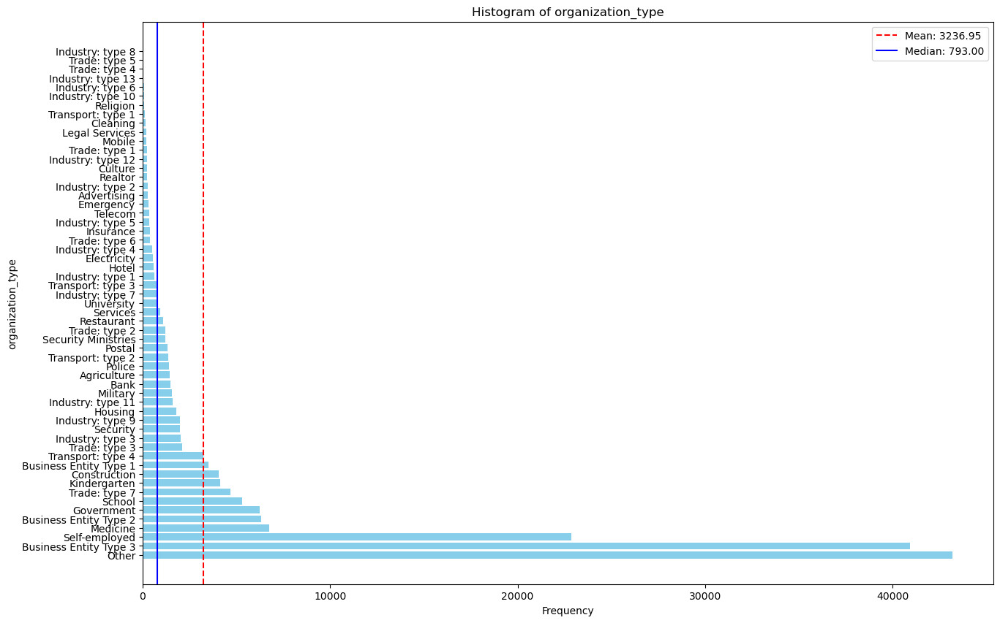

In [140]:
# Assuming 'object_column' is the object data column
organization_type_column = 'organization_type'

# Count the frequency of each category
category_counts = df_clean[organization_type_column].value_counts()

# Plot histogram horizontally
plt.figure(figsize=(15, 10))  # Adjust figsize as needed
plt.barh(category_counts.index, category_counts.values, color='skyblue')

# Calculate mean and median
mean_val = category_counts.mean()
median_val = category_counts.median()

# Plot mean and median as vertical lines
plt.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
plt.axvline(median_val, color='blue', linestyle='-', label=f'Median: {median_val:.2f}')

# Add labels and title
plt.xlabel('Frequency')
plt.ylabel(organization_type_column)
plt.title(f'Histogram of {organization_type_column}')

# Add legend
plt.legend()

# Show plot
plt.show()

The 'Other' has surpassed the Business Entity Type 3 value. The mean has a slight increase and so has the median. Lets keep this column for now and analyse if this column is required <br>
further ahead in the project

Now lets look at our last Missing Valued Column.

In [142]:
# To find the missing values in the Dataset
df_clean.isna().sum().sort_values()

sk_id_curr         0
flag_document_7    0
flag_document_6    0
flag_document_5    0
flag_document_4    0
                  ..
flag_emp_phone     0
flag_mobil         0
occupation_type    0
target             0
code_gender        2
Length: 73, dtype: int64

In [143]:
# To extract the value counts of the variable code gender
value_counts_with_nan = df_clean['code_gender'].value_counts(dropna=False)

# To print the count of unique values including NaN
print(value_counts_with_nan)

# To sum up all the unique values including NaN
unique_sum_with_nan = value_counts_with_nan.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan)

code_gender
F      121357
M       63147
NaN         2
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Since there are only 2 missing values, lets fill it with the most frequent value present in the column, which is the female.

In [145]:
# Fill missing values with the most frequent value (mode) in the column
most_frequent_value = df_clean['code_gender'].mode()[0]
df_clean['code_gender'] = df_clean['code_gender'].fillna(most_frequent_value)

# Verify that missing values are filled
print(df_clean['code_gender'].value_counts())

code_gender
F    121359
M     63147
Name: count, dtype: int64


Lets check if the all the columns have now been filled in and dont have any null values

In [147]:
# To check null values in the Dataset
df_clean.isna().sum().sort_values()

sk_id_curr                0
flag_document_7           0
flag_document_6           0
flag_document_5           0
flag_document_4           0
                         ..
flag_emp_phone            0
flag_mobil                0
days_id_publish           0
reg_city_not_live_city    0
target                    0
Length: 73, dtype: int64

As you can see there are no null values present in the data, lets check the shape of the dataset

In [149]:
# Shape of the Dataset
df_clean.shape

(184506, 73)

The total rows are the same at 184506 and 73 columns

In [151]:
# summary that includes the number of non-null values and data types of each column 
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184506 entries, 0 to 184505
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   sk_id_curr                   184506 non-null  int64  
 1   name_contract_type           184506 non-null  object 
 2   code_gender                  184506 non-null  object 
 3   flag_own_car                 184506 non-null  object 
 4   flag_own_realty              184506 non-null  object 
 5   cnt_children                 184506 non-null  int64  
 6   amt_income_total             184506 non-null  float64
 7   amt_credit                   184506 non-null  float64
 8   amt_annuity                  184506 non-null  float64
 9   amt_goods_price              184506 non-null  float64
 10  name_type_suite              184506 non-null  object 
 11  name_income_type             184506 non-null  object 
 12  name_education_type          184506 non-null  object 
 13 

We now have 20 Float, 41 Int and 11 Object Datatypes with no null. We may require further data cleaning, but lets move on to the EDA part of the project to study the variables in depth, Before moving on to the next section of our project lets <br> go ahead and convert the 20 Floats to Int for easy interpretation of data.

# Part 2 - <ins> Preliminary Exploratory Data Analysis 1 <a id='preliminaryeda'></a> <ins>

## STUDY OF INDIVIDUAL VARIABLES <a id='Individualvariables'></a> <ins>

In this section lets read each and every column and see if its relatively needed in the dataset. Whether there are any outliers and requires further deletion of the column itself or rows associated with it. 

After further analysis in this part of the project, we may be able to understand if further cleaning is required or not based on their relationship study with a dependant variable or other similar kind of variables



#### REGION_POPULATION_RELATIVE - Normalized population of region where client lives (higher number means the client lives in more populated region) - This is a Float column which is a decimal below one. Converting to integer converts all the decimals to 0

In [157]:
df_clean["region_population_relative"].describe()

count    184506.000000
mean          0.020868
std           0.013818
min           0.000290
25%           0.010006
50%           0.018850
75%           0.028663
max           0.072508
Name: region_population_relative, dtype: float64

In [158]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['region_population_relative'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

region_population_relative
0.000290       1
0.000533      24
0.000938      14
0.001276     336
0.001333     148
            ... 
0.031329    6838
0.032561    4006
0.035792    9920
0.046220    8082
0.072508    5009
Name: count, Length: 81, dtype: int64
Sum of unique values including NaN: 184506


All of the scores are starting with a decimal so I believe there has been some math behind the score that was derived. The highest score being the 0.072508

In [160]:
# List of columns to exclude from conversion
exclude_columns = ['region_population_relative', 'ext_source_2', 'ext_source_3']

# Loop through each float column in the DataFrame
for column in df_clean.select_dtypes(include=['float']):
    # Check if the column is not in the exclude list
    if column not in exclude_columns:
        # Convert the column to integers
        df_clean[column] = df_clean[column].astype(int)

In [161]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184506 entries, 0 to 184505
Data columns (total 73 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   sk_id_curr                   184506 non-null  int64  
 1   name_contract_type           184506 non-null  object 
 2   code_gender                  184506 non-null  object 
 3   flag_own_car                 184506 non-null  object 
 4   flag_own_realty              184506 non-null  object 
 5   cnt_children                 184506 non-null  int64  
 6   amt_income_total             184506 non-null  int32  
 7   amt_credit                   184506 non-null  int32  
 8   amt_annuity                  184506 non-null  int32  
 9   amt_goods_price              184506 non-null  int32  
 10  name_type_suite              184506 non-null  object 
 11  name_income_type             184506 non-null  object 
 12  name_education_type          184506 non-null  object 
 13 

#### SK_ID_CURR - ID of loan in our sample

We may not need this column as we dont have more than one data to compare the figures with based on this column. This will be just a unique number for the whole of 151270 rows that we have in this dataset. It will <br> be safe to assume that deleting this column will not skew the data further. 

In [164]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['sk_id_curr'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

sk_id_curr
100003    1
100004    1
100006    1
100008    1
100009    1
         ..
456246    1
456248    1
456251    1
456253    1
456254    1
Name: count, Length: 184506, dtype: int64
Sum of unique values including NaN: 184506


In [165]:
# To drop the column 'sk_id_curr' from our Datafram df-clean
df_clean.drop(columns='sk_id_curr', inplace=True)

In [166]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 184506 entries, 0 to 184505
Data columns (total 72 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           184506 non-null  object 
 1   code_gender                  184506 non-null  object 
 2   flag_own_car                 184506 non-null  object 
 3   flag_own_realty              184506 non-null  object 
 4   cnt_children                 184506 non-null  int64  
 5   amt_income_total             184506 non-null  int32  
 6   amt_credit                   184506 non-null  int32  
 7   amt_annuity                  184506 non-null  int32  
 8   amt_goods_price              184506 non-null  int32  
 9   name_type_suite              184506 non-null  object 
 10  name_income_type             184506 non-null  object 
 11  name_education_type          184506 non-null  object 
 12  name_family_status           184506 non-null  object 
 13 

#### NAME_CONTRACT_TYPE - Identification if loan is cash or revolving

In [168]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_contract_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_contract_type
Cash loans         167013
Revolving loans     17493
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Now for the purpose of my project, I am not quite sure if keeping this column or deleting this will be safe. As Mortgage/Home loans come under Cash loans. We may have to study the variables <br> later to see the necessity of the column being in this dataset or not. For the purpose of our argument here, the majority of appicants has a Cash loan.

In [170]:
def pie_maker(df_clean, column):
    plt.figure(figsize=(10, 15))
    plt.pie(df_clean[column].value_counts(), 
            labels=None, 
            autopct='%1.1f%%', 
            colors=sns.color_palette('colorblind'))
    
    # Adding legend
    plt.legend(df_clean[column].value_counts().index, 
               title=column, 
               loc='center left', 
               bbox_to_anchor=(1, 0.5))
    
    # Adding title
    plt.title(f'Distribution of {column}')
    
    plt.show()

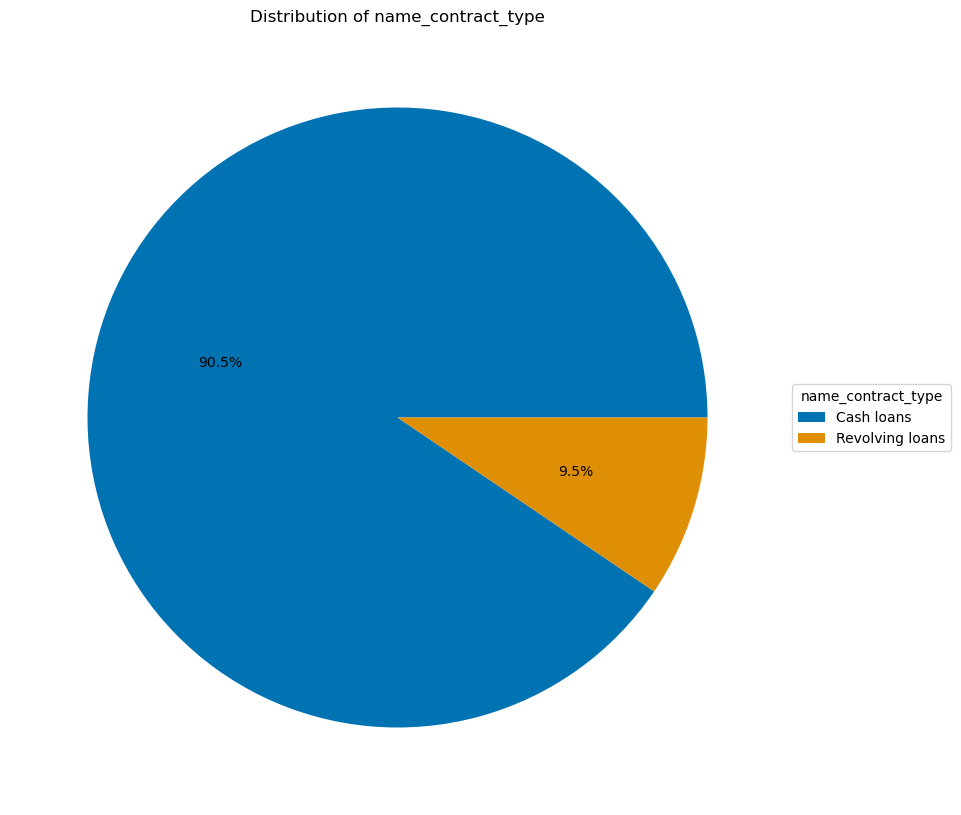

In [171]:
pie_maker(df_clean,'name_contract_type')

#### CODE_GENDER - Gender of the client

In [173]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['code_gender'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

code_gender
F    121359
M     63147
Name: count, dtype: int64
Sum of unique values including NaN: 184506


We had 2 Nan Values in this column, for which we filled with the mode that was the highest gendered applicant in this dataset. Since the Nan values were just 2, either deleting the row or the method we undertook <br> wouldnt cause any major outlier. The majority of applicants as per the results above are females.

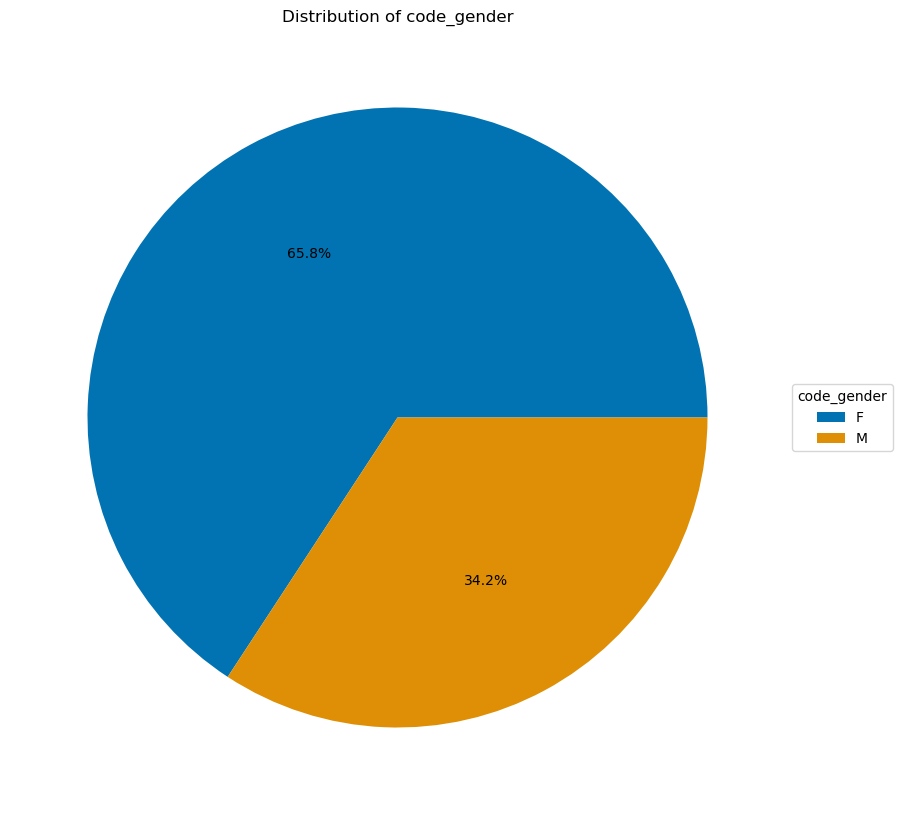

In [175]:
pie_maker(df_clean,'code_gender')

#### FLAG_OWN_CAR - Flag if the client owns a car

In [177]:
df_clean["flag_own_car"].describe()

count     184506
unique         2
top            N
freq      121630
Name: flag_own_car, dtype: object

In [178]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['flag_own_car'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

flag_own_car
N    121630
Y     62876
Name: count, dtype: int64
Sum of unique values including NaN: 184506


This is a simple Yes or No column. where the majority of the applicants does not own a car.

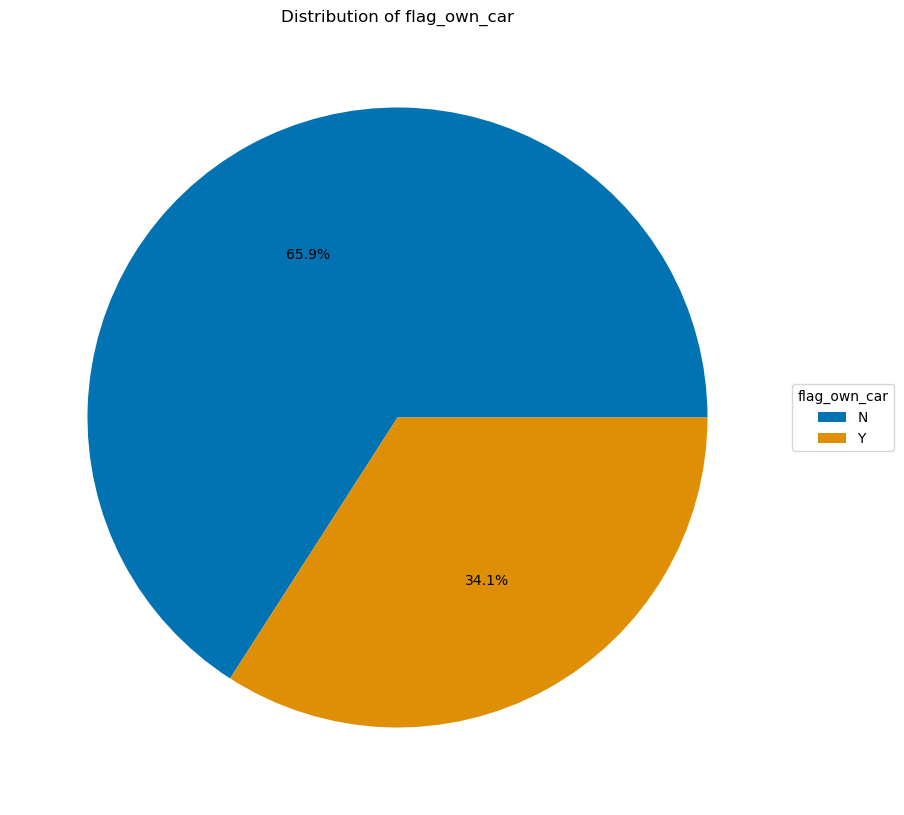

In [180]:
pie_maker(df_clean,'flag_own_car')

#### FLAG_OWN_REALTY - Flag if client owns a house or flat

In [182]:
df_clean["flag_own_realty"].describe()

count     184506
unique         2
top            Y
freq      128059
Name: flag_own_realty, dtype: object

In [183]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['flag_own_realty'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

flag_own_realty
N     56447
Y    128059
Name: count, dtype: int64
Sum of unique values including NaN: 184506


This is a simple No or an Yes Column. Now we may have to determine if this is the second home in addition to the home on which the loan has been approved. Lets look into this later in our project. As per the results <br> above, the majority of the applicants owns a house (Lets safely assume this is the second home we are referring to here for now)

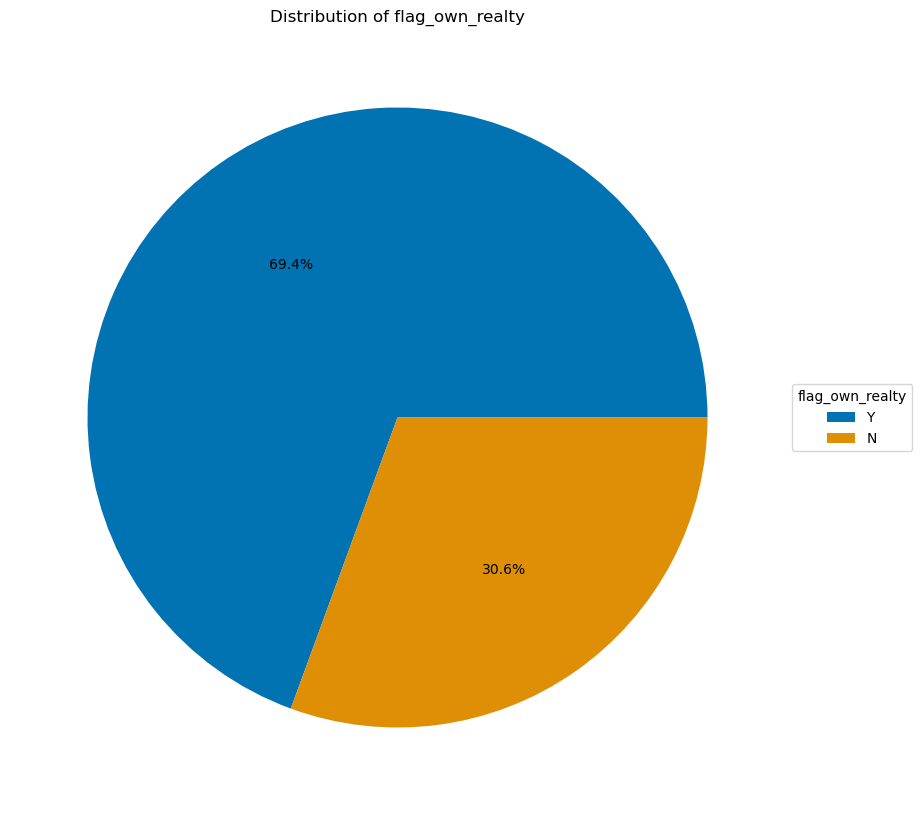

In [185]:
pie_maker(df_clean,'flag_own_realty')

#### CNT_CHILDREN -Number of children the client has


In [187]:
df_clean["cnt_children"].describe()

count    184506.000000
mean          0.416463
std           0.719614
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: cnt_children, dtype: float64

In [188]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['cnt_children'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

cnt_children
0     129082
1      36984
2      15938
3       2190
4        237
5         48
6         12
7          5
8          2
9          2
10         1
12         2
14         2
19         1
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Maximum number of applicants have 0 children with one applicant having 19 children. Now if this has a relation with defualted payments or not will have to be looked at.

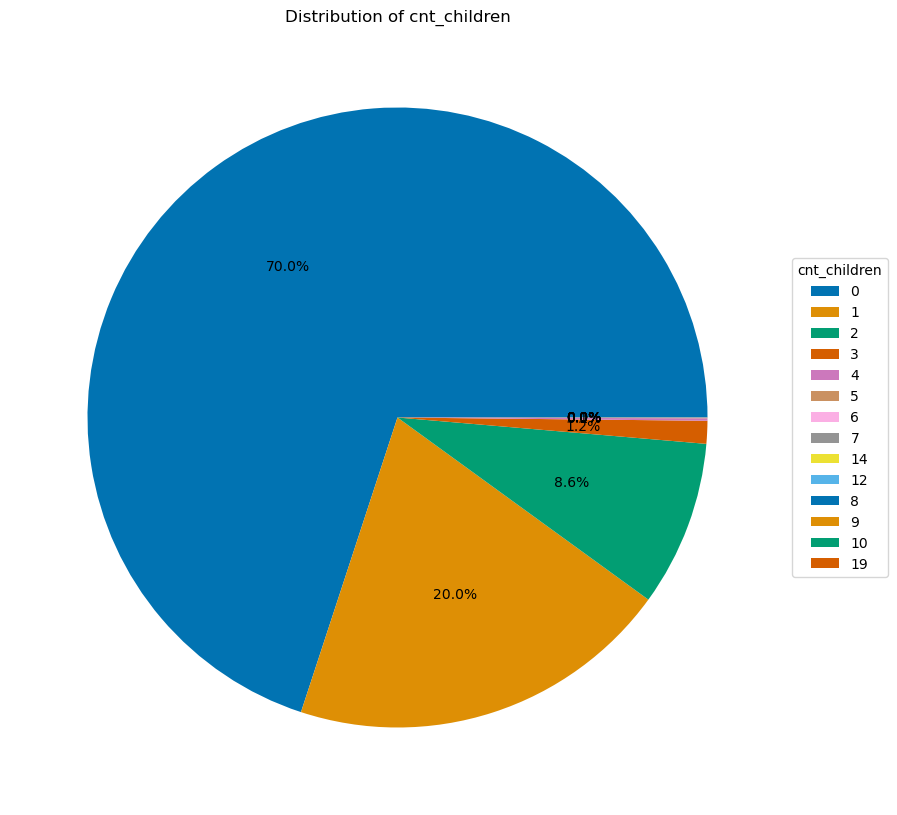

In [190]:
pie_maker(df_clean,'cnt_children')

#### AMT_INCOME_TOTAL - Income of the client

This is a very important column that helps us determine if the default occurs based on the income of the applicant or not. Lets see the column in detail.

In [193]:
df_clean["amt_income_total"].describe()

count    1.845060e+05
mean     1.689985e+05
std      2.942453e+05
min      2.610000e+04
25%      1.125000e+05
50%      1.485000e+05
75%      2.025000e+05
max      1.170000e+08
Name: amt_income_total, dtype: float64

In [194]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['amt_income_total'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

amt_income_total
26100         1
26460         1
26550         1
27000        40
27585         1
             ..
4500000       1
9000000       1
13500000      1
18000090      1
117000000     1
Name: count, Length: 1768, dtype: int64
Sum of unique values including NaN: 184506


The highest income earned by an applicant is reported at 117000000 (Lets keep this as US Dollars for the purpose of this project) and the lowest being 26550 US Dollars. We may have to study this column in detail <br> and read the relationship with the dependant variable in our case would be the target column. 

#### AMT_CREDIT - Credit amount of the loan

In [197]:
df_clean["amt_credit"].describe()

count    1.845060e+05
mean     5.992853e+05
std      4.021982e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.155290e+05
75%      8.086500e+05
max      4.050000e+06
Name: amt_credit, dtype: float64

In [198]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['amt_credit'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

amt_credit
45000      144
47970      136
48519        1
49455       12
49500       25
          ... 
3600000      2
3860019      1
4027680      1
4031032      1
4050000      3
Name: count, Length: 4855, dtype: int64
Sum of unique values including NaN: 184506


Again this will have to be analysed later during our project, if this variable is needed or not. The highest credit being 4050000 and lowest being 45000, quite similar to the Amt_goods_price column. 

#### AMT_ANNUITY - Loan annuity


In [201]:
df_clean["amt_annuity"].describe()

count    184506.000000
mean      27114.229554
std       14468.400786
min        1615.000000
25%       16555.000000
50%       24939.000000
75%       34596.000000
max      258025.000000
Name: amt_annuity, dtype: float64

In [202]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['amt_annuity'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

amt_annuity
1615       1
1980       1
1993       1
2164       2
2173       1
          ..
213160     1
213291     1
220297     1
225000    16
258025     1
Name: count, Length: 12413, dtype: int64
Sum of unique values including NaN: 184506


The highest monthly or equal installments an applicant pays is around 258025 US dollars. (We can keep the denomination in 'US dollars' for the purpose of this project). Again we may have to analyse if this variable <br> is required during the modeling phase of this project.

#### AMT_GOODS_PRICE - For consumer loans it is the price of the goods for which the loan is given (In our case this will be the home on which the loan was issued)

In [205]:
df_clean["amt_goods_price"].describe()

count    1.845060e+05
mean     5.387066e+05
std      3.692294e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: amt_goods_price, dtype: float64

In [206]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['amt_goods_price'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

amt_goods_price
40500        1
45000      704
49500      101
54000      174
58500      199
          ... 
3375000      2
3555000      1
3600000      3
3712500      1
4050000      3
Name: count, Length: 793, dtype: int64
Sum of unique values including NaN: 184506


The highest amount of goods/asset the loan was issued on is 4050000.  We can keep the denomination in 'US dollars' for the purpose of this project. The lowest priced being $40500. I dont see any particular outlier

#### NAME_TYPE_SUITE - Who was accompanying client when he was applying for the loan

In [209]:
df_clean["name_type_suite"].describe()

count            184506
unique                7
top       Unaccompanied
freq             149829
Name: name_type_suite, dtype: object

In [210]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_type_suite'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_type_suite
Children             1982
Family              24044
Group of people       173
Other_A               528
Other_B              1081
Spouse, partner      6869
Unaccompanied      149829
Name: count, dtype: int64
Sum of unique values including NaN: 184506


This was one of those variables which had a good amount of Nan values and we filled the Nan values with the term 'Unaccompanied'. That constitutes the majority of our data right now with around 123557 applicants. <br> We can either think of keeping this column or delete the column depending on how the variable is related with the rest of the dataset.

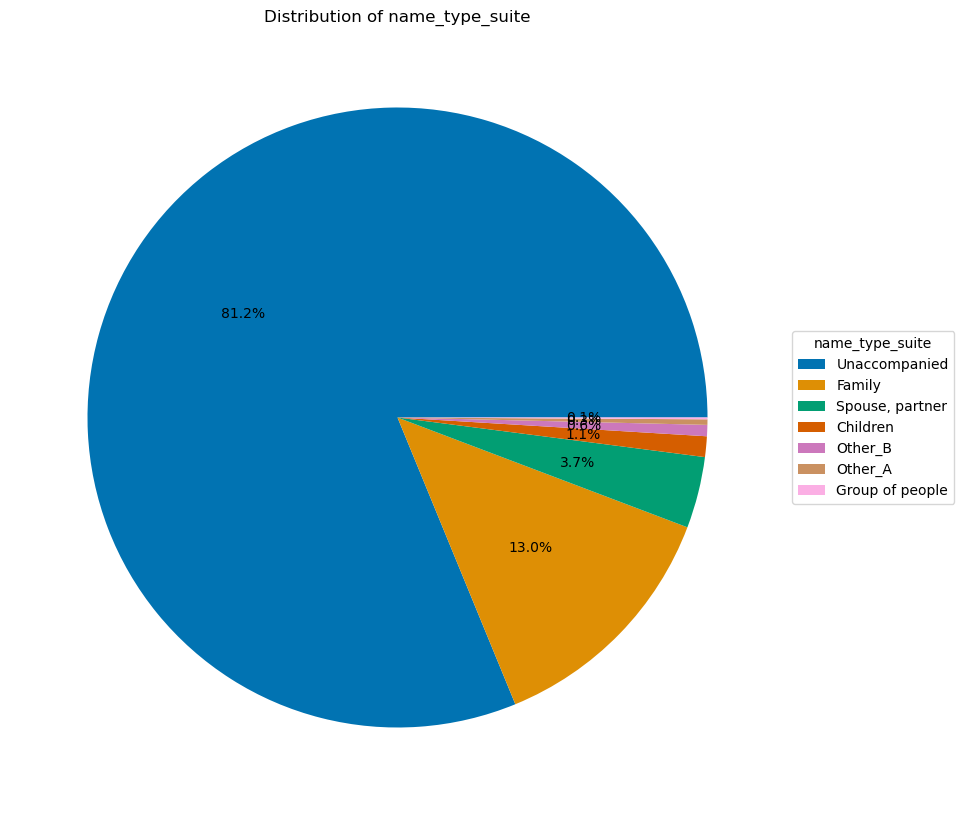

In [212]:
pie_maker(df_clean,'name_type_suite')

#### NAME_INCOME_TYPE

In [214]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_income_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_income_type
Businessman                 6
Commercial associate    42967
Maternity leave             2
Pensioner               33227
State servant           12981
Student                     6
Unemployed                 15
Working                 95302
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Income type can never be Maternity leave so this row should be removed. When considering converting this column to a binary data tyye and create dummy variable during our Feature Engineering <br>this should be considered deleteing


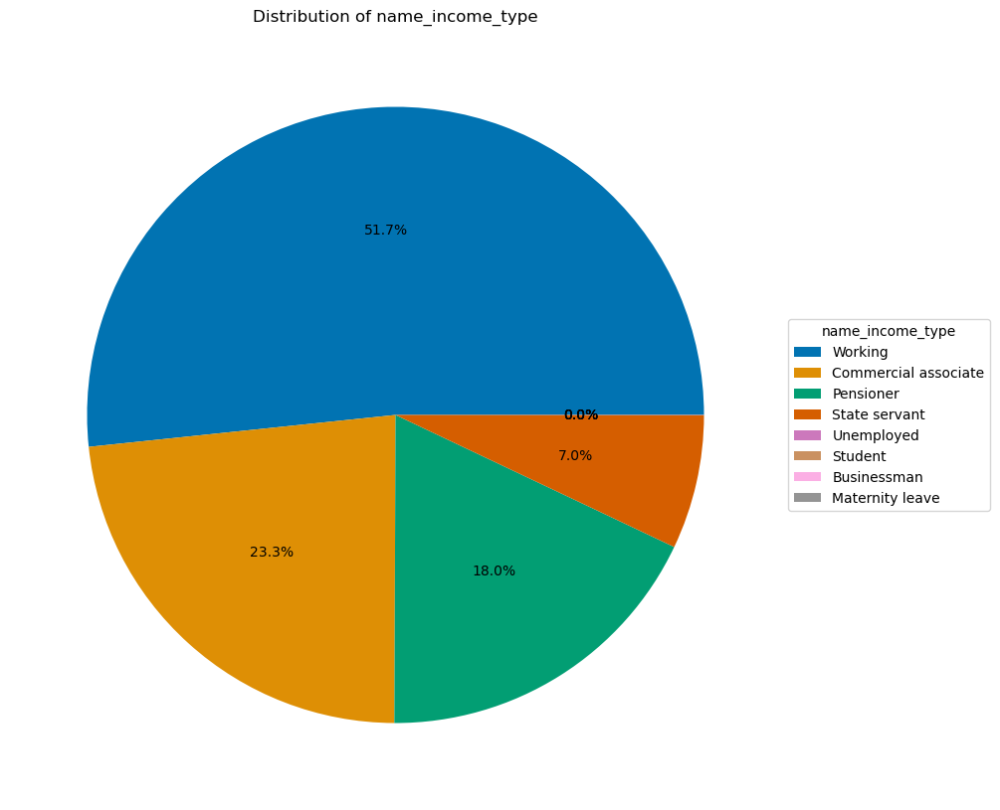

In [216]:
pie_maker(df_clean,'name_income_type')

#### NAME_EDUCATION_TYPE - Level of highest education the client achieved

In [218]:
df_clean["name_education_type"].describe()

count                            184506
unique                                5
top       Secondary / secondary special
freq                             131092
Name: name_education_type, dtype: object

In [219]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_education_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_education_type
Academic degree                     103
Higher education                  44810
Incomplete higher                  6179
Lower secondary                    2322
Secondary / secondary special    131092
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Varied range of Education levels are indicated above. The highest number applicants have a secondary / secondary special education status. No outliers found.

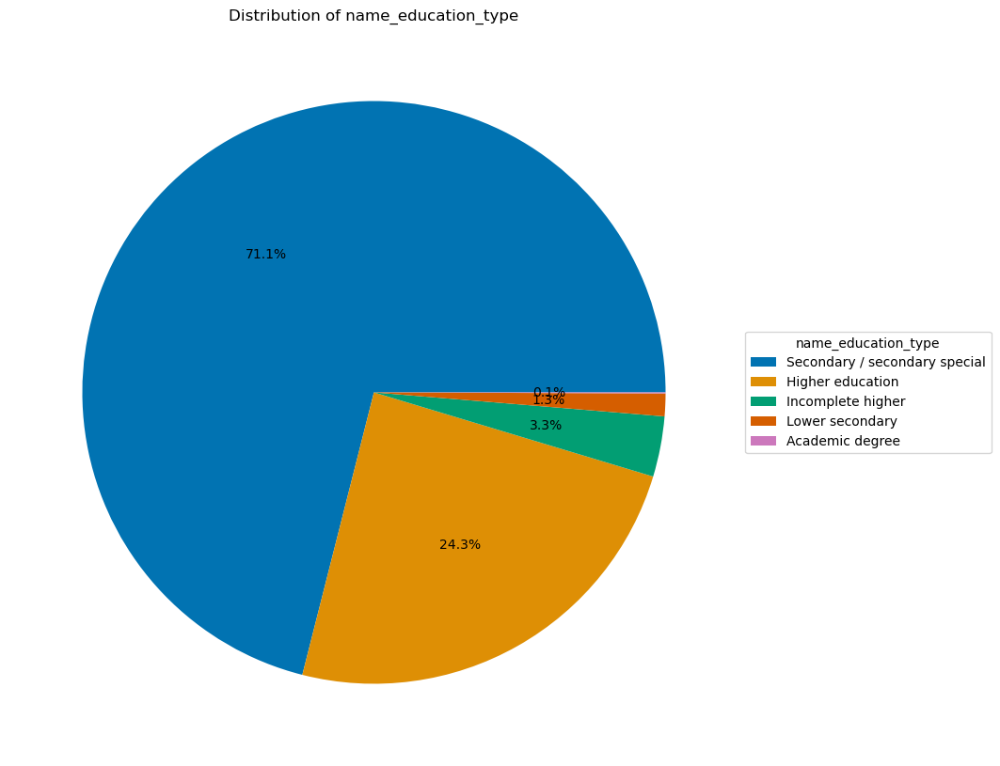

In [221]:
pie_maker(df_clean,'name_education_type')

#### NAME_FAMILY_STATUS - Family status of the client

In [223]:
df_clean["name_family_status"].describe()

count      184506
unique          6
top       Married
freq       117746
Name: name_family_status, dtype: object

In [224]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_family_status'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_family_status
Civil marriage           18094
Married                 117746
Separated                11904
Single / not married     27130
Unknown                      1
Widow                     9631
Name: count, dtype: int64
Sum of unique values including NaN: 184506


Good amount of data regarding the family status of the applicant is seen in this column. There is a column named Unkown, which we may need to assess later during the project. Majority of the applicants are married.

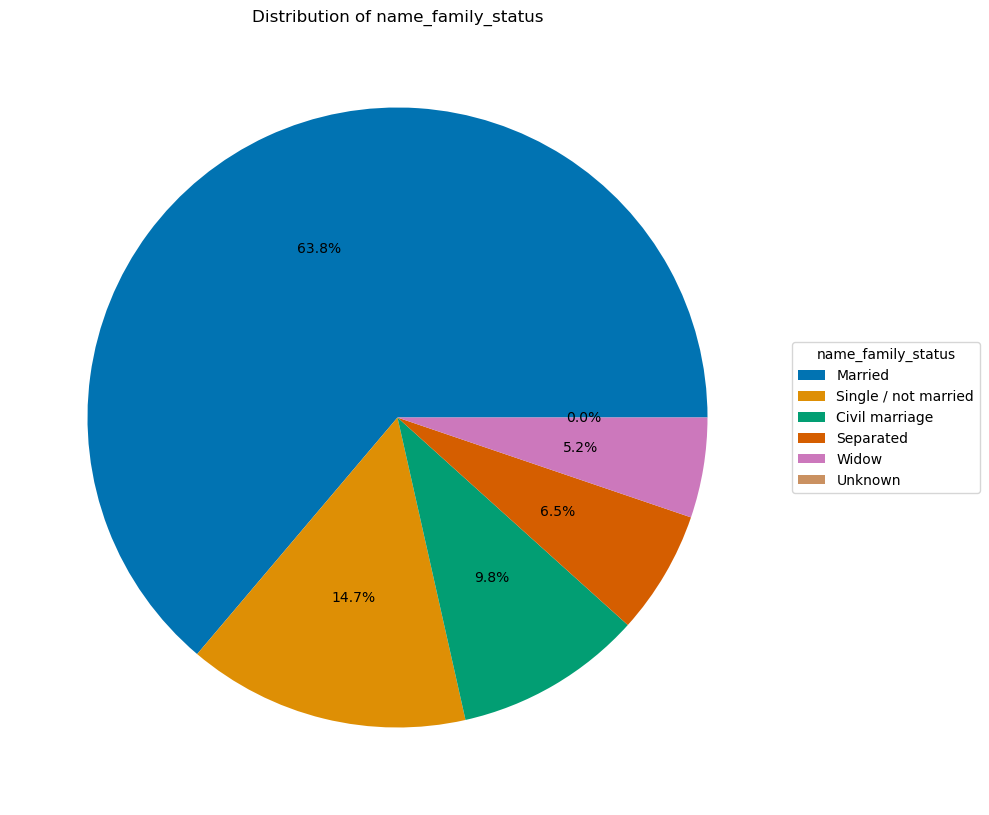

In [226]:
pie_maker(df_clean,'name_family_status')

#### NAME_HOUSING_TYPE - What is the housing situation of the client (renting, living with parents, ...)

In [228]:
df_clean["name_housing_type"].describe()

count                184506
unique                    6
top       House / apartment
freq                 163818
Name: name_housing_type, dtype: object

In [229]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['name_housing_type'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

name_housing_type
Co-op apartment           669
House / apartment      163818
Municipal apartment      6622
Office apartment         1586
Rented apartment         2943
With parents             8868
Name: count, dtype: int64
Sum of unique values including NaN: 184506


This is a fair amount of important data regarding the housing situation of the applicant. This could be useful while creating our models further.

In [231]:
# Get value counts including NaN and sort them in descending order by count
value_counts_with_nan_sorted = df_clean['region_population_relative'].value_counts(dropna=False).sort_values(ascending=False)

# Print the count of unique values including NaN sorted by count
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

region_population_relative
0.035792    9920
0.046220    8082
0.030755    7247
0.025164    7184
0.026392    6993
            ... 
0.001417     288
0.001333     148
0.000533      24
0.000938      14
0.000290       1
Name: count, Length: 81, dtype: int64
Sum of unique values including NaN: 184506


In the above result,  the max number of applicants come from a region that is scored 0.035792 with relation to the total population in that region.

#### DAYS_BIRTH - Client's age in days at the time of application

In [234]:
df_clean["days_birth"].describe()

count    184506.000000
mean     -16036.718307
std        4361.484692
min      -25201.000000
25%      -19677.000000
50%      -15747.000000
75%      -12416.000000
max       -7489.000000
Name: days_birth, dtype: float64

In [235]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['days_birth'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

days_birth
-25201    1
-25195    1
-25191    1
-25187    1
-25184    1
         ..
-7680     6
-7678     2
-7676     1
-7673     1
-7489     1
Name: count, Length: 17334, dtype: int64
Sum of unique values including NaN: 184506


The max age as per the above results is 25180 days which denotes 68 years old. In real technical world, not sure if an applicant is allowed to apply for a home loan at this age. Further research in this is required

#### DAYS_EMPLOYED - How many days before the application the person started current employment

Lets look at the basic summary statistics of this column. 

In [239]:
df_clean["days_employed"].describe()

count    184506.000000
mean      63838.583271
std      141295.297587
min      -17912.000000
25%       -2757.000000
50%       -1211.000000
75%        -289.000000
max      365243.000000
Name: days_employed, dtype: float64

As per the results above, the max value of the column says an applicant could have started his/her current employment 365243 days before his loan application. Which could mean:

In [241]:
# Lets convert the days to years
df_clean["days_employed"].max()/365

1000.6657534246575

The result above says an applicant could have started his/her current employment approximately 1000 years before his loan application, which doesnt make any sense. Therefore, I am deciding to remove this column.

In [243]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['days_employed'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

days_employed
-17912         1
-17583         1
-17531         1
-17522         1
-17170         1
           ...  
-3             2
-2             2
-1             1
 0             2
 365243    33236
Name: count, Length: 11404, dtype: int64
Sum of unique values including NaN: 184506


As you can see above in the results, the number 365243 is also not a negative and also it denotes 1000 years. Therefore I am looking to remove the rows containing this figure. 

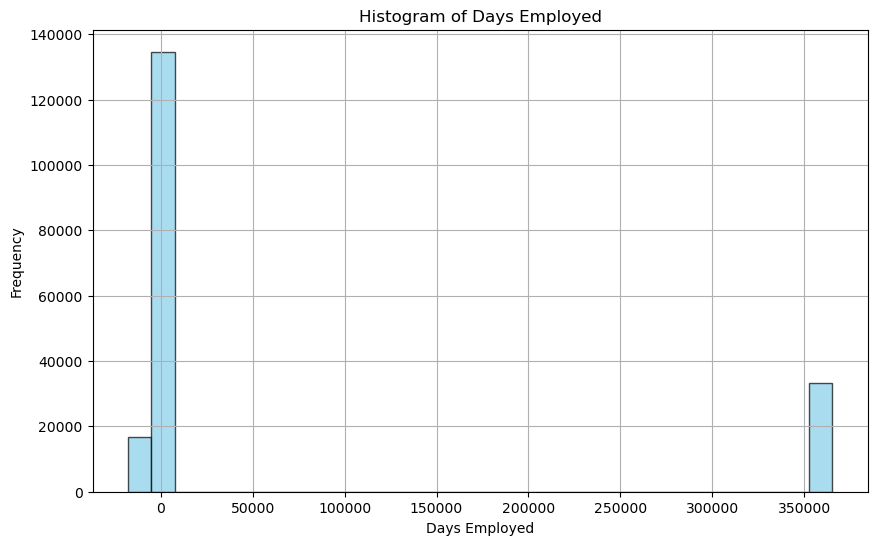

In [245]:
# Plot histogram for the column 'days_employed'
plt.figure(figsize=(10, 6))
plt.hist(df_clean['days_employed'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Histogram of Days Employed')
plt.xlabel('Days Employed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

The above plot does not show any relationship nor a representable graph which can be read. The end part of the graph shows the outlier and since its a positive figure, its best we should delete that row and keep this column as a whole and this could be useful for our analysis later. 

Lets first convert the '365243' to a NaN value so that wil be easier to drop.

In [247]:
# To convert the '365243' figure to NaN value
df_clean.loc[df_clean["days_employed"] == 365243, "days_employed"] = np.nan

In [248]:
# check for missing values in each column of the DataFrame df_clean
df_clean.isna().sum().sort_values()

name_contract_type        0
flag_document_8           0
flag_document_7           0
flag_document_6           0
flag_document_5           0
                      ...  
flag_work_phone           0
flag_emp_phone            0
flag_mobil                0
days_id_publish           0
days_employed         33236
Length: 72, dtype: int64

As we can see, the convertion to NaN has been successful, lets go ahead and drop the rows that contain this figure and it appears in 33236 rows. This should reduce the total number rows from 184506.

In [250]:
# removes rows with missing values from the DataFrame df_clean
df_clean.dropna(inplace=True)

Lets now do a sanity check to see if the rows have been dropped successfully

In [252]:
## check for missing values in each column of the DataFrame df_clean
df_clean.isna().sum().sort_values()

name_contract_type            0
flag_document_8               0
flag_document_7               0
flag_document_6               0
flag_document_5               0
                             ..
flag_work_phone               0
flag_emp_phone                0
flag_mobil                    0
amt_req_credit_bureau_year    0
target                        0
Length: 72, dtype: int64

Lets now do a quick shape check for our dataset to see if the total number of rows are reduced.

In [254]:
# Returns us the shape of the dataframe df_clean
df_clean.shape

(151270, 72)

Now we can see the Total number fo Rows have drastically reduced to 151270 from 184506 and have 72 columns. Lets now check the distribution of the column

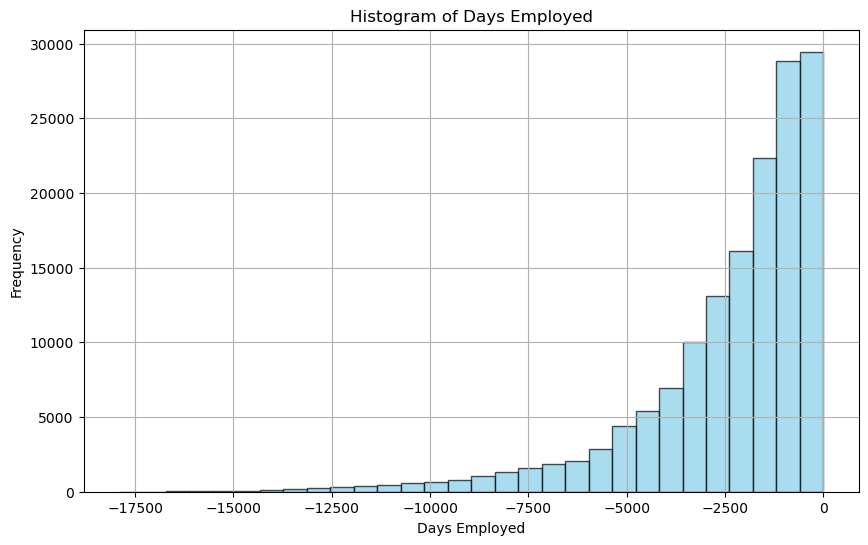

In [256]:
# Plot histogram for the column 'days_employed'
plt.figure(figsize=(10, 6))
plt.hist(df_clean['days_employed'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Histogram of Days Employed')
plt.xlabel('Days Employed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

This is a perfectly shaped graph which can be easily read with no particular outliers. This graph now shows that the largest number of applicants current job was a very recent change and this should help me in the analysis later. 

#### FLAG_DOCUMENT (2 - 21)

This on its own does not give us any kind of information. This to me looks like a dummy converted variable and the original information is missing regarding the documents been presented during the application. 

Lets look at what data we hold on each of the 20 columns under name 'flag_document'

In [260]:
# Select columns starting with 'FLAG_DOC'
flag = [data for data in df_clean.columns if 'flag_doc' in data]

df_clean[flag]

,flag_document_2,flag_document_3,flag_document_4,flag_document_5,flag_document_6,flag_document_7,flag_document_8,flag_document_9,flag_document_10,flag_document_11,flag_document_12,flag_document_13,flag_document_14,flag_document_15,flag_document_16,flag_document_17,flag_document_18,flag_document_19,flag_document_20,flag_document_21
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184498,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
184499,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
184501,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
184503,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


All documents contains very less no of 1’s except FLAG_DOCUMENT_3 so we can remove them as they cannot give much information. 

Lets see the percentage of 1's and 0's present in each column divided by the total number rows we have currently. 

In [262]:
# This gives us the percentage of times 0's and 1's appears in the flag_documents columns divided by the total number of current rows in the dataframe df_clean
for i in flag:
  a=sum(df_clean[i]==1)
  print(i, "contain no of 1's = ",(a*100/151270)," no of 0's =",(151270-a)*100/151270)

flag_document_2 contain no of 1's =  0.004627487274409995  no of 0's = 99.9953725127256
flag_document_3 contain no of 1's =  76.14001454353144  no of 0's = 23.859985456468568
flag_document_4 contain no of 1's =  0.007932835327559992  no of 0's = 99.99206716467243
flag_document_5 contain no of 1's =  1.6784557413895682  no of 0's = 98.32154425861043
flag_document_6 contain no of 1's =  0.8574072849871092  no of 0's = 99.1425927150129
flag_document_7 contain no of 1's =  0.019171018708269982  no of 0's = 99.98082898129174
flag_document_8 contain no of 1's =  9.82481655318305  no of 0's = 90.17518344681694
flag_document_9 contain no of 1's =  0.45084947444965956  no of 0's = 99.54915052555035
flag_document_10 contain no of 1's =  0.001983208831889998  no of 0's = 99.99801679116811
flag_document_11 contain no of 1's =  0.4911747206980895  no of 0's = 99.50882527930192
flag_document_12 contain no of 1's =  0.0  no of 0's = 100.0
flag_document_13 contain no of 1's =  0.44952733522839955  no 

As seen above the number of 1 (which could have indicated that the applicant did provide a particular document) is nearly 0% and the 0's appeared the majority number of times or 100% ( 0 may indicate that they did not submit the document) <br> as the description of the column says 'Did client provide document'

In any way, these columns does not serve any purpose of this project as we dont have any insider information of what kind of documents were asked and what was produced.

So therefore I am deleting them

In [264]:
# List of column names to drop
columns_to_drop = ['flag_document_2', 'flag_document_3', 'flag_document_3', 'flag_document_4', 'flag_document_5', 'flag_document_6', 'flag_document_7', 'flag_document_8', 'flag_document_9', 'flag_document_10', 'flag_document_11', 'flag_document_12', 'flag_document_13', 'flag_document_14', 'flag_document_15', 'flag_document_16', 'flag_document_17', 'flag_document_18', 'flag_document_19', 'flag_document_20', 'flag_document_21']

# Drop the specified columns from the DataFrame
df_clean = df_clean.drop(columns=columns_to_drop)

This above code should have deleted the 20 columns. Lets check if this has done the job

In [266]:
df_clean.shape

(151270, 52)

The Columns have now drastically reduced to 52. Lets quickly do a datatype summary

In [268]:
# summary that includes the number of non-null values and data types of each column
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   flag_own_realty              151270 non-null  object 
 4   cnt_children                 151270 non-null  int64  
 5   amt_income_total             151270 non-null  int32  
 6   amt_credit                   151270 non-null  int32  
 7   amt_annuity                  151270 non-null  int32  
 8   amt_goods_price              151270 non-null  int32  
 9   name_type_suite              151270 non-null  object 
 10  name_income_type             151270 non-null  object 
 11  name_education_type          151270 non-null  object 
 12  name_family_status           151270 non-null  object 
 13  name

Now we have 21 Float, 20 int and 11 Object. We will have to evaluate this huge number of Oject datatype for later during the Feature Engineering section of our project. 

Now let me look at removing the sk_id_curr column as well this id does not serve any particular purpose for my project either. 

#### DAYS_REGISTRATION - How many days before the application did client change his registration

In [271]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['days_registration'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

days_registration
-22928     1
-21865     1
-20841     1
-20452     1
-19504     1
          ..
-4        57
-3        49
-2        58
-1        52
 0        35
Name: count, Length: 13703, dtype: int64
Sum of unique values including NaN: 151270


This results to some extent doesnt make any sense, as the mortgage loan is usually applied for straight after the registration of the house was done. The max number of days I see above is -22928 which denotes <br>
-22928/365 = 62 years? And more over what registration was this reffering to? 

I am therfore deciding to delete this column. Lets look at the graph for a description of the column

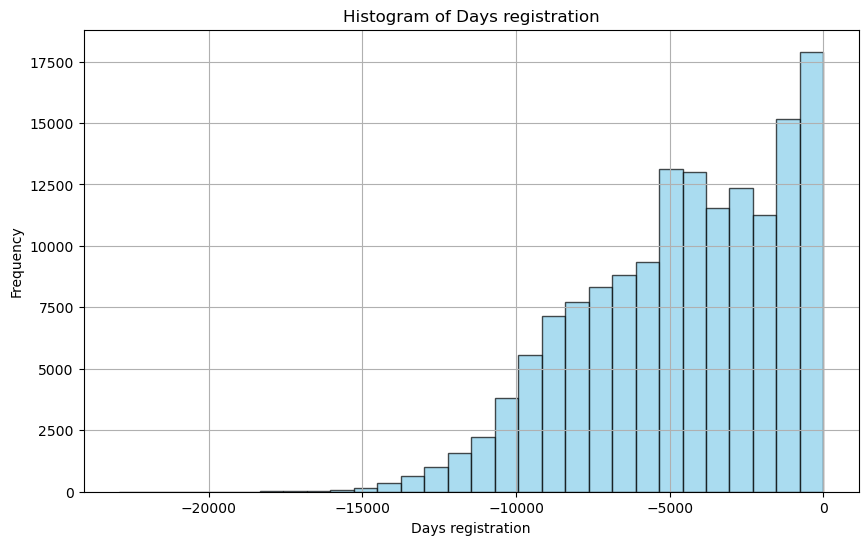

In [273]:
# Plot histogram for the column 'days_employed'
plt.figure(figsize=(10, 6))
plt.hist(df_clean['days_registration'], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Histogram of Days registration')
plt.xlabel('Days registration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

From the above graph: The range between -5000 days (around 14 years) to 0 ranges from 12500 to 17500 people, and thats just a small portion of applicants from my dataset in comparison to a total of 151270 rows. <br>

Therefore Deleting this column all together

In [275]:
# To drop the column 'days_registration' from our Datafram df-clean
df_clean.drop(columns='days_registration', inplace=True)

Lets now do a sanity check

In [277]:
# summary that includes the number of non-null values and data types of each column
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 51 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   flag_own_realty              151270 non-null  object 
 4   cnt_children                 151270 non-null  int64  
 5   amt_income_total             151270 non-null  int32  
 6   amt_credit                   151270 non-null  int32  
 7   amt_annuity                  151270 non-null  int32  
 8   amt_goods_price              151270 non-null  int32  
 9   name_type_suite              151270 non-null  object 
 10  name_income_type             151270 non-null  object 
 11  name_education_type          151270 non-null  object 
 12  name_family_status           151270 non-null  object 
 13  name

#### DAYS_ID_PUBLISH - How many days before the application did client change the identity document with which he applied for the loan

In [279]:
df_clean["days_id_publish"].describe()

count    151270.000000
mean      -2801.438362
std        1516.118899
min       -6383.000000
25%       -4179.000000
50%       -2889.000000
75%       -1486.000000
max           0.000000
Name: days_id_publish, dtype: float64

In [280]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['days_id_publish'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

days_id_publish
-6383     1
-6274     1
-6265     1
-6263     1
-6259     1
         ..
-4       34
-3       29
-2       27
-1       32
 0        9
Name: count, Length: 6044, dtype: int64
Sum of unique values including NaN: 151270


The id here could also denote a passport or a national id card, which the max number of days I could see in above results shows 6383 days which can mean around 17years ago. Some passports can be valid for 20 years so this does <br>make some sense. 

Therefore I wont be deleting this column

#### FLAG_MOBIL - Did client provide mobile phone (1=YES, 0=NO)

In [283]:
df_clean["flag_mobil"].describe()

count    151270.000000
mean          0.999993
std           0.002571
min           0.000000
25%           1.000000
50%           1.000000
75%           1.000000
max           1.000000
Name: flag_mobil, dtype: float64

In [284]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['flag_mobil'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

flag_mobil
0         1
1    151269
Name: count, dtype: int64
Sum of unique values including NaN: 151270


This is eiter an yes or a no which is fine to stay in the dataset, Similarly we have Flag_Emp_phone, Flag_work_phone, flag_cont_mobile, flag_phone, flsg_email with a simple Yes or No present in the columns. Further <br> analysis is required to see if all or either of these can be deleted. 

#### CNT_FAM_MEMBERS - How many family members does client have

In [287]:
df_clean["cnt_fam_members"].describe()

count    151270.000000
mean          2.252139
std           0.938772
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: cnt_fam_members, dtype: float64

In [288]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['cnt_fam_members'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

cnt_fam_members
1     29292
2     74064
3     31143
4     14453
5      2032
6       217
7        44
8        11
9         5
10        3
11        1
12        1
14        2
16        1
20        1
Name: count, dtype: int64
Sum of unique values including NaN: 151270


This looks fine too, majority of the applicants have one other family member with least being 20 family members. So this column looks good in the dataset for now.

#### REGION_RATING_CLIENT - Our rating of the region where client lives (1,2,3)

In [291]:
df_clean["region_rating_client"].describe()

count    151270.000000
mean          2.043888
std           0.511621
min           1.000000
25%           2.000000
50%           2.000000
75%           2.000000
max           3.000000
Name: region_rating_client, dtype: float64

In [292]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['region_rating_client'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

region_rating_client
1     16624
2    111383
3     23263
Name: count, dtype: int64
Sum of unique values including NaN: 151270


Majority of the applicants come from a region with a rating of 2. Further analysis is required to see if this column is required or no

#### REGION_RATING_CLIENT_W_CITY - Our rating of the region where client lives with taking city into account (1,2,3)

In [295]:
df_clean["region_rating_client_w_city"].describe()

count    151270.000000
mean          2.023065
std           0.505792
min           1.000000
25%           2.000000
50%           2.000000
75%           2.000000
max           3.000000
Name: region_rating_client_w_city, dtype: float64

In [296]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['region_rating_client_w_city'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

region_rating_client_w_city
1     17645
2    112491
3     21134
Name: count, dtype: int64
Sum of unique values including NaN: 151270


Again a very similar type of information as the above. Majority of the applicants come from the city that is rated 2. Further during our correlation with a heatmap could determine if one these two columns need deleting

#### WEEKDAY_APPR_PROCESS_START - On which day of the week did the client apply for the loan

In [299]:
df_clean["weekday_appr_process_start"].describe()

count      151270
unique          7
top       TUESDAY
freq        26372
Name: weekday_appr_process_start, dtype: object

In [300]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['weekday_appr_process_start'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

weekday_appr_process_start
FRIDAY       24437
MONDAY       24929
SATURDAY     16882
SUNDAY        8335
THURSDAY     24894
TUESDAY      26372
WEDNESDAY    25421
Name: count, dtype: int64
Sum of unique values including NaN: 151270


This is just a simple information that shows which day of the week does the applicant usually applied for the loan. The highest number of applicants applied on Tuesdays. Not sure if this is of any particular importance in the dataset

#### HOUR_APPR_PROCESS_START - Approximately at what hour did the client apply for the loan

In [303]:
df_clean["hour_appr_process_start"].describe()

count    151270.000000
mean         12.204046
std           3.297738
min           0.000000
25%          10.000000
50%          12.000000
75%          15.000000
max          23.000000
Name: hour_appr_process_start, dtype: float64

In [304]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['hour_appr_process_start'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

hour_appr_process_start
0        23
1        53
2       156
3       615
4      1041
5      1791
6      2717
7      4208
8      6873
9     12660
10    17835
11    18060
12    16686
13    15290
14    13881
15    12790
16    10655
17     7956
18     4879
19     2134
20      641
21      216
22       87
23       23
Name: count, dtype: int64
Sum of unique values including NaN: 151270


The most number of applicants applied at 11 am. Least being between 11 pm and midnight. Lets keep this column and see if there are any relationship between other variables later

#### REG_REGION_NOT_LIVE_REGION - Flag if client's permanent address does not match contact address (1=different, 0=same, at region level)

In [307]:
df_clean["reg_region_not_live_region"].describe()

count    151270.000000
mean          0.017280
std           0.130314
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max           1.000000
Name: reg_region_not_live_region, dtype: float64

In [308]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['reg_region_not_live_region'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

reg_region_not_live_region
0    148656
1      2614
Name: count, dtype: int64
Sum of unique values including NaN: 151270


This is a simple 1 and 0 valued column. Majority had the same contact address as in the application. Similarly we have REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY <br> and LIVE_CITY_NOT_WORK_CITY which has a 1 and 0 in their columns. Most of these should be relevant for our study as this could be a good indicator to see if the client providing all <br> matching information will not go default compared to those who dont provide them correctly. 

#### EXT_SOURCE_2 - Normalized score from external data source


This could be the credit score of the applicant. We had to delete the ext_source_1 since it had a huge number of null values and I had no other information to fill them in. Lets analyse this column and see what it contains. 

In [312]:
df_clean["ext_source_2"].describe()

count    151270.000000
mean          0.516407
std           0.189672
min           0.000001
25%           0.398753
50%           0.567089
75%           0.664089
max           0.855000
Name: ext_source_2, dtype: float64

In [313]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['ext_source_2'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

ext_source_2
0.000001     1
0.000005     1
0.000006     1
0.000006     1
0.000010     1
            ..
0.818556     1
0.819832     1
0.820487     1
0.820616     1
0.855000    13
Name: count, Length: 85401, dtype: int64
Sum of unique values including NaN: 151270


These external sources features contain a ‘normalized score from an external data source.’. We may have to see the correlation between the external sources 2 and 3 with the target variable to see if there is a negative <br> or a positive correlation present. Negative correlation would mean when the value of Ext_Source increases the applicant is more like to repay the loan and vice versa. The highest score in ext_source_2 as seen above is <br> 0.855000

#### EXT_SOURCE_3 - Normalized score from external data source

In [316]:
df_clean["ext_source_3"].describe()

count    151270.000000
mean          0.502841
std           0.196144
min           0.000527
25%           0.358951
50%           0.524496
75%           0.659406
max           0.887664
Name: ext_source_3, dtype: float64

In [317]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['ext_source_3'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

ext_source_3
0.000527    522
0.014148      1
0.014556      1
0.016078      1
0.016777      2
           ... 
0.880268     23
0.881027      3
0.882530     16
0.885488      2
0.887664      1
Name: count, Length: 787, dtype: int64
Sum of unique values including NaN: 151270


Again this is the same as the previous column. Provided I see a largest number of applicants here on the lowest score. We may have to filter by the number of applicants to read this column better.

In [319]:
# Get value counts including NaN and sort them in descending order by count
value_counts_with_nan_sorted = df_clean['ext_source_3'].value_counts(dropna=False).sort_values(ascending=False)

# Print the count of unique values including NaN sorted by count
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

ext_source_3
0.746300    862
0.713631    804
0.694093    745
0.595456    728
0.554947    691
           ... 
0.023225      1
0.025272      1
0.020311      1
0.018266      1
0.023062      1
Name: count, Length: 787, dtype: int64
Sum of unique values including NaN: 151270


Now, this has given a better understanding of the column. The largest number of applicants are on a higher score not possibly the highest and defintely not in the lowest of score available.

#### OBS_30_CNT_SOCIAL_CIRCLE - How many observation of client's social surroundings with observable 30 DPD (days past due) default

In [322]:
df_clean["obs_30_cnt_social_circle"].describe()

count    151270.000000
mean          1.420652
std           2.466119
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max         348.000000
Name: obs_30_cnt_social_circle, dtype: float64

In [323]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['obs_30_cnt_social_circle'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

obs_30_cnt_social_circle
0      80544
1      24321
2      14911
3      10008
4       7054
5       4626
6       3175
7       2194
8       1483
9        986
10       640
11       403
12       339
13       181
14       132
15        86
16        46
17        38
18        22
19        22
20        14
21        11
22         8
23        11
24         3
25         5
27         3
29         1
30         2
348        1
Name: count, dtype: int64
Sum of unique values including NaN: 151270


I dont particularly understand the need to have this column in this dataset. I will have to find the relationship between this column and target variable to understand this better. Similarly I have 3 more columns namely DEF_30_CNT_SOCIAL_CIRCLE, <br> OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE. all these variables I believe has a correlation between the target variables. L 

#### DAYS_LAST_PHONE_CHANGE - How many days before application did client change phone

In [326]:
df_clean["days_last_phone_change"].describe()

count    151270.000000
mean       -970.449157
std         828.346448
min       -4185.000000
25%       -1577.000000
50%        -762.000000
75%        -286.000000
max           0.000000
Name: days_last_phone_change, dtype: float64

In [327]:
# Get value counts including NaN and sort them in ascending order by index
value_counts_with_nan_sorted = df_clean['days_last_phone_change'].value_counts(dropna=False).sort_index()

# Print the count of unique values including NaN in ascending order
print(value_counts_with_nan_sorted)

# Sum up all the unique values including NaN
unique_sum_with_nan_sorted = value_counts_with_nan_sorted.sum()
print("Sum of unique values including NaN:", unique_sum_with_nan_sorted)

days_last_phone_change
-4185        1
-4173        1
-4153        1
-4131        1
-4128        1
         ...  
-4         729
-3         886
-2        1088
-1        1431
 0       17377
Name: count, Length: 3658, dtype: int64
Sum of unique values including NaN: 151270


Majority of the applicants changed their phones just on the day of applying for the loans. This does not make any sense. And the longest that an applicant has changed their phones before the application was 11 years (-4185 days)

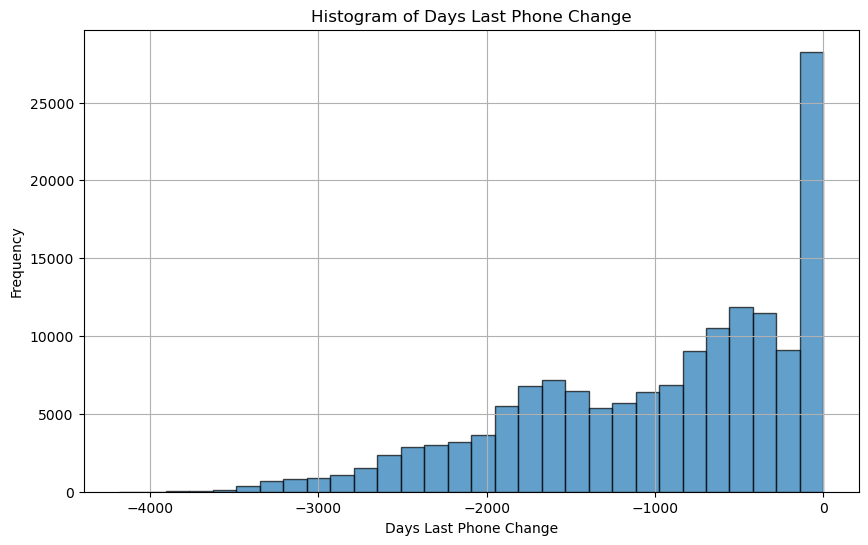

In [329]:
# Plot histogram for days_last_phone_change
plt.figure(figsize=(10, 6))
plt.hist(df_clean['days_last_phone_change'], bins=30, edgecolor='black', alpha=0.7)
plt.xlabel('Days Last Phone Change')
plt.ylabel('Frequency')
plt.title('Histogram of Days Last Phone Change')
plt.grid(True)
plt.show()

## Relationship Analysis <a id='relationship'></a> <ins>

The Target Variable will be our dependant variable against which we can study the rest of the columns to see their relationships and analyse if they are positively or negatively correlated. Lets go ahead and analyse the Target Variable first.

In [332]:
df_clean["target"].value_counts(normalize=True) * 100

target
0    91.314867
1     8.685133
Name: proportion, dtype: float64

This is an unbalanced data as the classification problem has unequal instances for different classes i.e. there are over 91.3% of the applicants who didn’t default their loans whereas there are only 8.6% of the applicants who have  defaulted the loan. <br> Lets plot this using a bar chart for a detailed understanding

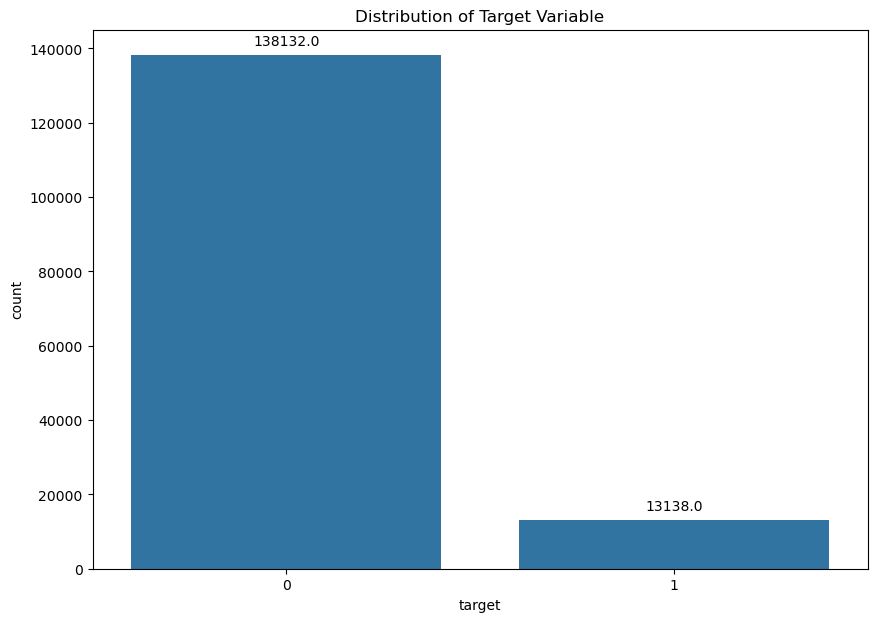

In [334]:
# Plot the count plot
plt.figure(figsize=(10, 7))
ax = sns.countplot(x='target', data=df_clean)

# Annotate the bars with their counts
for p in ax.patches:
    ax.annotate(p.get_height(), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Add title
plt.title('Distribution of Target Variable')

# Show plot
plt.show()

0 indicates people who repayed all the installments on time and 1 indicates people who repayed the installment late at least once

From the above graph, we can infer that a high percentage of people (91.93%) repayed the installments on time, so the target label is highly imbalanced.

Lets Plot Counts of all the odject type Columns below keeping Target Column as a dependant variable

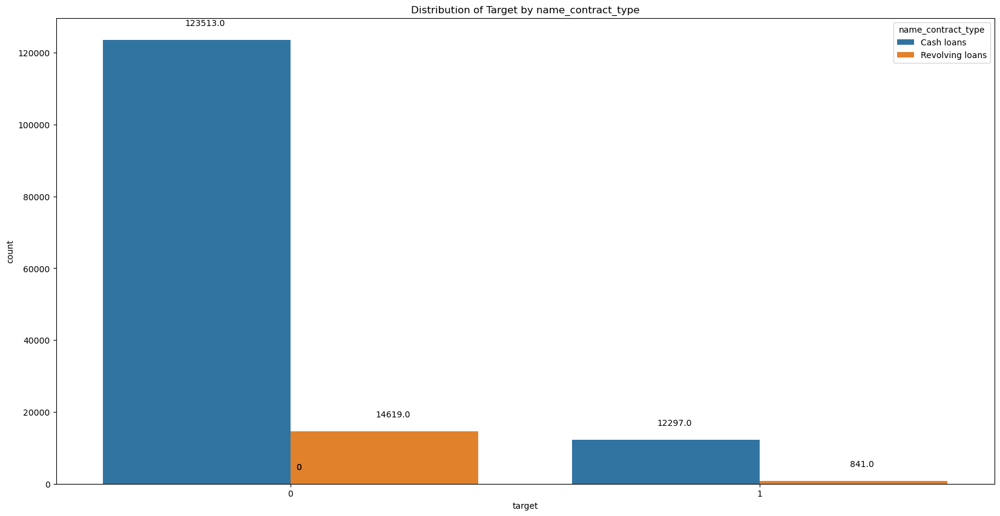

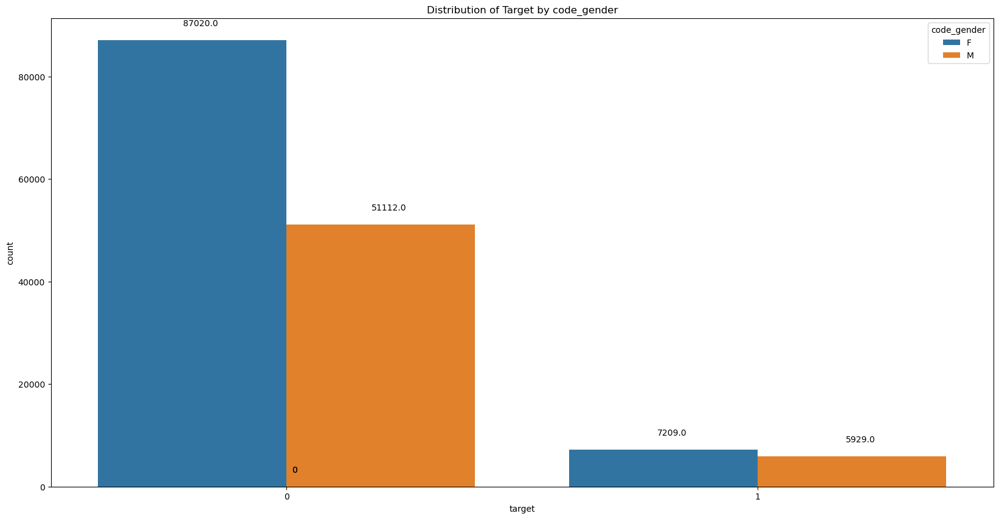

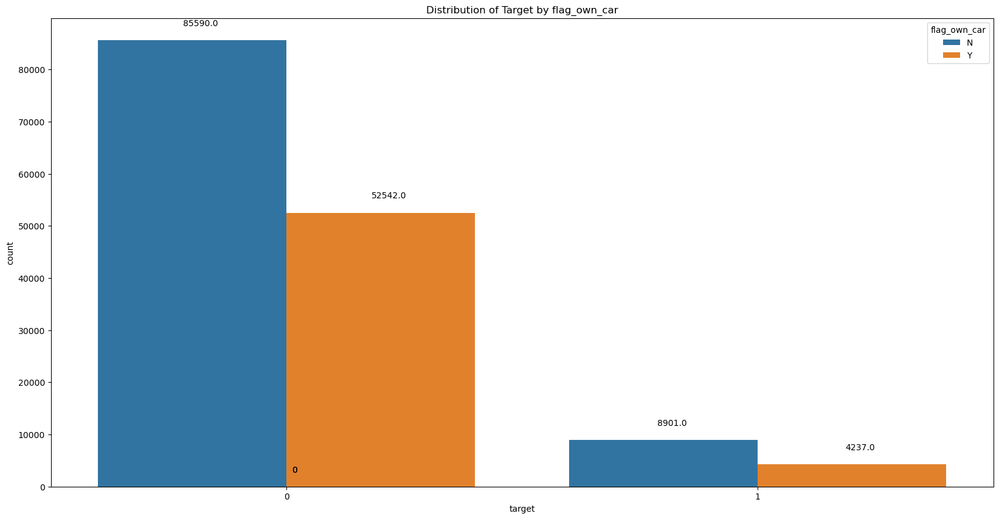

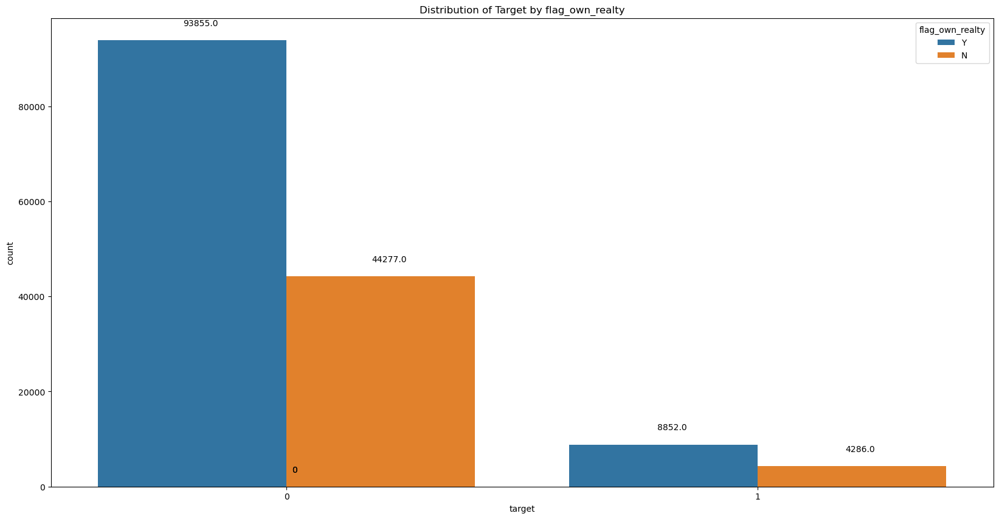

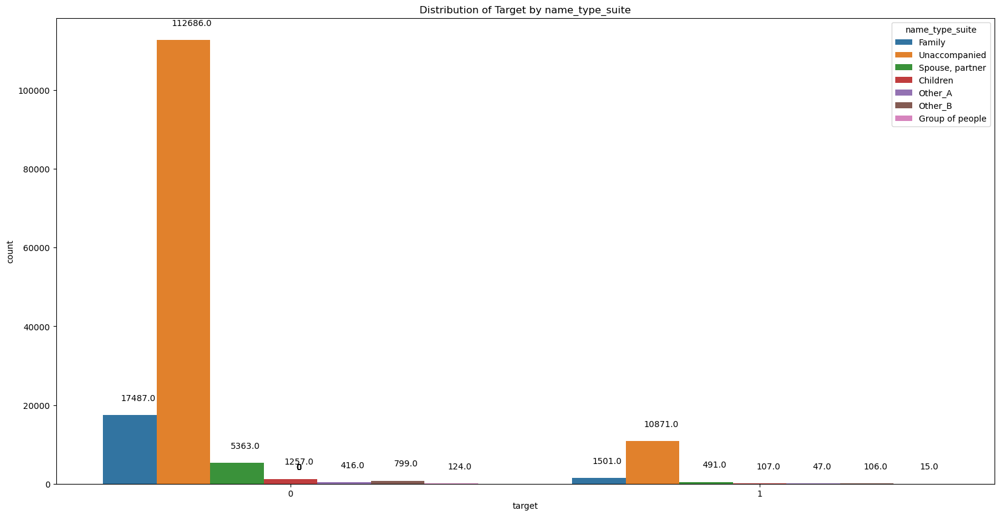

...

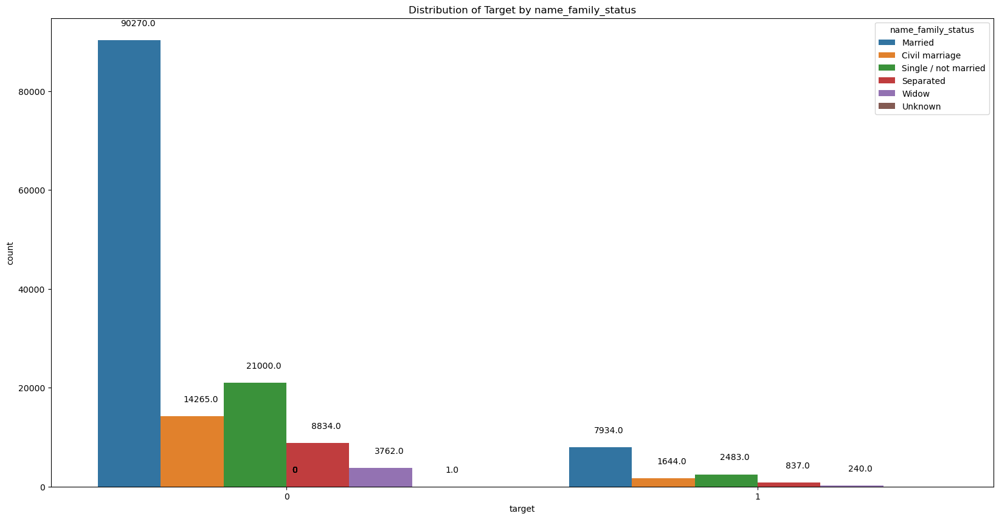

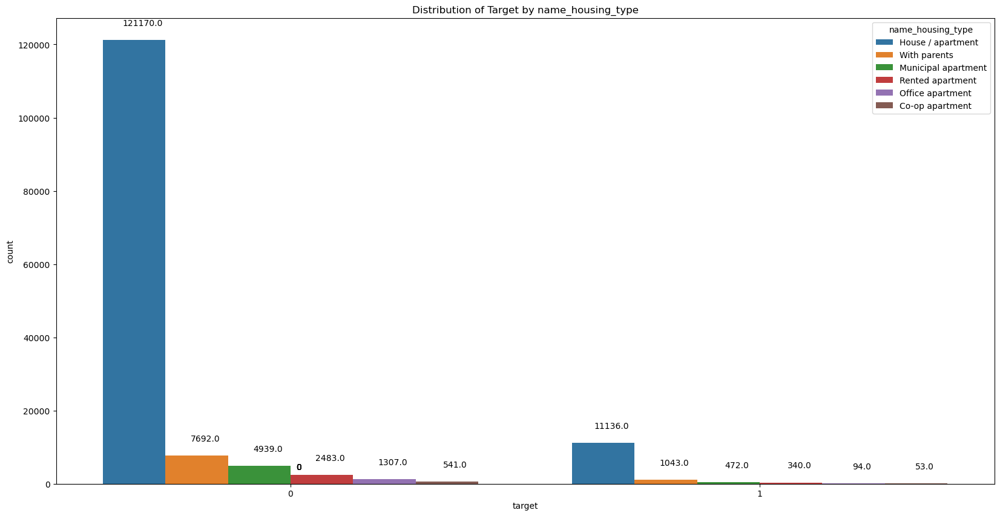

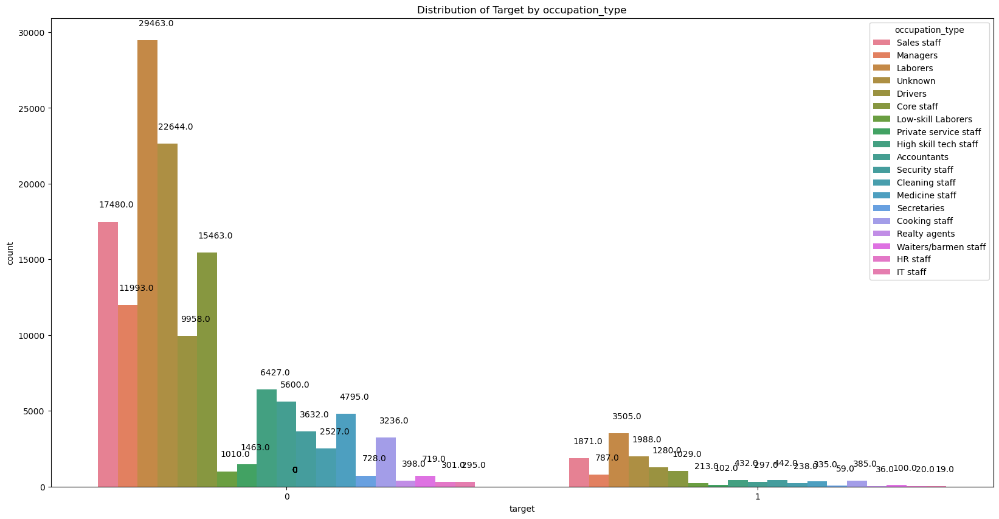

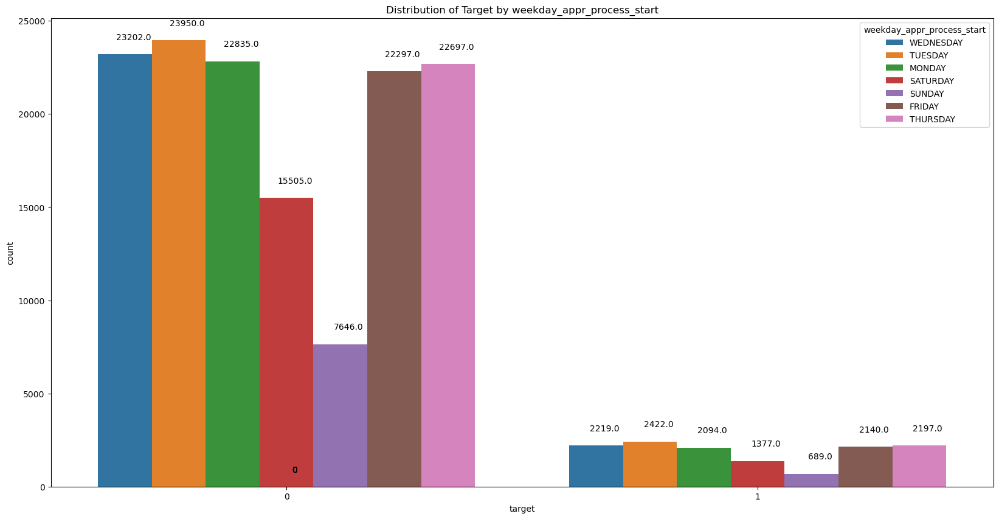

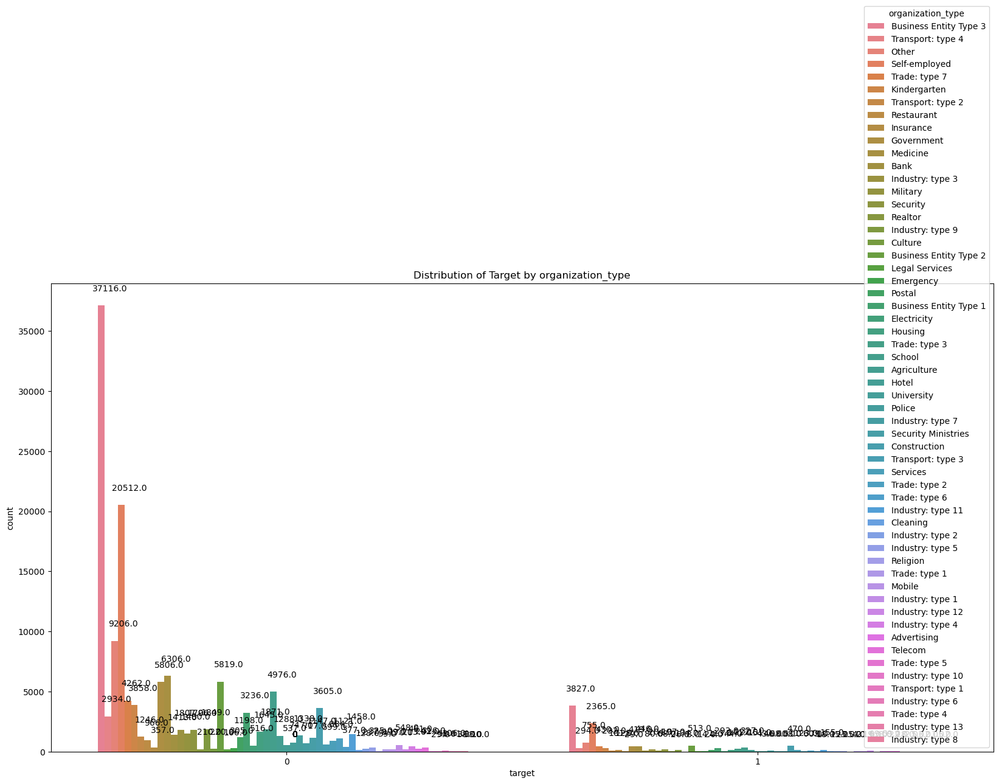

In [336]:
# Loop through columns in df_clean
for i in df_clean.columns:
    if df_clean[i].dtype == 'object':
        plt.figure(figsize=(20, 10))
        ax = sns.countplot(data=df_clean, x='target', hue=i)
        
        # Annotate the bars with their counts
        for p in ax.patches:
            ax.annotate(p.get_height(), 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', 
                        va='center', 
                        xytext=(10, 20), 
                        textcoords='offset points')
        
        # Add title
        plt.title(f'Distribution of Target by {i}')
        
        # Show plot
        plt.show()

Graphs Interpretions:

* Cash loan clients exhibit a higher tendency to default compared to revolving loan customers.<br>
* Female applicants have a higher default rate (7209) than male applicants (5929).<br>
* Non-car owners constitute a larger proportion of defaults.<br>
* Non-homeowners show a higher default rate.<br>
* Unaccompanied applicants demonstrate the highest default rate (10871), followed by applicants in family settings (1501).<br>
* Working applicants contribute the most to defaulted home loan payments (9172).<br>
* Those with a secondary/secondary special education level show the highest default rate.<br>
* Married applicants surpass single applicants in defaulting payments.<br>
* Residents of houses/apartments have the highest default rate, followed by those living with parents.<br>
* Laborers represent the largest group among defaulters.<br>
* Tuesday applicants exhibit a higher default rate, likely due to the higher volume of applications.<br>
* Applicants working in Business Entity type 3 display a higher default rate.<br>

After careful analysis of the above relationship plots, I am looking to drop weekday_appr_process_start and flag_own_realty since the existence of both these variables dont particularly make any sense.

In [338]:
# List of column names to drop
columns_to_drop1 = ['weekday_appr_process_start', 'flag_own_realty']

# Drop the specified columns from the DataFrame
df_clean1 = df_clean.drop(columns=columns_to_drop1)

Lets do a sanity check

In [340]:
#  Shape of the Dataset
df_clean1.shape

(151270, 49)

The total number rows are 151270 and columns are 49 

In [342]:
# info of the dataset
df_clean1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 49 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int64  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

My current shape of the Dataset has 151270 rows and 49 columns, and we currently have 4 Floats, 35 int and 10 object datatypes

Lets study the relationship between numerical variables amd Target Variables now and their graphs will follow after the analysis. 

#### Relationship between Target and cnt_children

In [346]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('cnt_children')['target'].unique().reset_index()
print(unique_values)

    cnt_children  target
0              0  [0, 1]
1              1  [0, 1]
2              2  [0, 1]
3              3  [0, 1]
4              4  [1, 0]
5              5  [0, 1]
6              6  [0, 1]
7              7     [0]
8              8     [0]
9              9     [1]
10            10     [0]
11            12     [0]
12            14     [0]
13            19     [0]


In [347]:
# Group by cnt_children and count occurrences of each unique value in the target column
child_target_counts = df_clean1.groupby('cnt_children')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
child_target_counts.columns = ['target_0_count', 'target_1_count']

print("Unique values of cnt_children and total number of target occurrences per unique value of cnt_children:")
print(child_target_counts)

Unique values of cnt_children and total number of target occurrences per unique value of cnt_children:
              target_0_count  target_1_count
cnt_children                                
0                      88714            8295
1                      32916            3205
2                      14316            1380
3                       1926             215
4                        198              33
5                         43               4
6                          7               4
7                          5               0
8                          2               0
9                          0               2
10                         1               0
12                         2               0
14                         1               0
19                         1               0


From the provided data, it appears that there are relatively fewer observations with higher values of cnt_children. For example, there are very few observations with cnt_children values of 5, 6, 7, 8, 9, 10, 12, 14, and 19. This could be indicative of potential outliers or simply reflect the natural distribution of the data, where fewer individuals have a higher number of children.

Regarding the relationship with the target variable (target), we can observe that as the number of children increases, the number of observations tends to decrease. However, it's important to note that the proportion of observations where the target is 1 (indicating default) also tends to decrease as the number of children increases.

For instance, while the number of observations with 0 children is the highest, the proportion of defaulters (target=1) among them is relatively higher compared to those with higher counts of children. This trend continues as the number of children increases, where despite fewer observations, the proportion of defaulters tends to reduce.

#### Relationship between Target and amt_income_total column

In [350]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_income_total')['target'].unique().reset_index()
print(unique_values)

      amt_income_total  target
0                26550     [0]
1                27000  [0, 1]
2                28800     [0]
3                29250     [0]
4                30600     [0]
...                ...     ...
1550           4500000     [0]
1551           9000000     [0]
1552          13500000     [0]
1553          18000090     [0]
1554         117000000     [1]

[1555 rows x 2 columns]


In [351]:
# Group by amt_income_total and count occurrences of each unique value in the target column
income_target_counts = df_clean1.groupby('amt_income_total')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
income_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
income_target_counts_sorted = income_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_income_total and total number of target occurrences per unique value of amt_income_total (sorted by target_1_count):")
print(income_target_counts_sorted)

Unique values of amt_income_total and total number of target occurrences per unique value of amt_income_total (sorted by target_1_count):
                  target_0_count  target_1_count
amt_income_total                                
135000                     16508            1613
112500                     13517            1437
157500                     12467            1255
180000                     11918            1201
90000                       9381             938
...                          ...             ...
123786                         1               0
123646                         2               0
123525                         1               0
123480                         1               0
152550                         1               0

[1555 rows x 2 columns]


Each row corresponds to a unique income level, and the columns show the count of loan defaults and non-defaults for each income level.

For example:

For applicants with an income of 135,000, there were 16,108 non-defaults and 1,613 defaults. <br>
For applicants with an income of 112,500, there were 13,517 non-defaults and 1,437 defaults. <br>
And so on for other income levels. <br>
This information could be useful for assessing the relationship between income levels and loan defaults. It might indicate whether there's a correlation between income and the likelihood of defaulting on a loan.

The "target_1_count" column likely represents the count of loan defaults, while the "target_0_count" column represents the count of non-defaults.

However, there seems to be an inconsistency in the formatting of the income levels. Some are integers (e.g., 135,000), while others are floating-point numbers (e.g., 57,375.0). This inconsistency could be due to how the data was collected or processed.

#### Relationship between Target and amt_credit column

In [354]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_credit')['target'].unique().reset_index()
print(unique_values)

      amt_credit  target
0          45000  [0, 1]
1          47970  [0, 1]
2          48519     [0]
3          49455  [0, 1]
4          49500     [0]
...          ...     ...
4624     3600000     [0]
4625     3860019     [0]
4626     4027680     [1]
4627     4031032     [0]
4628     4050000     [0]

[4629 rows x 2 columns]


In [355]:
# Group by amt_credit and count occurrences of each unique value in the target column
credit_target_counts = df_clean1.groupby('amt_credit')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
credit_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
credit_target_counts_sorted = credit_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_credit and total number of target occurrences per unique value of amt_credit (sorted by target_1_count):")
print(credit_target_counts_sorted)

Unique values of amt_credit and total number of target occurrences per unique value of amt_credit (sorted by target_1_count):
            target_0_count  target_1_count
amt_credit                                
450000                4717             601
545040                1958             413
675000                3864             350
180000                3705             330
225000                3502             328
...                    ...             ...
930321                   3               0
930766                   3               0
336150                   2               0
931500                  10               0
4050000                  3               0

[4629 rows x 2 columns]


Each row represents a unique loan amount, and the columns show the count of loan defaults and non-defaults for each loan amount.

For example:

For loans with an amount of 450,000, there were 4,717 non-defaults and 601 defaults.
For loans with an amount of 545,040, there were 1,958 non-defaults and 413 defaults.

Since there is no particular pattern of credit thats affecting the target occurances, we could just keep this column for now and later when we study the correlation of variables we can decide if this column is needed or to be dropped.

#### Relationship between Target and amt_annuity

In [358]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_annuity')['target'].unique().reset_index()
print(unique_values)

       amt_annuity target
0             1980    [0]
1             2187    [0]
2             2205    [0]
3             2295    [0]
4             2317    [0]
...            ...    ...
11880       213160    [0]
11881       213291    [0]
11882       220297    [0]
11883       225000    [0]
11884       258025    [0]

[11885 rows x 2 columns]


In [359]:
# Group by amt_annuity and count occurrences of each unique value in the target column
annuity_target_counts = df_clean1.groupby('amt_annuity')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
annuity_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
annuity_target_counts_sorted = annuity_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_annuity and total number of target occurrences per unique value of amt_annuity (sorted by target_1_count):")
print(annuity_target_counts_sorted)

Unique values of amt_annuity and total number of target occurrences per unique value of amt_annuity (sorted by target_1_count):
             target_0_count  target_1_count
amt_annuity                                
9000                   3287             288
13500                  2870             163
26640                   562             132
31261                   363             108
29970                   295              95
...                     ...             ...
30429                     3               0
30402                     5               0
30388                     8               0
30375                     3               0
258025                    1               0

[11885 rows x 2 columns]


Each row represents a unique annuity amount, and the columns show the count of loan defaults and non-defaults for each annuity amount.

For example:

For annuity amounts of 9,000, there were 3,287 non-defaults and 288 defaults. <br>
For annuity amounts of 13,500, there were 2,870 non-defaults and 163 defaults. <br>
For annuity amounts of 26,640, there were 562 non-defaults and 132 defaults. <br>
And so on for other annuity amounts. <br>

Again, we cant find a particular relationship betweeen Amt_annuity and Target occurances, as defaults occur at random annuity ranges. So therefore, further correlation analysis is required to understand if this column is required or not

#### Relationship between Target and amt_goods_price

In [362]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_goods_price')['target'].unique().reset_index()
print(unique_values)

     amt_goods_price  target
0              40500     [0]
1              45000  [0, 1]
2              49500  [0, 1]
3              54000  [0, 1]
4              58500  [0, 1]
..               ...     ...
716          3375000     [0]
717          3555000     [0]
718          3600000  [0, 1]
719          3712500     [0]
720          4050000     [0]

[721 rows x 2 columns]


In [363]:
# Group by amt_goods_price and count occurrences of each unique value in the target column
goods_target_counts = df_clean1.groupby('amt_goods_price')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
goods_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
goods_target_counts_sorted = goods_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_goods_price and total number of target occurrences per unique value of amt_goods_price (sorted by target_1_count):")
print(goods_target_counts_sorted)

Unique values of amt_goods_price and total number of target occurrences per unique value of amt_goods_price (sorted by target_1_count):
                 target_0_count  target_1_count
amt_goods_price                                
450000                    12249            2020
225000                     9978            1183
675000                    10619            1134
900000                     7788             585
180000                     4849             475
...                         ...             ...
655704                        1               0
645799                        1               0
642915                        1               0
638302                        1               0
4050000                       3               0

[721 rows x 2 columns]


Once again a random occurance of defaults. No such pattern can we see in the above results. Lets continue with our analysis further.

#### Relationship between Target and region_population_relative

In [366]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('region_population_relative')['target'].unique().reset_index()
print(unique_values)

    region_population_relative  target
0                     0.000533  [1, 0]
1                     0.000938  [0, 1]
2                     0.001276  [0, 1]
3                     0.001333  [0, 1]
4                     0.001417  [0, 1]
..                         ...     ...
75                    0.031329  [0, 1]
76                    0.032561  [0, 1]
77                    0.035792  [0, 1]
78                    0.046220  [0, 1]
79                    0.072508  [0, 1]

[80 rows x 2 columns]


In [367]:
# Group by region_population_relative and count occurrences of each unique value in the target column
relative_population_target_counts = df_clean1.groupby('region_population_relative')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
relative_population_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
relative_population_target_counts_sorted = relative_population_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of region_population_relative and total number of target occurrences per unique value of region_population_relative (sorted by target_1_count):")
print(relative_population_target_counts_sorted)

Unique values of region_population_relative and total number of target occurrences per unique value of region_population_relative (sorted by target_1_count):
                            target_0_count  target_1_count
region_population_relative                                
0.035792                              7692             598
0.025164                              5161             569
0.030755                              5197             496
0.031329                              5055             493
0.020246                              2925             456
...                                    ...             ...
0.001276                               290              19
0.001333                               114              18
0.003541                               302              16
0.000533                                11               3
0.000938                                 8               2

[80 rows x 2 columns]


This result suggests that the majority of defaulted applicants come from a lesser to moderately populated region in comparison to those who come from highly population areas. Around 598 defaults occurs from applicants who live in a region thats population score is 0.035792 and the highest populated region being 0.072508. 

#### Relationship between Target and days_birth

In [370]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('days_birth')['target'].unique().reset_index()
print(unique_values)

       days_birth  target
0          -25180     [0]
1          -25175     [0]
2          -25170     [0]
3          -25165     [0]
4          -25155     [0]
...           ...     ...
16007       -7680  [0, 1]
16008       -7678  [0, 1]
16009       -7676     [0]
16010       -7673     [0]
16011       -7489     [0]

[16012 rows x 2 columns]


In [371]:
# Convert days_birth to years
df_clean1['age'] = df_clean1['days_birth'] / -365.25

# Group by age_years and count occurrences of each unique value in the target column
age_target_counts = df_clean1.groupby('age')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
age_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
age_target_counts_sorted = age_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of age and total number of target occurrences per unique value of age (sorted by target_1_count):")
print(age_target_counts_sorted)

Unique values of age and total number of target occurrences per unique value of age (sorted by target_1_count):
           target_0_count  target_1_count
age                                      
31.665982              12               9
28.164271              16               7
28.158795              10               7
34.485969              13               6
36.687201              15               6
...                   ...             ...
44.271047              10               0
44.268309              14               0
44.265572              14               0
44.249144              13               0
68.939083               1               0

[16012 rows x 2 columns]



The data provided is a tabular representation showing the unique values of age (converted from days_birth to years) and the total number of occurrences of each unique age value, sorted by the count of the target variable 
(either 0 or 1).<br> Here's an explanation:

age: This column represents the age of individuals. It seems to have been converted from days_birth to years for better interpretability. Each unique value in this column represents a specific age.

target_0_count: This column shows the total number of occurrences of the target variable with the value 0 for each unique age value. In other words, it represents the count of individuals who do not meet a certain condition or event (target = 0) at each age.

target_1_count: This column shows the total number of occurrences of the target variable with the value 1 for each unique age value. It represents the count of individuals who meet a certain condition or event (target = 1) at each age.

As the result denotes above, the highest number of default occurances are at the age of 31 to 32 years of age. And as we scroll down the age group in which the majority of defaults are prevelant are between 25 to 50 years of age. That explains the prime <br> age of an applicant during their working and responsibilities stage of life. This insights are very important as this will help us create a better model to better understand the trends. We may have to convert the column <br> days_birth to age in years as it will be much easier to interpret our results.

#### Relationship between Target and days_employed

In [374]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('days_employed')['target'].unique().reset_index()
print(unique_values)

       days_employed  target
0           -17912.0     [0]
1           -17583.0     [0]
2           -17531.0     [0]
3           -17522.0     [0]
4           -17170.0     [0]
...              ...     ...
11398           -4.0  [1, 0]
11399           -3.0     [0]
11400           -2.0  [0, 1]
11401           -1.0     [0]
11402            0.0  [1, 0]

[11403 rows x 2 columns]


In [375]:
# Convert days_birth to years
df_clean1['years_employed'] = df_clean1['days_employed'] / -365.25

# Group by age_years and count occurrences of each unique value in the target column
years_employed_target_counts = df_clean1.groupby('years_employed')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
years_employed_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
years_employed_target_counts_sorted = years_employed_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of years of employment and total number of target occurrences per unique value of years of employment (sorted by target_1_count):")
print(years_employed_target_counts_sorted)

Unique values of years of employment and total number of target occurrences per unique value of years of employment (sorted by target_1_count):
                target_0_count  target_1_count
years_employed                                
0.585900                    73              15
1.089665                    49              15
1.973990                    48              14
0.640657                    53              14
0.602327                    56              14
...                        ...             ...
6.524298                    28               0
18.053388                    5               0
18.050650                    7               0
6.554415                    26               0
49.040383                    1               0

[11403 rows x 2 columns]



The above results represents the relationship between years of employment (calculated from days_employed) and the occurrence of loan defaults (target variable). The data has been grouped by years_employed, and the number of defaults (target_1_count) and non-defaults (target_0_count) have been counted for each unique value of employment years. The results are then sorted by target_1_count in descending order.

High Default Rates:

Certain specific years of employment show relatively high default counts (target_1_count). For example, employment durations of approximately 0.59, 1.09, 1.97, 0.64, and 0.60 years have 14-15 default occurrences.

Employment Stability and Default Risk:

The trend suggests that individuals with very short employment durations (less than 2 years) might be at a higher risk of defaulting on their loans. This could be due to job instability or insufficient time to build a stable financial base.

Long-term Employment:

There are also entries with significant employment durations, such as 6.52, 18.05, and even up to 49 years, which show no defaults. This might indicate that long-term employment is associated with a lower risk of loan default, potentially due to greater financial stability and experience.

Detailed Interpretation:

Years of Employment with Higher Default Rates:

0.5859 years: 73 non-defaults, 15 defaults
1.0897 years: 49 non-defaults, 15 defaults
1.9740 years: 48 non-defaults, 14 defaults
0.6407 years: 53 non-defaults, 14 defaults
0.6023 years: 56 non-defaults, 14 defaults
These values suggest a higher number of defaults occurring around the 1-year mark of employment.

Years of Employment with No Defaults:

6.5243 years: 28 non-defaults, 0 defaults
18.0534 years: 5 non-defaults, 0 defaults
49.0404 years: 1 non-default, 0 defaults

Employment duration is an important feature in predicting loan defaults. Those with shorter employment durations (especially around 1 year) may need closer scrutiny when evaluating their loan applications.
Risk Management:

Analyzing the correlation between employment duration and loan default rates provides valuable insights into the risk profiles of loan applicants. By understanding these trends, financial institutions can enhance their risk assessment models, leading to more informed lending decisions and potentially reducing default rates.

#### Relationship between Target and days_id_publish

In [378]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('days_id_publish')['target'].unique().reset_index()
print(unique_values)

      days_id_publish  target
0               -6383     [0]
1               -6274     [0]
2               -6265     [0]
3               -6263     [0]
4               -6259     [0]
...               ...     ...
6039               -4  [1, 0]
6040               -3  [0, 1]
6041               -2  [0, 1]
6042               -1  [0, 1]
6043                0  [0, 1]

[6044 rows x 2 columns]


In [379]:
# Convert days_birth to years
df_clean1['id_change_years'] = df_clean1['days_id_publish'] / -365.25

# Group by age_years and count occurrences of each unique value in the target column
id_target_counts = df_clean1.groupby('id_change_years')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
id_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
id_target_counts_sorted = id_target_counts.sort_values(by='id_change_years', ascending=True)

print("Unique values of id_change_years and total number of target occurrences per unique value of id_change_years (sorted by target_1_count):")
print(id_target_counts_sorted)

Unique values of id_change_years and total number of target occurrences per unique value of id_change_years (sorted by target_1_count):
                 target_0_count  target_1_count
id_change_years                                
-0.000000                     8               1
 0.002738                    28               4
 0.005476                    24               3
 0.008214                    26               3
 0.010951                    28               6
...                         ...             ...
 17.136208                    1               0
 17.147159                    1               0
 17.152635                    1               0
 17.177276                    1               0
 17.475702                    1               0

[6044 rows x 2 columns]


#### Relationship between Target and cnt_fam_members

In [381]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('cnt_fam_members')['target'].unique().reset_index()
print(unique_values)

    cnt_fam_members  target
0                 1  [0, 1]
1                 2  [0, 1]
2                 3  [0, 1]
3                 4  [0, 1]
4                 5  [0, 1]
5                 6  [1, 0]
6                 7  [0, 1]
7                 8  [0, 1]
8                 9     [0]
9                10  [0, 1]
10               11     [1]
11               12     [0]
12               14     [0]
13               16     [0]
14               20     [0]


In [382]:
# Group by cnt_fam_members and count occurrences of each unique value in the target column
fam_target_counts = df_clean1.groupby('cnt_fam_members')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
fam_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
fam_target_counts_sorted = fam_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of cnt_fam_members and total number of target occurrences per unique value of cnt_fam_members (sorted by target_1_count):")
print(fam_target_counts_sorted)

Unique values of cnt_fam_members and total number of target occurrences per unique value of cnt_fam_members (sorted by target_1_count):
                 target_0_count  target_1_count
cnt_fam_members                                
2                         67917            6147
1                         26520            2772
3                         28415            2728
4                         13205            1248
5                          1831             201
6                           185              32
7                            40               4
8                             7               4
10                            2               1
11                            0               1
9                             5               0
12                            1               0
14                            2               0
16                            1               0
20                            1               0


Family members with as low as 2 has the highest number of default occurances. This ranges from 2 to 11 members where the defaults are still prevelant. But the highest remain somehwere between 1 to 5 members family is generally high risk <br> to default their payments. This could mean a lot of things, with more expenses in the family due to increase in number of heads in a households, difficulty to keep with monthly payments are also in the rise. This is a good insight <br> for our modeling and statistical testing purposes.

#### Relationship between Target and hour_appr_process_start

In [385]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('hour_appr_process_start')['target'].unique().reset_index()
print(unique_values)

    hour_appr_process_start  target
0                         0  [0, 1]
1                         1  [0, 1]
2                         2  [0, 1]
3                         3  [0, 1]
4                         4  [0, 1]
5                         5  [0, 1]
6                         6  [0, 1]
7                         7  [0, 1]
8                         8  [0, 1]
9                         9  [0, 1]
10                       10  [0, 1]
11                       11  [0, 1]
12                       12  [0, 1]
13                       13  [0, 1]
14                       14  [0, 1]
15                       15  [0, 1]
16                       16  [0, 1]
17                       17  [0, 1]
18                       18  [0, 1]
19                       19  [0, 1]
20                       20  [0, 1]
21                       21  [0, 1]
22                       22  [0, 1]
23                       23  [0, 1]


In [386]:
# Group by hour_appr_process_start and count occurrences of each unique value in the target column
hour_target_counts = df_clean1.groupby('hour_appr_process_start')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
hour_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
hour_target_counts_sorted = hour_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of hour_appr_process_start and total number of target occurrences per unique value of hour_appr_process_start (sorted by target_1_count):")
print(hour_target_counts_sorted)

Unique values of hour_appr_process_start and total number of target occurrences per unique value of hour_appr_process_start (sorted by target_1_count):
                         target_0_count  target_1_count
hour_appr_process_start                                
11                                16474            1586
10                                16280            1555
12                                15198            1488
13                                13967            1323
14                                12705            1176
9                                 11492            1168
15                                11752            1038
16                                 9807             848
8                                  6181             692
17                                 7430             526
7                                  3760             448
6                                  2377             340
18                                 4541             338
5       

Well, this this is an equal kind of distribution where defaults to occur at all the hours that the application was processed. Its not yet sure as to how important this column is required, as we cant come to a concrete conclusion <br> based on this information to decide upon whether an applicant can default with their payments or not. This is just a random piece of information which is of no particular help with regards to our analysis. I may decide to drop this column later.

#### Relationship between Target and obs_30_cnt_social_circle

In [389]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('obs_30_cnt_social_circle')['target'].unique().reset_index()
print(unique_values)

    obs_30_cnt_social_circle  target
0                          0  [0, 1]
1                          1  [0, 1]
2                          2  [0, 1]
3                          3  [0, 1]
4                          4  [0, 1]
5                          5  [0, 1]
6                          6  [0, 1]
7                          7  [0, 1]
8                          8  [0, 1]
9                          9  [0, 1]
10                        10  [0, 1]
11                        11  [0, 1]
12                        12  [0, 1]
13                        13  [0, 1]
14                        14  [0, 1]
15                        15  [0, 1]
16                        16  [1, 0]
17                        17  [0, 1]
18                        18     [0]
19                        19  [0, 1]
20                        20  [0, 1]
21                        21     [0]
22                        22  [0, 1]
23                        23  [0, 1]
24                        24     [0]
25                        25  [1, 0]
2

In [390]:
# Group by obs_30_cnt_social_circle and count occurrences of each unique value in the target column
obs30_target_counts = df_clean1.groupby('obs_30_cnt_social_circle')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
obs30_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
obs30_target_counts_sorted = obs30_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of obs_30_cnt_social_circle and total number of target occurrences per unique value of obs_30_cnt_social_circle (sorted by target_1_count):")
print(obs30_target_counts_sorted)

Unique values of obs_30_cnt_social_circle and total number of target occurrences per unique value of obs_30_cnt_social_circle (sorted by target_1_count):
                          target_0_count  target_1_count
obs_30_cnt_social_circle                                
0                                  73713            6831
1                                  22221            2100
2                                  13597            1314
3                                   9128             880
4                                   6382             672
5                                   4208             418
6                                   2883             292
7                                   1995             199
8                                   1356             127
9                                    892              94
10                                   579              61
12                                   298              41
11                                   363        

Again, I am quite confused as to why we need this piece of information. The least number of observations has the highest default occurances. So as the number of observation increases the default occurance decreases. We need further evidence to help <br> me understand the importance of this column in this data.

Possible Interpretations: This is the least I could interpret with the data that we have.

* Individuals with fewer observations of social circles may have more stable or predictable social environments, leading to higher counts in both target categories.<br>
* Conversely, individuals with a higher count of observations might have more dynamic social interactions, making it harder to predict their likelihood of meeting the condition represented by the target variable.

#### Relationship between Target and def_30_cnt_social_circle

In [393]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('def_30_cnt_social_circle')['target'].unique().reset_index()
print(unique_values)

   def_30_cnt_social_circle  target
0                         0  [0, 1]
1                         1  [0, 1]
2                         2  [0, 1]
3                         3  [0, 1]
4                         4  [0, 1]
5                         5  [0, 1]
6                         6  [0, 1]
7                         8     [0]
8                        34     [0]


In [394]:
# Group by def_30_cnt_social_circle and count occurrences of each unique value in the target column
def30_target_counts = df_clean1.groupby('def_30_cnt_social_circle')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
def30_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
def30_target_counts_sorted = def30_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of def_30_cnt_social_circle and total number of target occurrences per unique value of def_30_cnt_social_circle (sorted by target_1_count):")
print(def30_target_counts_sorted)

Unique values of def_30_cnt_social_circle and total number of target occurrences per unique value of def_30_cnt_social_circle (sorted by target_1_count):
                          target_0_count  target_1_count
def_30_cnt_social_circle                                
0                                 123003           11198
1                                  12225            1528
2                                   2258             305
3                                    509              81
4                                     98              22
5                                     30               3
6                                      7               1
8                                      1               0
34                                     1               0


The lower the number results in higher defaults. The range is between 0 and 34. Does this denote some kind score which was derived. This possibly denotes the count of defaulted loans or similar events in the last 30 days for each individual. The number of defaults increases with <br> lesser counts of defaulted loans? I am confused. 

#### Relationship between Target and obs_60_cnt_social_circle

In [397]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('obs_60_cnt_social_circle')['target'].unique().reset_index()
print(unique_values)

    obs_60_cnt_social_circle  target
0                          0  [0, 1]
1                          1  [0, 1]
2                          2  [0, 1]
3                          3  [0, 1]
4                          4  [0, 1]
5                          5  [0, 1]
6                          6  [0, 1]
7                          7  [0, 1]
8                          8  [0, 1]
9                          9  [0, 1]
10                        10  [0, 1]
11                        11  [0, 1]
12                        12  [0, 1]
13                        13  [0, 1]
14                        14  [0, 1]
15                        15  [0, 1]
16                        16  [1, 0]
17                        17  [0, 1]
18                        18  [0, 1]
19                        19  [0, 1]
20                        20     [0]
21                        21     [0]
22                        22  [0, 1]
23                        23  [0, 1]
24                        24     [0]
25                        25  [1, 0]
2

In [398]:
# Group by obs_60_cnt_social_circle and count occurrences of each unique value in the target column
obs60_target_counts = df_clean1.groupby('obs_60_cnt_social_circle')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
obs60_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
obs60_target_counts_sorted = obs60_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of obs_60_cnt_social_circle and total number of target occurrences per unique value of obs_60_cnt_social_circle (sorted by target_1_count):")
print(obs60_target_counts_sorted)

Unique values of obs_60_cnt_social_circle and total number of target occurrences per unique value of obs_60_cnt_social_circle (sorted by target_1_count):
                          target_0_count  target_1_count
obs_60_cnt_social_circle                                
0                                  74053            6866
1                                  22264            2104
2                                  13595            1302
3                                   9075             879
4                                   6278             669
5                                   4148             418
6                                   2844             285
7                                   1994             195
8                                   1303             123
9                                    877              95
10                                   563              58
11                                   354              41
12                                   285        

Very similar to the obs30 column, as the number of observations increases the defaults reduces and vice versa. Again is this an important piece of information that is required for our modeling purposes is something which I am unable to understand. I understand this is something <br> to do with the number of days the payments passed their due date and if it went or stayed on beyond 30 days or 60 days. But the Obeservations of social circle and their relationship with defaults I am yet to come to a concrete conclusion. Until then <br> I will comtinue to keep these columns

#### Relationship between Target and obs_60_cnt_social_circle

In [401]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('def_60_cnt_social_circle')['target'].unique().reset_index()
print(unique_values)

   def_60_cnt_social_circle  target
0                         0  [0, 1]
1                         1  [0, 1]
2                         2  [0, 1]
3                         3  [0, 1]
4                         4  [0, 1]
5                         5  [0, 1]
6                         6     [0]
7                        24     [0]


In [402]:
# Group by def_60_cnt_social_circle and count occurrences of each unique value in the target column
def60_target_counts = df_clean1.groupby('def_60_cnt_social_circle')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
def60_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
def60_target_counts_sorted = def60_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of def_60_cnt_social_circle and total number of target occurrences per unique value of def_60_cnt_social_circle (sorted by target_1_count):")
print(def60_target_counts_sorted)

Unique values of def_60_cnt_social_circle and total number of target occurrences per unique value of def_60_cnt_social_circle (sorted by target_1_count):
                          target_0_count  target_1_count
def_60_cnt_social_circle                                
0                                 127083           11648
1                                   9398            1245
2                                   1328             180
3                                    251              52
4                                     58              10
5                                     11               3
6                                      2               0
24                                     1               0


I have noticed some kind of trend between Obs and Def (both 30 and 60) conlumns that the number of observations are between 0 and 350 (aprox) on Obs columns whereas the number of observations range between 0 to 35(approx) in def columns. Does this denote year and Month observations? <br> As always the lower the number of observations the defaults number increases. More research is required as I am quite reluctant to delete these columns as of now since this relates to the loan default situation which is crucial for our analysis.

#### Relationship between Target and days_last_phone_change

In [405]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('days_last_phone_change')['target'].unique().reset_index()
print(unique_values)

      days_last_phone_change  target
0                      -4185     [0]
1                      -4173     [0]
2                      -4153     [0]
3                      -4131     [0]
4                      -4128     [0]
...                      ...     ...
3653                      -4  [0, 1]
3654                      -3  [0, 1]
3655                      -2  [0, 1]
3656                      -1  [0, 1]
3657                       0  [0, 1]

[3658 rows x 2 columns]


In [406]:
# Convert days_last_phone_change to years
df_clean1['last_phone_change_years'] = df_clean1['days_last_phone_change'] / -365.25

# Group by age_years and count occurrences of each unique value in the target column
phone_change_counts = df_clean1.groupby('last_phone_change_years')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
phone_change_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
phone_change_counts_sorted = phone_change_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of phone_change_years and total number of target occurrences per unique value of phone_change_years (sorted by target_1_count):")
print(phone_change_counts_sorted)

Unique values of phone_change_years and total number of target occurrences per unique value of phone_change_years (sorted by target_1_count):
                         target_0_count  target_1_count
last_phone_change_years                                
-0.000000                         15557            1820
 0.002738                          1293             138
 0.005476                          1020              68
 0.010951                           680              49
 0.008214                           839              47
...                                 ...             ...
 8.021903                             3               0
 8.024641                            10               0
 8.027379                            11               0
 8.032854                            11               0
 11.457906                            1               0

[3658 rows x 2 columns]


I have converted the days to years for easy interpretation of the results. The range is somewhere between 0 to 17 years of phone change observatuons. The highest number of defaults occurs within one year i.e. 0. 

Possible Interpretations:
Behavioral Patterns: Individuals who recently changed their phone numbers may exhibit different behaviors or characteristics compared to those who have not changed their numbers for a longer time. This could include changes in contact information due to relocation, job changes, or other life events.

Risk Assessment: The duration since the last phone number change could be a proxy for stability or reliability. Individuals who frequently change their phone numbers may be perceived as less stable, potentially affecting their creditworthiness or risk profile.

Modeling Considerations: Understanding the relationship between the duration since the last phone number change and the target variable is essential for predictive modeling. This information can be used as a feature in predictive models to improve their accuracy in predicting the target variable.

#### Relationship between Target and amt_req_credit_bureau_hour

In [409]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_hour')['target'].unique().reset_index()
print(unique_values)

   amt_req_credit_bureau_hour  target
0                           0  [0, 1]
1                           1  [1, 0]
2                           2  [0, 1]
3                           3     [0]
4                           4     [0]


In [410]:
# Group by amt_req_credit_bureau_hour and count occurrences of each unique value in the target column
onehr_target_counts = df_clean1.groupby('amt_req_credit_bureau_hour')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
onehr_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
onehr_target_counts_sorted = onehr_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_hour and total number of target occurrences per unique value of amt_req_credit_bureau_hour (sorted by target_1_count):")
print(onehr_target_counts_sorted)

Unique values of amt_req_credit_bureau_hour and total number of target occurrences per unique value of amt_req_credit_bureau_hour (sorted by target_1_count):
                            target_0_count  target_1_count
amt_req_credit_bureau_hour                                
0                                   137268           13054
1                                      827              78
2                                       30               6
3                                        6               0
4                                        1               0


Here's an interpretation of the data:

Insights:
Effect of Credit Bureau Enquiries:
The majority of clients, represented by target_0_count, did not default on their loans regardless of the number of enquiries made to the Credit Bureau within one hour before the loan application.
There's a noticeable decrease in the number of clients who defaulted (target_1_count) as the number of enquiries increases. This suggests that clients with a higher number of Credit Bureau enquiries within one hour before the loan application are less likely to default.
Possible Interpretations:
Creditworthiness Assessment:

A higher number of enquiries to the Credit Bureau may indicate that the lender is conducting more thorough credit assessments on the applicants.
Clients with multiple enquiries within a short timeframe might be perceived as higher risk by lenders, leading to increased scrutiny during the loan approval process.
Fraud Detection:

Multiple enquiries within a short timeframe may also raise flags for potential fraud or misrepresentation. Lenders might be more cautious when dealing with such applications.

#### Relationship between Target and amt_req_credit_bureau_day

In [413]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_day')['target'].unique().reset_index()
print(unique_values)

   amt_req_credit_bureau_day  target
0                          0  [0, 1]
1                          1  [0, 1]
2                          2  [0, 1]
3                          3  [0, 1]
4                          4  [0, 1]
5                          5     [0]
6                          6     [0]
7                          9     [0]


In [414]:
# Group by amt_req_credit_bureau_day and count occurrences of each unique value in the target column
oneday_target_counts = df_clean1.groupby('amt_req_credit_bureau_day')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
oneday_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
oneday_target_counts_sorted = oneday_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_day and total number of target occurrences per unique value of amt_req_credit_bureau_day (sorted by target_1_count):")
print(oneday_target_counts_sorted)

Unique values of amt_req_credit_bureau_day and total number of target occurrences per unique value of amt_req_credit_bureau_day (sorted by target_1_count):
                           target_0_count  target_1_count
amt_req_credit_bureau_day                                
0                                  137346           13052
1                                     667              76
2                                      61               6
4                                      17               3
3                                      28               1
5                                       5               0
6                                       6               0
9                                       2               0


Again Majority of defaulted applicants had 0 inquiries to the credit Bureau 1 day before application. This denotes that strengent practices have to be undertaken for future to avoid huge number of defaults

Let's interpret the data:

amt_req_credit_bureau_day: This column indicates the number of enquiries made to the Credit Bureau about the client within one day before the loan application.

target_0_count (not defaulted payments): This column shows the total number of occurrences of the target variable with the value 0 (not defaulted) for each unique value of amt_req_credit_bureau_day. It represents the count of clients who did not default on their loans for each number of enquiries made to the Credit Bureau one day before the loan application.

target_1_count (defaulted payments): This column shows the total number of occurrences of the target variable with the value 1 (defaulted) for each unique value of amt_req_credit_bureau_day. It represents the count of clients who defaulted on their loans for each number of enquiries made to the Credit Bureau one day before the loan application.

Insights:
Credit Bureau Enquiries Impact:
Majority of clients, represented by target_0_count, did not default on their loans regardless of the number of enquiries made to the Credit Bureau one day before the loan application.
There is a decrease in the number of clients who defaulted (target_1_count) as the number of enquiries increases, although the numbers are relatively low.
Possible Interpretations:
Creditworthiness Assessment:

Lenders may have stricter criteria or be more cautious with applicants who have a higher number of enquiries to the Credit Bureau one day before the loan application.
Conversely, applicants with fewer enquiries may be perceived as lower risk.
Data Quality:

The low number of defaulted payments across all levels of enquiries suggests that the number of enquiries made to the Credit Bureau one day before the loan application might not be a strong predictor of loan default on its own.

#### Relationship between Target and amt_req_credit_bureau_week

In [417]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_week')['target'].unique().reset_index()
print(unique_values)

   amt_req_credit_bureau_week  target
0                           0  [0, 1]
1                           1  [0, 1]
2                           2  [0, 1]
3                           3  [0, 1]
4                           4  [0, 1]
5                           5  [0, 1]
6                           6  [0, 1]
7                           7     [0]


In [418]:
# Group by amt_req_credit_bureau_week and count occurrences of each unique value in the target column
oneweek_target_counts = df_clean1.groupby('amt_req_credit_bureau_week')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
oneweek_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
oneweek_target_counts_sorted = oneweek_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_week and total number of target occurrences per unique value of amt_req_credit_bureau_week (sorted by target_1_count):")
print(oneweek_target_counts_sorted)

Unique values of amt_req_credit_bureau_week and total number of target occurrences per unique value of amt_req_credit_bureau_week (sorted by target_1_count):
                            target_0_count  target_1_count
amt_req_credit_bureau_week                                
0                                   133676           12740
1                                     4267             375
2                                      121              13
3                                       33               3
4                                       14               3
5                                        8               2
6                                       11               2
7                                        2               0


Insights:

Credit Bureau Inquiries Impact:

Majority of clients, represented by target_0_count, did not default on their loans regardless of the number of inquiries made to the Credit Bureau within one week before the loan application. <br>
There is a decrease in the number of clients who defaulted (target_1_count) as the number of inquiries increases, although the numbers are relatively low. <br>
Possible Interpretations:

Creditworthiness Assessment:

Lenders may consider applicants with a higher number of inquiries within one week before the loan application to be higher risk, leading to more cautious lending decisions.<br>
Conversely, applicants with fewer inquiries within one week may be perceived as lower risk. <br>

Data Quality:

The low number of defaulted payments across all levels of inquiries within one week suggests that this feature alone might not be a strong predictor of loan default.

#### Relationship between Target and amt_req_credit_bureau_mon

In [421]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_mon')['target'].unique().reset_index()
print(unique_values)

    amt_req_credit_bureau_mon  target
0                           0  [0, 1]
1                           1  [0, 1]
2                           2  [0, 1]
3                           3  [0, 1]
4                           4  [0, 1]
5                           5  [0, 1]
6                           6  [0, 1]
7                           7  [0, 1]
8                           8  [0, 1]
9                           9  [0, 1]
10                         10  [0, 1]
11                         11  [0, 1]
12                         12  [0, 1]
13                         13  [0, 1]
14                         14     [0]
15                         15  [0, 1]
16                         16     [0]
17                         17  [1, 0]
18                         18     [0]
19                         19     [0]
20                         24     [0]


In [422]:
# Group by amt_req_credit_bureau_mon and count occurrences of each unique value in the target column
onemonth_target_counts = df_clean1.groupby('amt_req_credit_bureau_mon')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
onemonth_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
onemonth_target_counts_sorted = onemonth_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_mon and total number of target occurrences per unique value of amt_req_credit_bureau_mon (sorted by target_1_count):")
print(onemonth_target_counts_sorted)

Unique values of amt_req_credit_bureau_mon and total number of target occurrences per unique value of amt_req_credit_bureau_mon (sorted by target_1_count):
                           target_0_count  target_1_count
amt_req_credit_bureau_mon                                
0                                  114767           10994
1                                   17340            1700
2                                    3012             249
3                                    1133              72
4                                     630              43
5                                     360              28
7                                     151              14
6                                     196              13
9                                     121               5
10                                     77               5
8                                     105               4
11                                     63               4
13                              

Again, the highest number defaulted applicants had 0 number of enquiries to the credit bureau atleast a month before their application. As the number of enquiries increases the defaults in payments decreases. 

#### Relationship between Target and amt_req_credit_bureau_qrt

In [425]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_qrt')['target'].unique().reset_index()
print(unique_values)

    amt_req_credit_bureau_qrt  target
0                           0  [0, 1]
1                           1  [0, 1]
2                           2  [0, 1]
3                           3  [0, 1]
4                           4  [0, 1]
5                           5  [0, 1]
6                           6  [0, 1]
7                           7     [0]
8                           8     [0]
9                          19     [1]
10                        261     [0]


In [426]:
# Group by amt_req_credit_bureau_qrt and count occurrences of each unique value in the target column
qrt_target_counts = df_clean1.groupby('amt_req_credit_bureau_qrt')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
qrt_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
qrt_target_counts_sorted = qrt_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_qrt and total number of target occurrences per unique value of amt_req_credit_bureau_qrt (sorted by target_1_count):")
print(qrt_target_counts_sorted)

Unique values of amt_req_credit_bureau_qrt and total number of target occurrences per unique value of amt_req_credit_bureau_qrt (sorted by target_1_count):
                           target_0_count  target_1_count
amt_req_credit_bureau_qrt                                
0                                  111937           10817
1                                   17843            1458
2                                    7222             752
3                                     867              68
4                                     214              35
6                                      13               4
5                                      29               3
19                                      0               1
7                                       1               0
8                                       4               0
261                                     2               0


All of these follow the same trend, the highest number defaulted applicants are caused due to lower number of Credit Bureau enquiries. This is a very alarming practice, and as the number of enquiries increases the defaults are drastically reduced to 0

#### Relationship between Target and amt_req_credit_bureau_year

In [429]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('amt_req_credit_bureau_year')['target'].unique().reset_index()
print(unique_values)

    amt_req_credit_bureau_year  target
0                            0  [0, 1]
1                            1  [0, 1]
2                            2  [0, 1]
3                            3  [0, 1]
4                            4  [0, 1]
5                            5  [0, 1]
6                            6  [0, 1]
7                            7  [0, 1]
8                            8  [0, 1]
9                            9  [0, 1]
10                          10  [0, 1]
11                          11  [0, 1]
12                          12  [0, 1]
13                          13  [0, 1]
14                          14     [0]
15                          15     [0]
16                          17     [0]
17                          19     [0]
18                          23     [0]


In [430]:
# Group by amt_req_credit_bureau_year and count occurrences of each unique value in the target column
yr_target_counts = df_clean1.groupby('amt_req_credit_bureau_year')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
yr_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
yr_target_counts_sorted = yr_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of amt_req_credit_bureau_year and total number of target occurrences per unique value of amt_req_credit_bureau_year (sorted by target_1_count):")
print(yr_target_counts_sorted)

Unique values of amt_req_credit_bureau_year and total number of target occurrences per unique value of amt_req_credit_bureau_year (sorted by target_1_count):
                            target_0_count  target_1_count
amt_req_credit_bureau_year                                
0                                    37757            3370
1                                    33621            2966
2                                    26247            2637
3                                    17390            1697
4                                    10535            1065
5                                     5899             626
6                                     3329             391
7                                     1866             213
8                                      966              99
9                                      478              70
10                                       7               1
11                                      12               1
12              

Very Similar trend as the above credit bureau enquiries. We may have to look at each of these column's corelation with the rest of the variables to see if there are any positive or negative relationship inorder to understand if any of these columns need dropping.

This shows a bit of range bar chart where the increases in Defaults are still in huge number until the number of enquiries increases to 9, but the defaults ratio is reducing with every increase in enquiries. 3370 defaults can be seen at 0 credit enquiries within a year before application. <br> This indicates that lesser the credit bureau enquiries increases the chance of approving loans to high risk applicants. 

#### Relationship between Target and ext_source_2

In [433]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('ext_source_2')['target'].unique().reset_index()
print(unique_values)

       ext_source_2 target
0          0.000001    [0]
1          0.000005    [1]
2          0.000006    [1]
3          0.000006    [1]
4          0.000010    [1]
...             ...    ...
85396      0.818556    [0]
85397      0.819832    [0]
85398      0.820487    [0]
85399      0.820616    [0]
85400      0.855000    [0]

[85401 rows x 2 columns]


In [434]:
# Group by ext_source_2 and count occurrences of each unique value in the target column
ext_source_2_target_counts = df_clean1.groupby('ext_source_2')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
ext_source_2_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
ext_source_2_target_counts_sorted = ext_source_2_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of ext_source_2 and total number of target occurrences per unique value of ext_source_2 (sorted by target_1_count):")
print(ext_source_2_target_counts_sorted)

Unique values of ext_source_2 and total number of target occurrences per unique value of ext_source_2 (sorted by target_1_count):
              target_0_count  target_1_count
ext_source_2                                
0.285898                 330              30
0.159679                 115              21
0.262258                 167              20
0.265256                 113              18
0.263144                  87              17
...                      ...             ...
0.438791                   1               0
0.438786                   1               0
0.438781                   1               0
0.438765                   3               0
0.855000                  13               0

[85401 rows x 2 columns]


Lets look at all these relationships using a histogram below

This looks like a credit score calculation. The lower the score, the higher are the chances of applicants going on default in their payments. Higher number of defaults were 30 and their score was around 0.29 whereas the highest credit score is about nearly 1

#### Relationship between Target and ext_source_3

In [438]:
# Assuming df_clean is your DataFrame
unique_values = df_clean1.groupby('ext_source_3')['target'].unique().reset_index()
print(unique_values)

     ext_source_3  target
0        0.000527  [0, 1]
1        0.014148     [1]
2        0.014556     [0]
3        0.016078     [1]
4        0.016777  [0, 1]
..            ...     ...
782      0.880268     [0]
783      0.881027     [0]
784      0.882530  [0, 1]
785      0.885488     [0]
786      0.887664     [0]

[787 rows x 2 columns]


In [439]:
# Group by ext_source_3 and count occurrences of each unique value in the target column
ext_source_3_target_counts = df_clean1.groupby('ext_source_3')['target'].value_counts().unstack(fill_value=0)

# Rename the columns for clarity
ext_source_3_target_counts.columns = ['target_0_count', 'target_1_count']

# Sort the DataFrame based on target_1_count column in descending order
ext_source_3_target_counts_sorted = ext_source_3_target_counts.sort_values(by='target_1_count', ascending=False)

print("Unique values of ext_source_3 and total number of target occurrences per unique value of ext_source_3 (sorted by target_1_count):")
print(ext_source_3_target_counts_sorted)

Unique values of ext_source_3 and total number of target occurrences per unique value of ext_source_3 (sorted by target_1_count):
              target_0_count  target_1_count
ext_source_3                                
0.000527                 437              85
0.595456                 672              56
0.401407                 422              56
0.474051                 494              54
0.457900                 374              50
...                      ...             ...
0.014556                   1               0
0.026360                   3               0
0.846378                  37               0
0.847314                   2               0
0.887664                   1               0

[787 rows x 2 columns]


Again the highest number of defaulted applicants have the lowest score. 85 defaulted applicants had the lowest score of 0.000527. Where the highest score is nearly 1

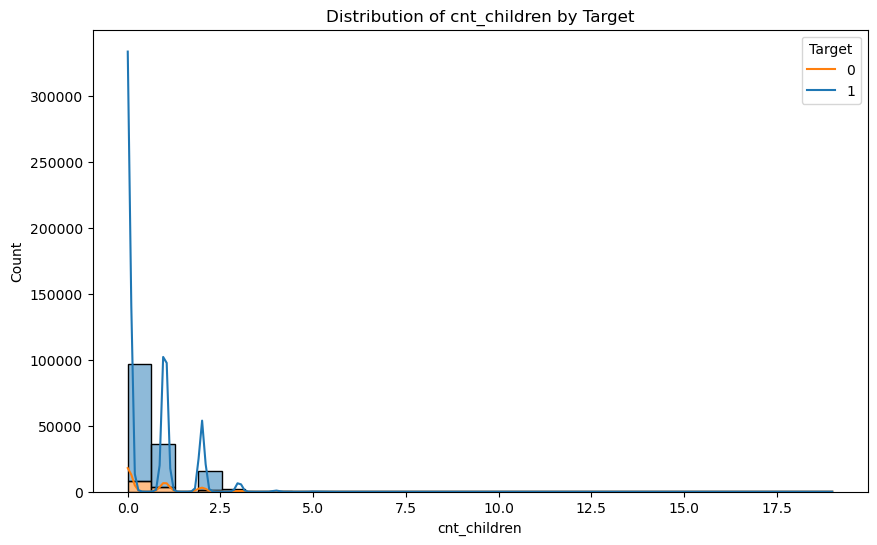

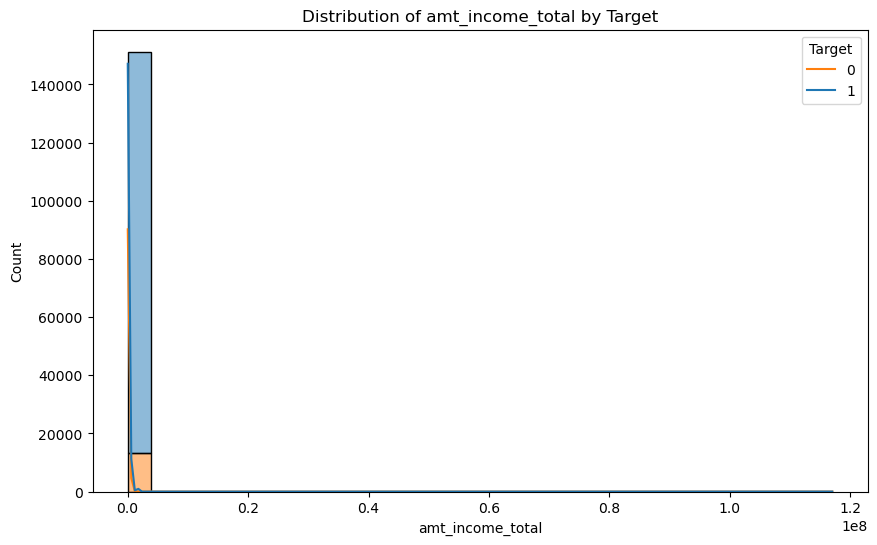

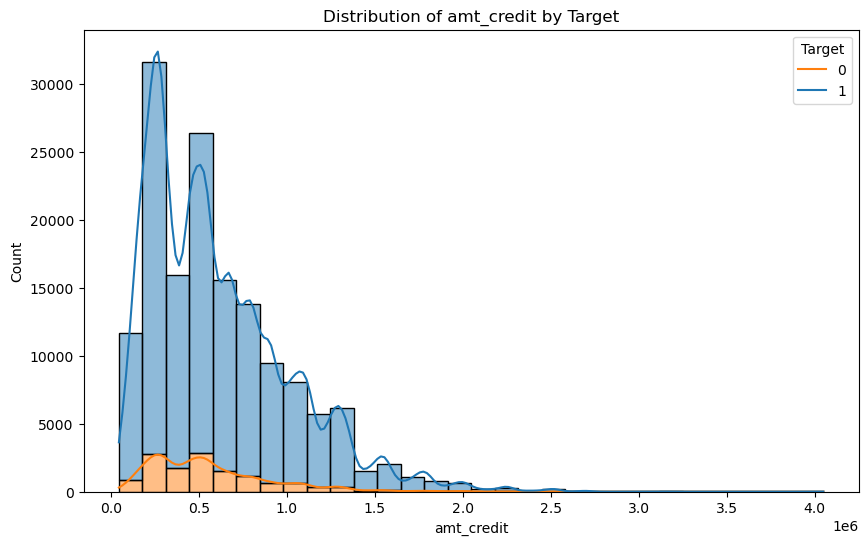

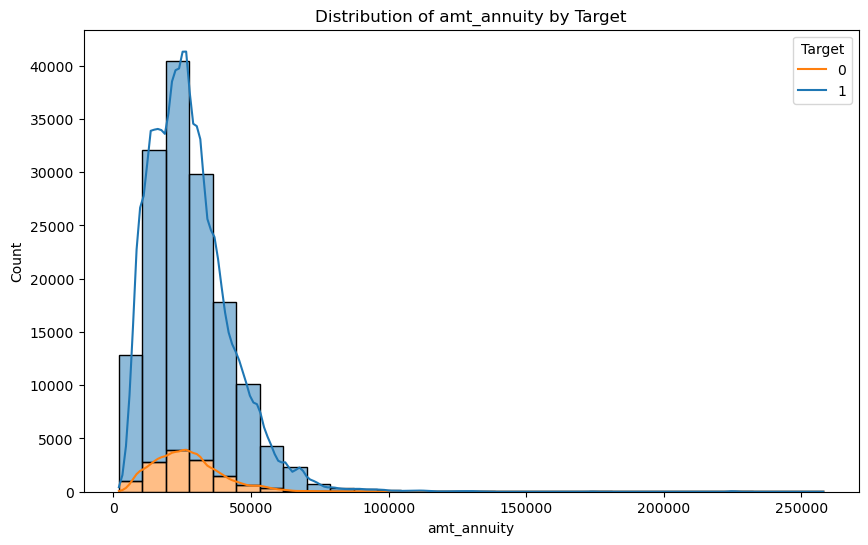

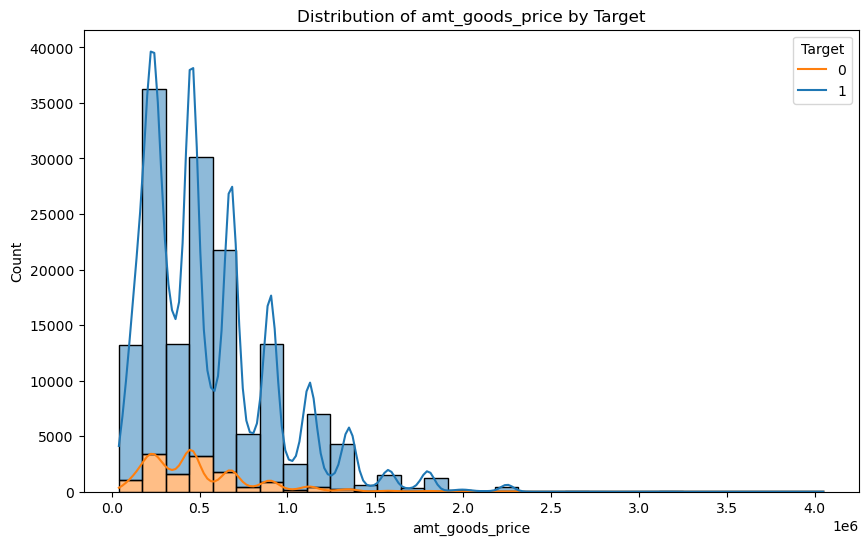

...

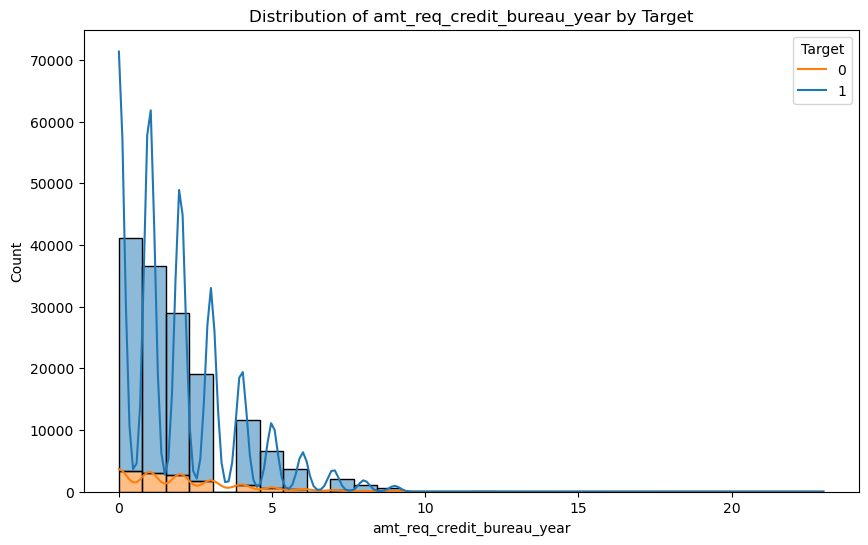

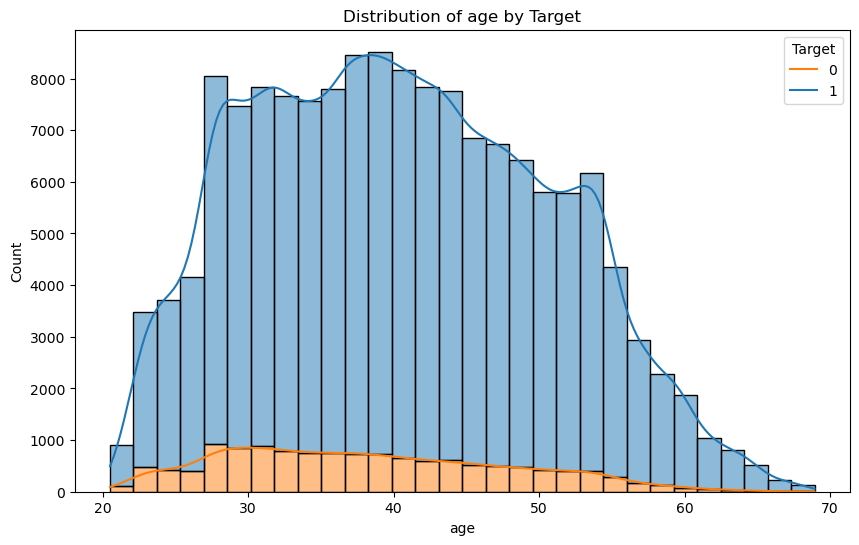

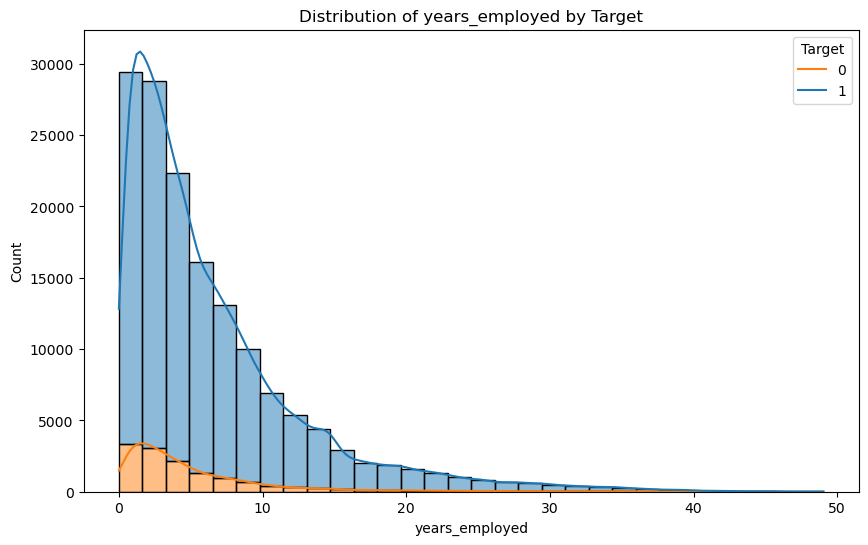

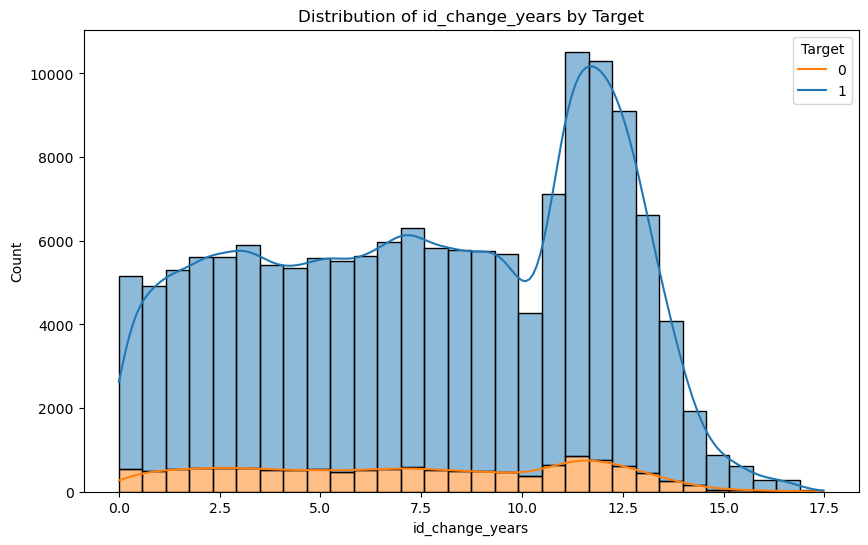

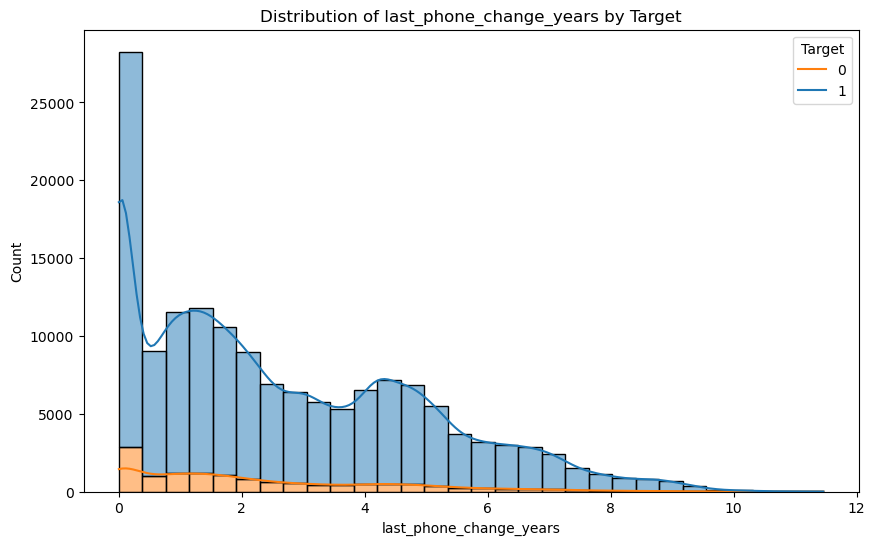

In [441]:
for col in df_clean1.select_dtypes(include=['int32', 'int64', 'float64']).columns:
    if len(df_clean1[col].unique()) > 3:
        plt.figure(figsize=(10, 6))
        sns.histplot(data=df_clean1, x=df_clean1[col].values, hue='target', kde=True, bins=30, multiple='stack')
        plt.title(f'Distribution of {col} by Target')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.legend(title='Target', labels=['0', '1'])
        plt.show()

Now lets look at some of the relationship between our Target variables and numerical values with 3 or fewer unique values for easy interpretation

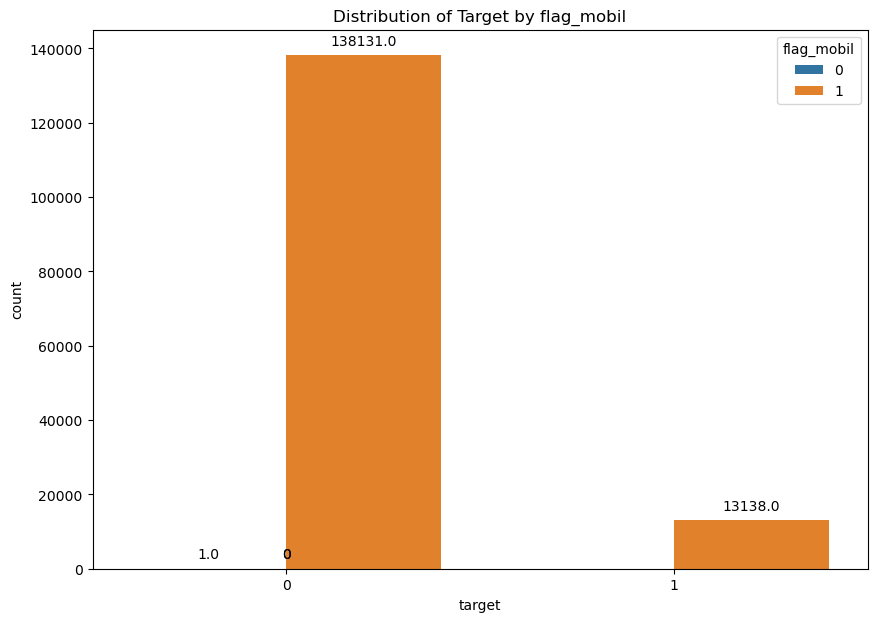

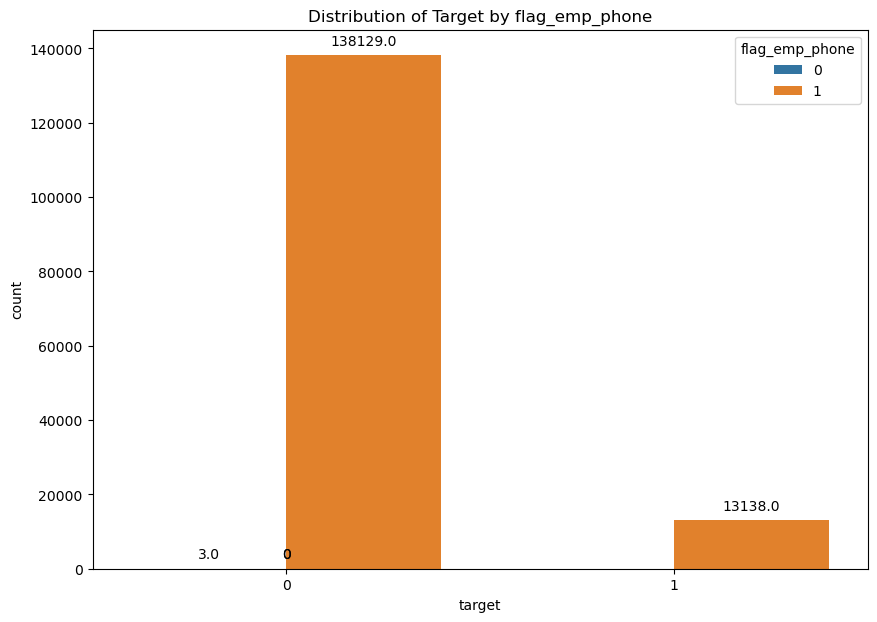

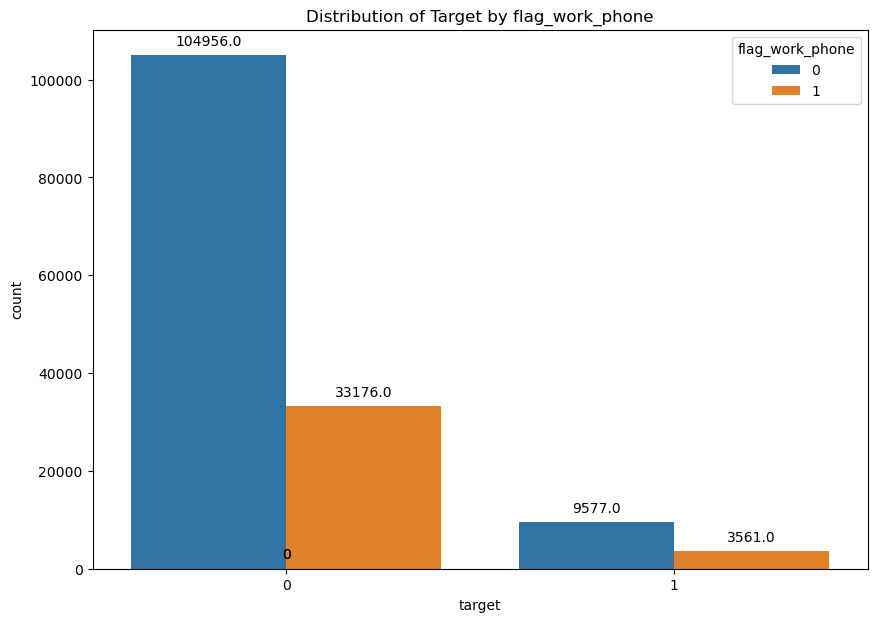

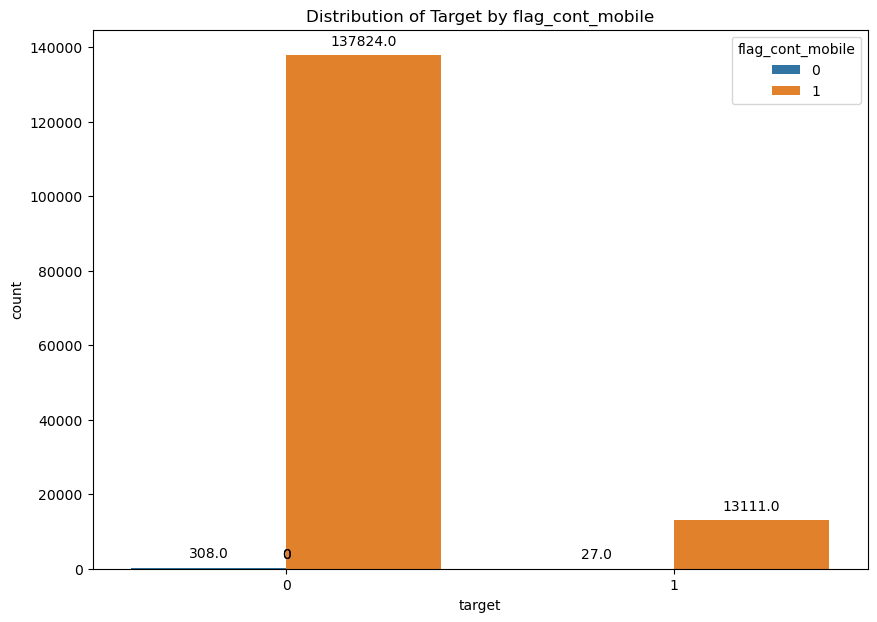

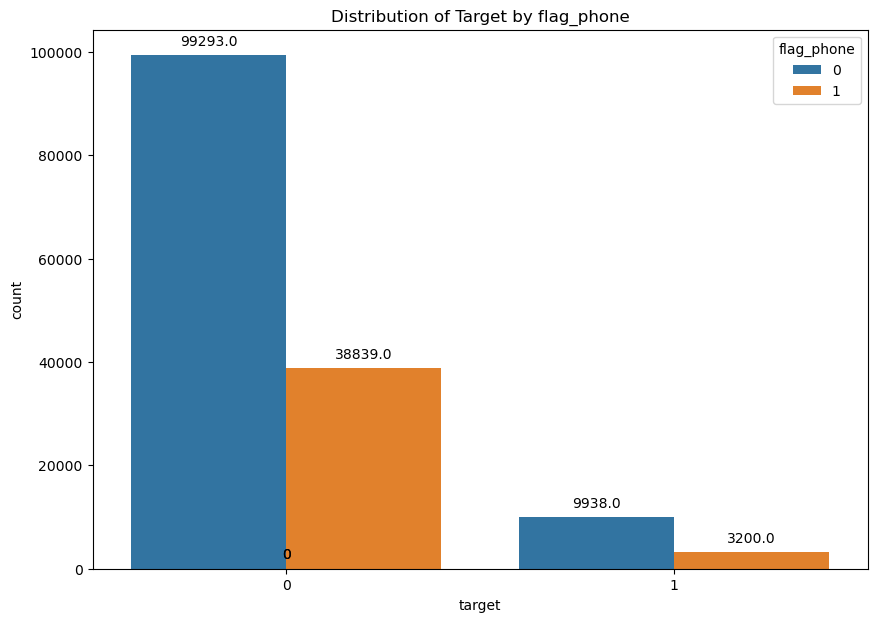

...

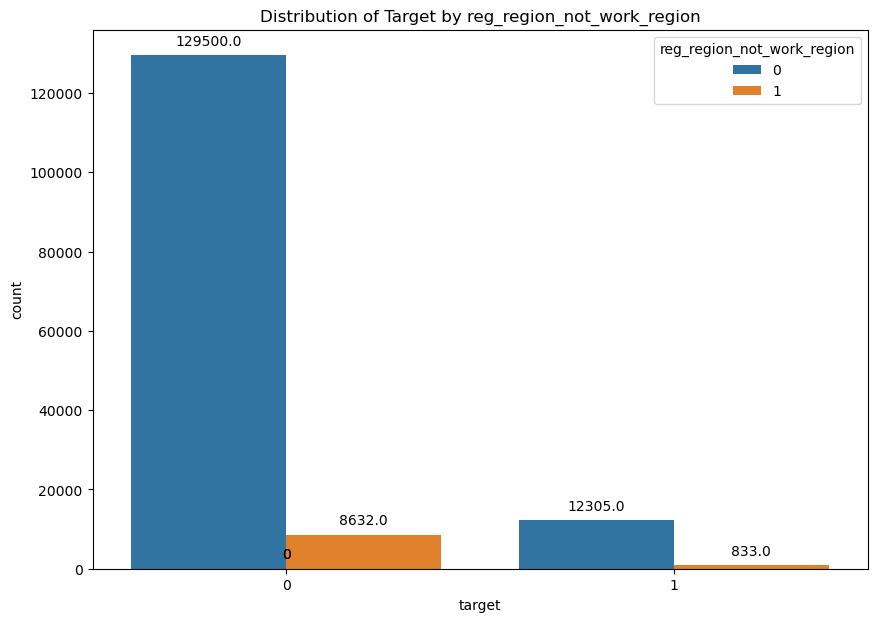

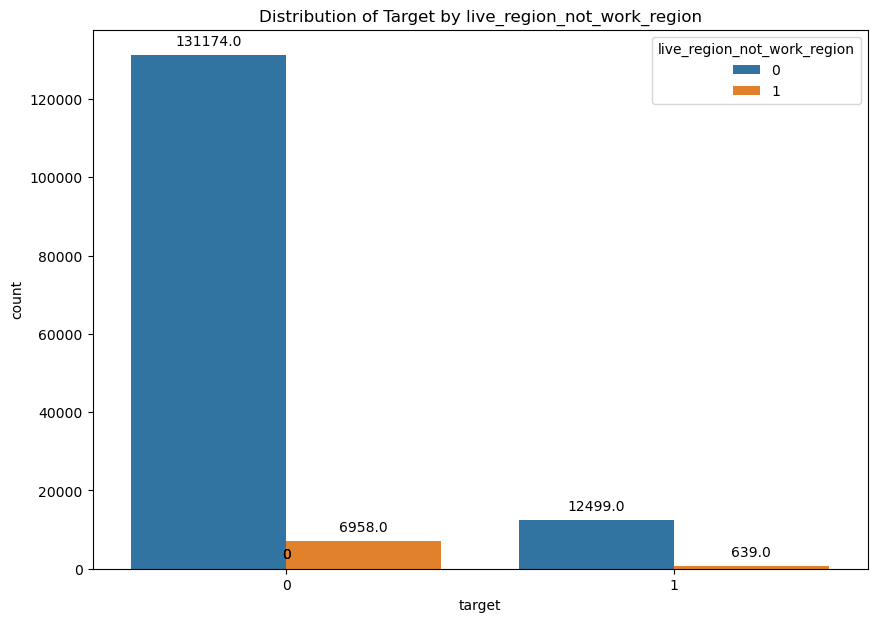

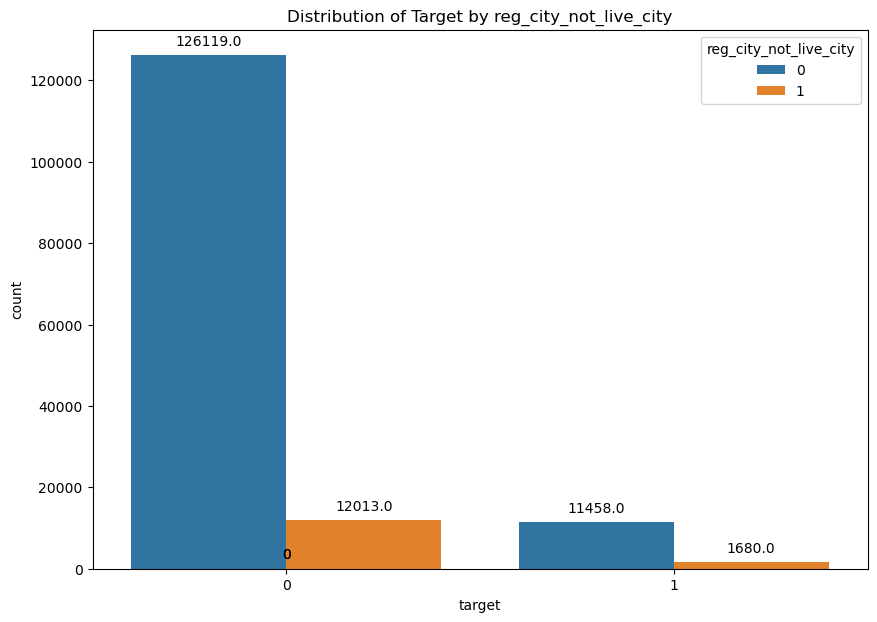

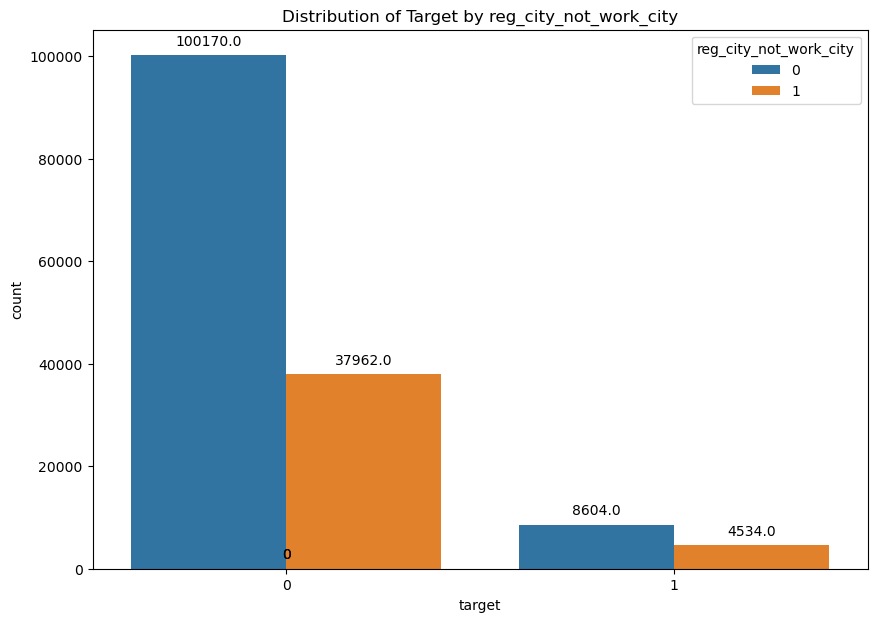

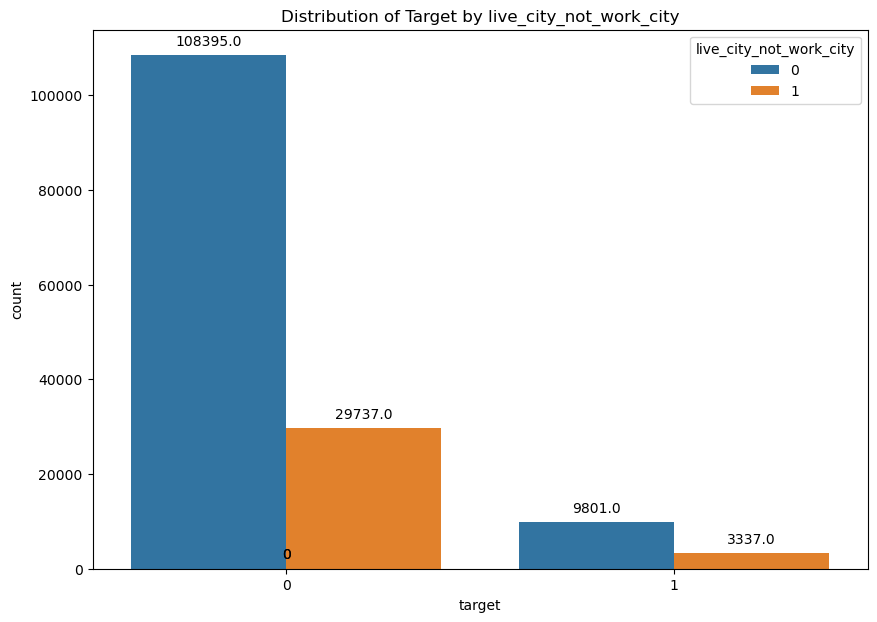

In [443]:
# Specify the column to exclude
exclude_column = 'target'

# Iterate over each column in df_clean1
for i in df_clean1.columns:
    # Check if the column is not the one to exclude and if the column is not of object type and has 3 or fewer unique values
    if i != exclude_column and (len(df_clean1[i].unique()) <= 3 and not df_clean1[i].dtype == 'object'):
        plt.figure(figsize=(10, 7))
        ax = sns.countplot(data=df_clean1, x='target', hue=i)
        
        # Annotate the bars with their counts
        for p in ax.patches:
            ax.annotate(p.get_height(), 
                        (p.get_x() + p.get_width() / 2., p.get_height()), 
                        ha='center', 
                        va='center', 
                        xytext=(0, 10), 
                        textcoords='offset points')
        
        # Add title
        plt.title(f'Distribution of Target by {i}')
        
        # Show plot
        plt.show()

All applicants except one provided their mobile phone during the application process. Among those who defaulted, all 13,138 had a mobile phone listed in their application.

A majority of applicants did not provide a work phone number. Notably, the highest number of defaulted applicants (9,577) did not have a home phone listed in their application.

Very few applicants had unreachable mobile phones. Among those who defaulted, 13,111 could be contacted via their mobile phone, while only 27 applicants could not be reached.

The largest group of defaulted applicants (9,938) did not provide a home phone number in their application.

The majority of defaulted applicants (12,373) did not provide an email address during their application.

The highest number of defaulted applicants resided in regions rated number 1, followed by those in regions rated number 2.

Similarly, the highest number of defaulted applicants lived in cities rated number 1, followed by those in cities rated number 2.

The majority of defaulted applicants (12,895) had their contact address match their permanent address at the region level. Only 243 applicants provided incorrect addresses.

Most defaulted applicants (12,305) had their work contact address match their permanent address at region level. Only 833 applicants provided incorrect addresses.

The majority of defaulted applicants (12,499) had their work contact address match their contact address at region level. Only 639 applicants provided incorrect addresses.

The majority of defaulted applicants (11,458) had their contact address match their permanent address at the city level. Only 1,680 applicants provided incorrect addresses.

The majority of defaulted applicants (8,604) had their work contact address match their permanent address at the city level, while around 4,534 applicants provided incorrect addresses.

Most defaulted applicants (9,801) had their work contact address match their contact address at the city level, while around 3,337 applicants provided incorrect addresses.

We see that most of the features are quite skewed in nature. Depending on the model we use, it might be necessary to apply some transformations on these features to make the model perform better and faster.

I found a slight error in one of the graphs above, where flag_work_phone and flag_phone has the same description. There is another column named flag_emp_mobil which possibily mean work phone. Therefore I am looking to drop the flag_emp_phone and will change the description of the flag_work_phone column.



In [446]:
# List of column names to drop
columns_to_drop3 = ['flag_emp_phone']

# Drop the specified columns from the DataFrame
df_clean2 = df_clean1.drop(columns=columns_to_drop3)

In [447]:
# To show the info of the Dataset
df_clean2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int64  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

I am also deleting days_birth', 'days_id_publish', 'days_last_phone_change', 'days_employed' as i have converted them to years and created a new column for them 

In [448]:
# List of column names to drop
columns_to_drop4 = ['days_birth', 'days_id_publish', 'days_last_phone_change', 'days_employed']

# Drop the specified columns from the DataFrame
df_clean3 = df_clean2.drop(columns=columns_to_drop4)

In [449]:
# To show the info of the Dataset
df_clean3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 48 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int64  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

# Part 3 - <ins> Preliminary Exploratory Data Analysis 2 <a id='preliminaryeda2'></a> <ins> 

## Positive and Negative Correlation between numerical variables <a id='positivenegativecorr'></a> <ins>

#### Which columns are positively correlated with the target Variable? Which columns are negatively correlated? 

Lets explain the correlation of all the variables by a heat map. A heatmap is a graphical representation of data where values in a matrix are represented as colors. <br>
It's particularly useful for visualizing the correlation between different variables in a dataset. Here's how you can interpret a heatmap:

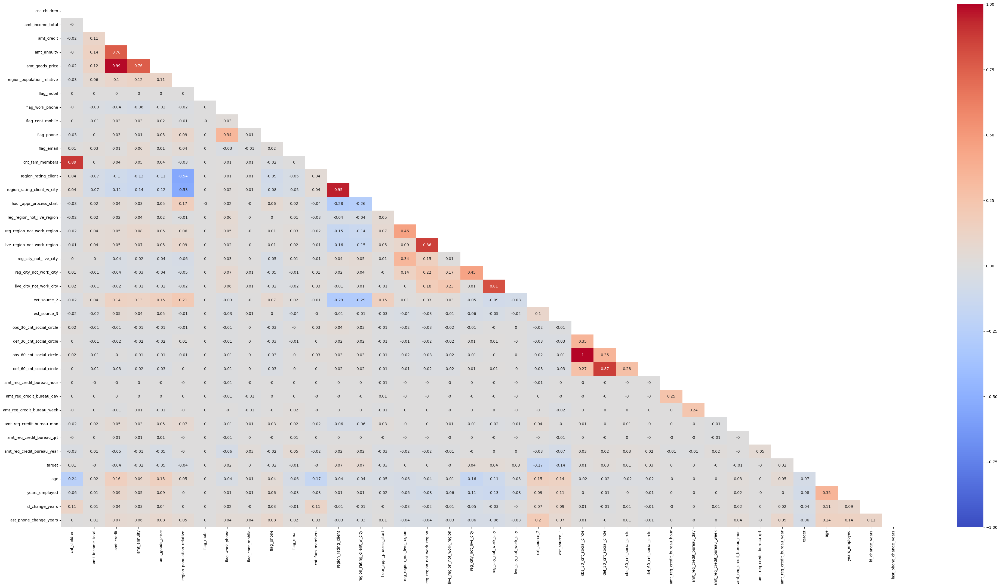

In [456]:
# Select numerical columns
data_num_columns = df_clean3.select_dtypes(include='number').columns.tolist()
mask = np.triu(df_clean3[data_num_columns].corr())
# Generate a heatmap of the correlation matrix
plt.figure(figsize=(50,25))
sns.heatmap(df_clean3[data_num_columns].corr().round(2), annot=True, vmax=1, vmin=-1, cmap='coolwarm', mask=mask, center=0)
plt.show()

Interpreting the Colors from the above heatmap: 

Red (+1): Strong positive correlation. <br>
Pink/Light Red: Moderate positive correlation. <br>
White/Gray (0): No correlation. <br>
Light Blue: Moderate negative correlation. <br>
Blue (-1): Strong negative correlation. <br>

Few Observations and Interpretations from the above Heatmap:

Positive Correlation

Explanation: A positive correlation means that as one variable increases, the other variable also tends to increase. Conversely, as one variable decreases, the other tends to decrease. This indicates a direct relationship between the two variables.

Interpretation: If the heatmap shows a positive correlation (often depicted in shades of blue or green depending on the color scheme), it suggests that the variables move in the same direction. For example, if X and Y have a positive correlation, when X goes up, Y also goes up, and when X goes down, Y goes down.

Example: In the above map,  a positive correlation between amt_good_price and amt_credit would suggest that higher the price of the asset individuals hold tend to take out higher amount loans.

Negative Correlation

Explanation: A negative correlation means that as one variable increases, the other variable tends to decrease. This indicates an inverse relationship between the two variables.

Interpretation: If the heatmap shows a negative correlation (often depicted in shades of red or orange), it suggests that the variables move in opposite directions. For example, if X and Y have a negative correlation, when X goes up, Y goes down, and when X goes down, Y goes up.

Example: In the above map, a negative correlation between days_last_phone_change and last_phone_change_years would suggest that days_last_phone_change column has all negative values and last_phone_change_years have all positive values (This column was created as part of EDA process).

Zero or No Correlation

Explanation: A zero or near-zero correlation means there is no discernible linear relationship between the two variables. Changes in one variable do not predict changes in the other.

Interpretation: In a heatmap, zero or very low correlations are usually shown in a neutral color (often white or gray). This indicates that the variables do not move together in any consistent pattern.

Heatmap Visualization

Color Intensity: The intensity of the color in a heatmap represents the strength of the correlation. Darker or more intense colors indicate stronger correlations (positive or negative), while lighter colors indicate weaker correlations.

Diagonal: The diagonal of a heatmap matrix typically shows correlations of variables with themselves, which are always 1 (perfect correlation) and are often left blank or colored in a neutral tone to highlight the other correlations.

In [458]:
# Create an empty list to store p-values
p_values = []

# Calculate p-value for each column
for column in data_num_columns:
    correlation_coefficient, p_value = pearsonr(df_clean3['target'], df_clean3[column])
    p_values.append({'Numerical Variable': column, 'Correlation Coefficient': correlation_coefficient, 'P-value': p_value})

# Convert the list of dictionaries to a DataFrame
p_values_df = pd.DataFrame(p_values)

# Format the P-value column to display in decimal format
pd.options.display.float_format = '{:.10f}'.format

# Display the p-values DataFrame
print(p_values_df)

             Numerical Variable  Correlation Coefficient      P-value
0                  cnt_children             0.0081619975 0.0015009045
1              amt_income_total            -0.0031543688 0.2198844001
2                    amt_credit            -0.0413811892 0.0000000000
3                   amt_annuity            -0.0191763492 0.0000000000
4               amt_goods_price            -0.0510875207 0.0000000000
5    region_population_relative            -0.0434007333 0.0000000000
6                    flag_mobil             0.0007929440 0.7577774285
7               flag_work_phone             0.0202734583 0.0000000000
8              flag_cont_mobile             0.0010462799 0.6840586327
9                    flag_phone            -0.0236404633 0.0000000000
10                   flag_email            -0.0062996465 0.0142795309
11              cnt_fam_members            -0.0017152643 0.5046952645
12         region_rating_client             0.0681067614 0.0000000000
13  region_rating_cl

Strong Negative Correlations:

* ext_source_2: Correlation coefficient of -0.171345 (p-value < 0.0001). This strong negative correlation indicates that higher values of ext_source_2 are associated with a lower probability of home loan default.
* ext_source_3: Correlation coefficient of -0.140799 (p-value < 0.0001). Similarly, higher values of ext_source_3 are associated with a lower probability of default.

Other Notable Negative Correlations:

* amt_goods_price: Correlation coefficient of -0.051088 (p-value < 0.0001). Higher loan amounts for house prices are slightly associated with lower defaults.
* amt_credit: Correlation coefficient of -0.041381 (p-value < 0.0001). Higher credit amounts are slightly associated with lower defaults.
* amt_annuity: Correlation coefficient of -0.019176 (p-value < 0.0001). Higher annuity amounts are slightly associated with lower defaults.

Weak Positive Correlations:

* years_employed: Correlation coefficient of 0.075776 (p-value < 0.0001). Longer employment duration is weakly associated with higher defaults.
* region_rating_client_w_city: Correlation coefficient of 0.070311 (p-value < 0.0001). Higher ratings of the client's region and city are weakly associated with higher defaults.
* region_rating_client: Correlation coefficient of 0.068107 (p-value < 0.0001). Similar to the previous point, higher region ratings are weakly associated with higher defaults.

Variables with Insignificant Correlations:

* amt_req_credit_bureau_hour/day/week/qrt/year: Correlation coefficients are very close to zero with p-values indicating no significant correlation.
* flag_mobil: Correlation coefficient of 0.000793 (p-value = 0.7578). Indicates no significant correlation with the target variable.
* cnt_fam_members: Correlation coefficient of -0.001715 (p-value = 0.5047). Indicates no significant correlation with the target variable. Therefore these variables may be deleted.

Detailed Interpretation:

Highly Significant Variables:

* ext_source_2 and ext_source_3: These external sources seem to provide significant predictive power in the model. It’s crucial to investigate what these sources measure and how they relate to the applicant’s creditworthiness.
* years_employed: While the correlation is weak, it is highly significant. Employment duration is a critical variable in assessing the risk of default.

Moderately Significant Variables:

* amt_goods_price and amt_credit: These variables, though moderately correlated, indicate that higher loan amounts might be granted to lower-risk applicants.

Negligible or Insignificant Variables:

* Various Flags (flag_mobil, flag_cont_mobile,amt_req_credit_bureau_hour/day/week/qrt/year etc.): These variables show very weak or no correlation with defaults, suggesting that they might not add significant predictive value to the model.

P-values:

A p-value less than 0.05 generally indicates that the correlation is statistically significant. Most variables listed have very low p-values, confirming the significance of the correlations.

Conclusion

The correlation analysis provides valuable insights into which variables are most strongly associated with loan defaults.

Key Predictors:

ext_source_2 and ext_source_3 should be considered key predictors due to their strong negative correlation with defaults.
days_employed and region ratings are also important, despite weaker correlations.

Model Improvement:

Variables with negligible correlations (e.g., flag_mobil, cnt_fam_members) might be deprioritized or excluded from the model to streamline it without losing predictive power.

Investigating why certain variables have strong correlations could provide deeper insights. For instance, understanding what ext_source_2 and ext_source_3 measure could help in refining the model further. Although we dont have any external source this information can be gathered from, but this is worth a thought.

In [460]:
# Filter the DataFrame to include only variables with p-values > 0.05
filtered_p_values_df = p_values_df[p_values_df['P-value'] > 0.05]

# Display the filtered DataFrame
print(filtered_p_values_df)

             Numerical Variable  Correlation Coefficient      P-value
1              amt_income_total            -0.0031543688 0.2198844001
6                    flag_mobil             0.0007929440 0.7577774285
8              flag_cont_mobile             0.0010462799 0.6840586327
11              cnt_fam_members            -0.0017152643 0.5046952645
15   reg_region_not_live_region             0.0028768632 0.2631809929
16   reg_region_not_work_region             0.0010615403 0.6797045731
17  live_region_not_work_region            -0.0022366315 0.3843567391
27   amt_req_credit_bureau_hour             0.0008856834 0.7304928442
28    amt_req_credit_bureau_day             0.0010924587 0.6709158195
29   amt_req_credit_bureau_week            -0.0011471016 0.6554933868
31    amt_req_credit_bureau_qrt            -0.0021009301 0.4138608581


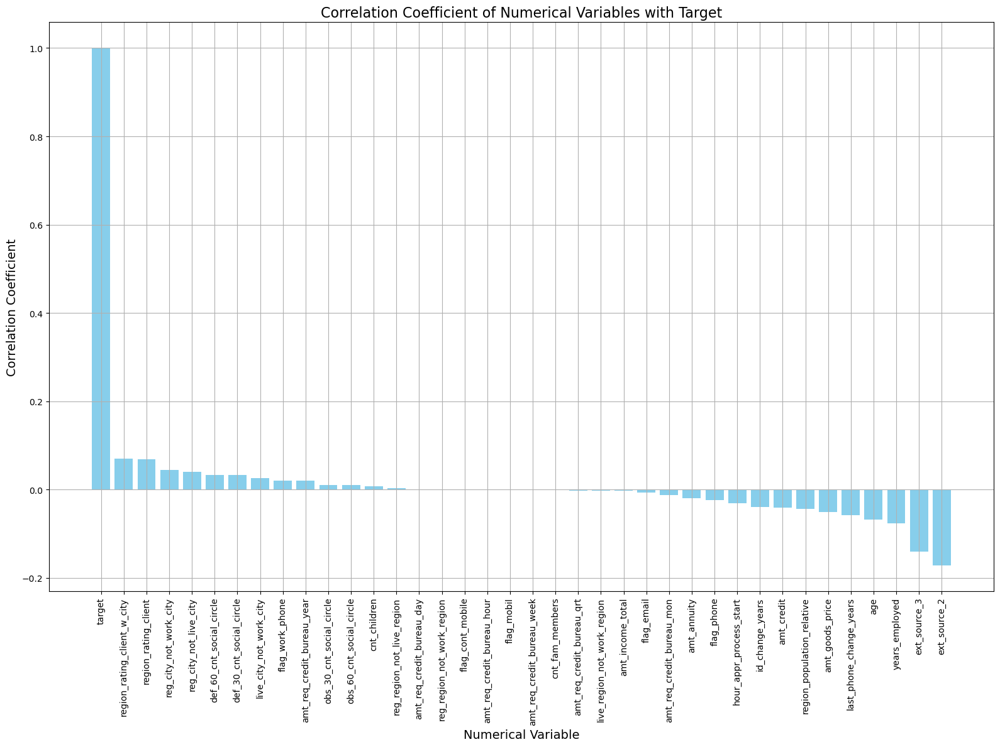

In [461]:
# Plotting
plt.figure(figsize=(16, 12))
p_values_df = p_values_df.sort_values(by='Correlation Coefficient', ascending=False)

# Bar plot
bars = plt.bar(p_values_df['Numerical Variable'], p_values_df['Correlation Coefficient'], color='skyblue')

# Adding labels and title
plt.title('Correlation Coefficient of Numerical Variables with Target', fontsize=16)
plt.xlabel('Numerical Variable', fontsize=14)
plt.ylabel('Correlation Coefficient', fontsize=14)
plt.xticks(rotation=90)

plt.grid(True)
plt.tight_layout()
plt.show()


To visually analyse our correlations between the numerical variables and target variable, the above bar plot was created. 

To streamline the Logistic Regression models especially without losing predictive power, we could consider excluding variables with negligible correlations. These variables show very weak correlations with the target variable and are unlikely to contribute significantly to the model's predictive performance. And we can see what variables can be deleted from the above plot.

### <ins> Variables to Consider Excluding/Deleting <ins>
    
Based on the correlation coefficients and p-values resulted above, the following variables have negligible correlations with the target variable (home loan default) and might be considered for exclusion:

* flag_mobil: Correlation coefficient = 0.000793, p-value = 0.7578
* cnt_fam_members: Correlation coefficient = -0.001715, p-value = 0.5047
* amt_req_credit_bureau_hour: Correlation coefficient = 0.000886, p-value = 0.7305
* amt_req_credit_bureau_day: Correlation coefficient = 0.001092, p-value = 0.6709
* amt_req_credit_bureau_week: Correlation coefficient = -0.001147, p-value = 0.6555
* amt_req_credit_bureau_qrt: Correlation coefficient = -0.002101, p-value = 0.4139
* reg_region_not_work_region: Correlation coefficient = 0.001062, p-value = 0.6797
* flag_cont_mobile: Correlation coefficient = 0.001046, p-value = 0.6841
    
These variables have correlation coefficients very close to zero, and their p-values are high, indicating that they are not significantly correlated with the target variable.

### <ins> Reassessing Other Variables <ins>
    
Variables with slightly higher correlations but still relatively low impact might also be considered for exclusion if the goal is to simplify the model:

* flag_email: Correlation coefficient = -0.006300, p-value = 0.01428 (Note: This is weakly significant but might still be considered for exclusion based on business context)
* amt_income_total: Correlation coefficient = -0.003154, p-value = 0.2199
* reg_region_not_live_region: Correlation coefficient = 0.002877, p-value = 0.2632
* live_region_not_work_region: Correlation coefficient = -0.002237, p-value = 0.3844
* amt_req_credit_bureau_mon: Correlation coefficient = -0.012495, p-value = 0.0000011755 (Note: This is significant, but the correlation is very low, so it could be reconsidered based on the model’s overall performance)

Lets now go ahead and delete 

flag_mobil, <br>
cnt_fam_members, <br>
amt_req_credit_bureau_hour, <br>
amt_req_credit_bureau_day, <br>
amt_req_credit_bureau_week, <br>
amt_req_credit_bureau_qrt, <br>
reg_region_not_work_region, and <br>
flag_cont_mobile

In [463]:
# List of column names to drop
columns_to_drop5 = ['flag_mobil', 'cnt_fam_members', 'amt_req_credit_bureau_hour', 'amt_req_credit_bureau_day', 'amt_req_credit_bureau_week', 'amt_req_credit_bureau_qrt', 'reg_region_not_work_region', 'flag_cont_mobile', 'reg_region_not_live_region', 'live_region_not_work_region']

# Drop the specified columns from the DataFrame
df_clean4 = df_clean3.drop(columns=columns_to_drop5)

We have now successfully dropped these variables lets do a sanity check

In [1062]:
df_clean3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 48 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int64  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

# Part 4 - <ins> Feature Engineering <a id='featureeng'></a> <ins>


Choosing and engineering which features to include in a model is a lot like making an argument for a debate or essay. There are a lot of things of varying relevance that could be included, but the key is choosing the correct ones, synthesizing different arguments into one, and modeling them correctly.

Oftentimes, a successful model is not determined by the exact method chosen to model the outcome, but by the data and features used to create it. The first part of a successful model is usually choosing, adding, and constructing new features.

Lets first go ahead and convert all float64 to int inorder to prepare the data for modeling.

In [467]:
df_clean4['age'] = df_clean4.age.fillna(0).astype(int)

In [468]:
df_clean4['years_employed'] = df_clean4.years_employed.fillna(0).astype(int)

In [469]:
df_clean4['id_change_years'] = df_clean4.id_change_years.fillna(0).astype(int)

In [470]:
df_clean4['last_phone_change_years'] = df_clean4.last_phone_change_years.fillna(0).astype(int)

In [471]:
df_clean4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 38 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int64  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

Now that we have converted all the float type variables to int type variables, Lets now convert all int64 to int32 datatypes for speeder processing and faster fitting of our models since our dataset is pretty huge to save space.

There are three variables that are still under a float 64 that is region_population_relative, ext_source_2 and ext_source_3 as the data under these variables are in decimals between 0 and 1. These seem to be vital information and thus we will not convert this to int. 

In [473]:
# Convert all int64 columns to int32
df_clean4 = df_clean4.astype({col: 'int32' for col in df_clean4.select_dtypes(include='int64').columns})

In [474]:
df_clean4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 38 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   name_contract_type           151270 non-null  object 
 1   code_gender                  151270 non-null  object 
 2   flag_own_car                 151270 non-null  object 
 3   cnt_children                 151270 non-null  int32  
 4   amt_income_total             151270 non-null  int32  
 5   amt_credit                   151270 non-null  int32  
 6   amt_annuity                  151270 non-null  int32  
 7   amt_goods_price              151270 non-null  int32  
 8   name_type_suite              151270 non-null  object 
 9   name_income_type             151270 non-null  object 
 10  name_education_type          151270 non-null  object 
 11  name_family_status           151270 non-null  object 
 12  name_housing_type            151270 non-null  object 
 13  regi

#### Categorical-to-Numerical conversion

Before we look at the other classification techniques, we need to learn about ways to represent categorical data as numerical data. Most of the scikit-learn models require numerical inputs, but we have a number of ways to convert data.

#### One-Hot Encoding

One method of changing categorical values into numerical values (appropriate for when there is no inherent order to the categories) is called "one-hot" encoding. This takes a single column of categorical data with k categories and transforms it into k columns of binary 0/1 data, one column for each of the unique category values that existed in the column. Each row will have a  1 in the column corresponding to its original categorical value, and a  0 in all the other columns.

In [476]:
# Filter columns with object data types
object_columns = df_clean4.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   name_contract_type   151270 non-null  object
 1   code_gender          151270 non-null  object
 2   flag_own_car         151270 non-null  object
 3   name_type_suite      151270 non-null  object
 4   name_income_type     151270 non-null  object
 5   name_education_type  151270 non-null  object
 6   name_family_status   151270 non-null  object
 7   name_housing_type    151270 non-null  object
 8   occupation_type      151270 non-null  object
 9   organization_type    151270 non-null  object
dtypes: object(10)
memory usage: 12.7+ MB


The above results are list of object type variables we currently hold in our data. Lets take a look at the first variable 'name_contract_type'

In [478]:
df_clean4['name_contract_type'].value_counts()

name_contract_type
Cash loans         135810
Revolving loans     15460
Name: count, dtype: int64

We understand that there are two kinds of loans present under this column. Cash loans and Revolving loans. Lets create dummy variables that include both these values. 

In [480]:
# Create dummy variables from 'Trap type' column
contract_type_dummies = pd.get_dummies(df_clean4['name_contract_type'], prefix='contract_type').astype(int)
contract_type_dummies

,contract_type_Cash loans,contract_type_Revolving loans
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0
...,...,...
184498,1,0
184499,1,0
184501,1,0
184503,1,0



Now that we have created dummy variables for the column name_contract_type, lets go ahead and determine how many value counts does each of these contract types hold

In [482]:
# check all value counts of the dummy variables
contract_type_dummies.value_counts()

contract_type_Cash loans  contract_type_Revolving loans
1                         0                                135810
0                         1                                 15460
Name: count, dtype: int64

Since Home loans are Cash loans and not Revolving loans lets go ahead and drop Revolving loans column

In [484]:
contract_type_dummies = contract_type_dummies.drop(columns='contract_type_Revolving loans')

The above code should have deleted the column contract_type_Revolving loans. Lets do a sanity check. 

In [486]:
# This gives us a quick summary of the dummy column, the datatypes, and the number of non-null values
contract_type_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 1 columns):
 #   Column                    Non-Null Count   Dtype
---  ------                    --------------   -----
 0   contract_type_Cash loans  151270 non-null  int32
dtypes: int32(1)
memory usage: 1.7 MB


As we can see above, we have created dummy variables for the one remaining contract type by removing the revolving_loan dummy since its data is not particularly relevant for this particular project. 

Now lets go ahead and concatenate the dummy variables with the Original Dataset

In [488]:
# Concatenate the dummy variables with the original DataFrame
df_clean4 = pd.concat([df_clean4, contract_type_dummies], axis=1)

The above code should have concatenated the dummy variables with the dataframe, now lets check to see if this has worked. 

In [490]:
# Shows first five rows of the data
df_clean4.head()

,name_contract_type,code_gender,flag_own_car,cnt_children,amt_income_total,amt_credit,amt_annuity,amt_goods_price,name_type_suite,name_income_type,...,obs_60_cnt_social_circle,def_60_cnt_social_circle,amt_req_credit_bureau_mon,amt_req_credit_bureau_year,target,age,years_employed,id_change_years,last_phone_change_years,contract_type_Cash loans
0,Cash loans,F,N,1,67500,227520,11065,180000,Family,Commercial associate,...,0,0,1,2,0,47,2,2,0,1
1,Cash loans,M,Y,1,247500,1882372,65560,1719000,Unaccompanied,Working,...,0,0,0,3,0,51,0,5,1,1
2,Cash loans,M,Y,1,180000,101880,10827,90000,"Spouse, partner",Working,...,1,0,2,1,0,40,16,12,0,1
3,Cash loans,M,N,0,81000,405000,20677,405000,Unaccompanied,Working,...,7,1,0,2,0,34,16,12,4,1
4,Cash loans,F,N,0,157500,888840,29506,675000,Unaccompanied,Working,...,2,0,0,2,0,44,0,12,0,1


In [491]:
df_clean4.shape

(151270, 39)

Since the whole data contains information for cash loans only which is relevant for home loans, we can delete the newly created dummy variable and the original variable name_contract_type

In [493]:
# List of column names to drop
columns_to_drop6 = ['name_contract_type', 
    'contract_type_Cash loans']

# Drop the specified columns from the DataFrame
df_clean5 = df_clean4.drop(columns=columns_to_drop6)

In [494]:
# Sanity check
df_clean5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 37 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   code_gender                  151270 non-null  object 
 1   flag_own_car                 151270 non-null  object 
 2   cnt_children                 151270 non-null  int32  
 3   amt_income_total             151270 non-null  int32  
 4   amt_credit                   151270 non-null  int32  
 5   amt_annuity                  151270 non-null  int32  
 6   amt_goods_price              151270 non-null  int32  
 7   name_type_suite              151270 non-null  object 
 8   name_income_type             151270 non-null  object 
 9   name_education_type          151270 non-null  object 
 10  name_family_status           151270 non-null  object 
 11  name_housing_type            151270 non-null  object 
 12  region_population_relative   151270 non-null  float64
 13  flag

In [495]:
# Filter columns with object data types
object_columns = df_clean5.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   code_gender          151270 non-null  object
 1   flag_own_car         151270 non-null  object
 2   name_type_suite      151270 non-null  object
 3   name_income_type     151270 non-null  object
 4   name_education_type  151270 non-null  object
 5   name_family_status   151270 non-null  object
 6   name_housing_type    151270 non-null  object
 7   occupation_type      151270 non-null  object
 8   organization_type    151270 non-null  object
dtypes: object(9)
memory usage: 11.5+ MB


In [496]:
df_clean5['code_gender'].value_counts()

code_gender
F    94229
M    57041
Name: count, dtype: int64

In [497]:
# Create dummy variables for 'code_gender' column
df_clean5 = pd.get_dummies(df_clean5, columns=['code_gender'], prefix='gender')

# Ensure the dummy variables are of type int32
df_clean5 = df_clean5.astype({'gender_F': 'int32', 'gender_M': 'int32'})

# Display the DataFrame with dummy variables
print(df_clean5)

       flag_own_car  cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                 N             1             67500      227520        11065   
1                 Y             1            247500     1882372        65560   
2                 Y             1            180000      101880        10827   
3                 N             0             81000      405000        20677   
4                 N             0            157500      888840        29506   
...             ...           ...               ...         ...          ...   
184498            N             1            112500      640080        29970   
184499            N             0             90000      592560        30253   
184501            N             1            135000      143910        15498   
184503            N             0            135000      900000        45954   
184505            N             0             81000      167895        17757   

        amt_goods_price  name_type_suit

In [498]:
df_clean5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 38 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   flag_own_car                 151270 non-null  object 
 1   cnt_children                 151270 non-null  int32  
 2   amt_income_total             151270 non-null  int32  
 3   amt_credit                   151270 non-null  int32  
 4   amt_annuity                  151270 non-null  int32  
 5   amt_goods_price              151270 non-null  int32  
 6   name_type_suite              151270 non-null  object 
 7   name_income_type             151270 non-null  object 
 8   name_education_type          151270 non-null  object 
 9   name_family_status           151270 non-null  object 
 10  name_housing_type            151270 non-null  object 
 11  region_population_relative   151270 non-null  float64
 12  flag_work_phone              151270 non-null  int32  
 13  flag

In [499]:
# Filter columns with object data types
object_columns = df_clean5.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   flag_own_car         151270 non-null  object
 1   name_type_suite      151270 non-null  object
 2   name_income_type     151270 non-null  object
 3   name_education_type  151270 non-null  object
 4   name_family_status   151270 non-null  object
 5   name_housing_type    151270 non-null  object
 6   occupation_type      151270 non-null  object
 7   organization_type    151270 non-null  object
dtypes: object(8)
memory usage: 10.4+ MB


In [500]:
df_clean5['flag_own_car'].value_counts()

flag_own_car
N    94491
Y    56779
Name: count, dtype: int64

In [501]:
# Create dummy variables for 'code_gender' column
df_clean5 = pd.get_dummies(df_clean5, columns=['flag_own_car'], prefix='own_car')

# Ensure the dummy variables are of type int32
df_clean5 = df_clean5.astype({'own_car_N': 'int32', 'own_car_Y': 'int32'})

# Display the DataFrame with dummy variables
print(df_clean5)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price  name_type_suite      name_income_type  \
0                180000           Family  Commercial associate   
1               1719000    Unaccompanied               Working 

In [502]:
df_clean5['name_type_suite'].value_counts()

name_type_suite
Unaccompanied      123557
Family              18988
Spouse, partner      5854
Children             1364
Other_B               905
Other_A               463
Group of people       139
Name: count, dtype: int64

In [503]:
# Create dummy variables from 'Trap type' column
accompanied_with_dummies = pd.get_dummies(df_clean5['name_type_suite'], prefix='accompanied_with').astype(int)
accompanied_with_dummies

,accompanied_with_Children,accompanied_with_Family,accompanied_with_Group of people,accompanied_with_Other_A,accompanied_with_Other_B,"accompanied_with_Spouse, partner",accompanied_with_Unaccompanied
0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,1
2,0,0,0,0,0,1,0
3,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...
184498,0,1,0,0,0,0,0
184499,0,0,0,0,0,0,1
184501,0,0,0,0,0,0,1
184503,0,0,0,0,0,0,1


In [504]:
# Concatenate the dummy variables with the original DataFrame
df_clean5 = pd.concat([df_clean5, accompanied_with_dummies], axis=1)

In [505]:
df_clean5.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 46 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   cnt_children                      151270 non-null  int32  
 1   amt_income_total                  151270 non-null  int32  
 2   amt_credit                        151270 non-null  int32  
 3   amt_annuity                       151270 non-null  int32  
 4   amt_goods_price                   151270 non-null  int32  
 5   name_type_suite                   151270 non-null  object 
 6   name_income_type                  151270 non-null  object 
 7   name_education_type               151270 non-null  object 
 8   name_family_status                151270 non-null  object 
 9   name_housing_type                 151270 non-null  object 
 10  region_population_relative        151270 non-null  float64
 11  flag_work_phone                   151270 non-null  int32 

In [506]:
# List of column names to drop
columns_to_drop7 = ['name_type_suite'
    ]

# Drop the specified columns from the DataFrame
df_clean6 = df_clean5.drop(columns=columns_to_drop7)

In [507]:
# Filter columns with object data types
object_columns = df_clean6.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151270 entries, 0 to 184505
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   name_income_type     151270 non-null  object
 1   name_education_type  151270 non-null  object
 2   name_family_status   151270 non-null  object
 3   name_housing_type    151270 non-null  object
 4   occupation_type      151270 non-null  object
 5   organization_type    151270 non-null  object
dtypes: object(6)
memory usage: 8.1+ MB


In [508]:
df_clean6['name_income_type'].value_counts()

name_income_type
Working                 95302
Commercial associate    42967
State servant           12981
Student                     6
Businessman                 6
Pensioner                   6
Maternity leave             2
Name: count, dtype: int64

From the above results its quite evident that those income groups such as Student, Businessman, Pensioner and Maternity leave are very very low in number in comparison to the number of data we have in this dataset, I am looking to delete these income groups inorder to reduce the total number of columns

In [510]:
# Define the categories to remove
categories_to_remove = ['Student', 'Businessman', 'Pensioner', 'Maternity leave']

# Filter out the rows with the specified categories
df_clean7 = df_clean6[~df_clean6['name_income_type'].isin(categories_to_remove)]

# Display the value counts after removal
print("\nAfter removal:")
print(df_clean7['name_income_type'].value_counts())


After removal:
name_income_type
Working                 95302
Commercial associate    42967
State servant           12981
Name: count, dtype: int64


Now that we have deleted the non relevant columns, lets go ahead and create dummy variables for the column name_income_type

In [512]:
# Create dummy variables for 'code_gender' column
df_clean7 = pd.get_dummies(df_clean7, columns=['name_income_type'], prefix='income_type')

# Ensure the dummy variables are of type int32
df_clean7 = df_clean7.astype({'income_type_Working': 'int32', 'income_type_Commercial associate': 'int32', 'income_type_State servant': 'int32'})

# Display the DataFrame with dummy variables
print(df_clean7)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price            name_education_type    name_family_status  \
0                180000  Secondary / secondary special               Married   
1               1719000            

In [513]:
df_clean7.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151250 entries, 0 to 184505
Data columns (total 47 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   cnt_children                      151250 non-null  int32  
 1   amt_income_total                  151250 non-null  int32  
 2   amt_credit                        151250 non-null  int32  
 3   amt_annuity                       151250 non-null  int32  
 4   amt_goods_price                   151250 non-null  int32  
 5   name_education_type               151250 non-null  object 
 6   name_family_status                151250 non-null  object 
 7   name_housing_type                 151250 non-null  object 
 8   region_population_relative        151250 non-null  float64
 9   flag_work_phone                   151250 non-null  int32  
 10  flag_phone                        151250 non-null  int32  
 11  flag_email                        151250 non-null  int32 

In [514]:
# Filter columns with object data types
object_columns = df_clean7.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151250 entries, 0 to 184505
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   name_education_type  151250 non-null  object
 1   name_family_status   151250 non-null  object
 2   name_housing_type    151250 non-null  object
 3   occupation_type      151250 non-null  object
 4   organization_type    151250 non-null  object
dtypes: object(5)
memory usage: 6.9+ MB


In [515]:
df_clean7['name_education_type'].value_counts()

name_education_type
Secondary / secondary special    104036
Higher education                  39877
Incomplete higher                  5858
Lower secondary                    1388
Academic degree                      91
Name: count, dtype: int64

To understand if we require all the types of education groups let's plot a graph of this variable against the target variable to 
see its importance

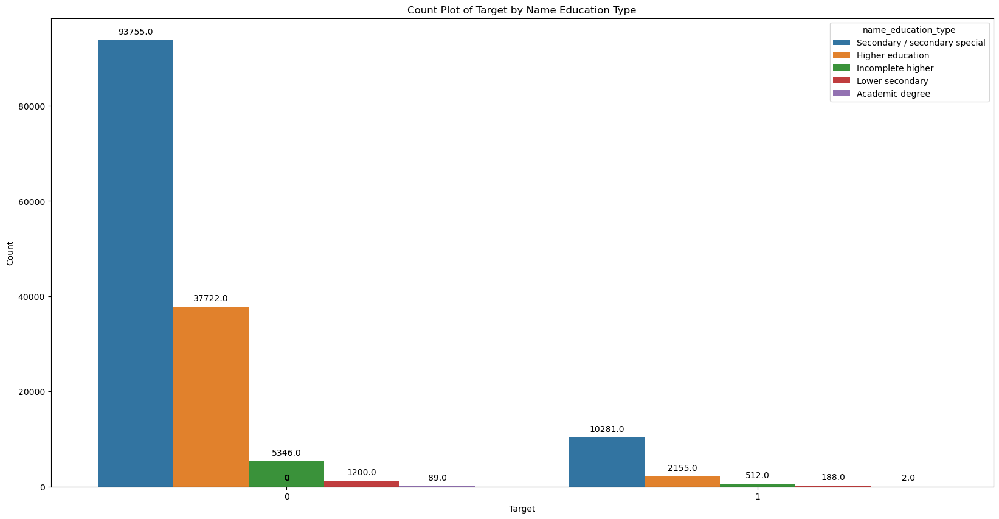

In [517]:
# Set the size of the plot
plt.figure(figsize=(20, 10))

# Create a count plot
ax = sns.countplot(data=df_clean7, x='target', hue='name_education_type')

# Add annotations to each bar
for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add annotation on top of each bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Count Plot of Target by Name Education Type')
plt.xlabel('Target')
plt.ylabel('Count')

# Show the plot
plt.show()

As you can see above, the least default group is the Academic degree holders and we can go ahead and delete that group as we wouldnt require that data as much.

In [519]:
# Define the categories to remove
categories_to_remove1 = ['Academic degree']

# Filter out the rows with the specified categories
df_clean8 = df_clean7[~df_clean6['name_education_type'].isin(categories_to_remove1)]

# Display the value counts after removal
print("\nAfter removal:")
print(df_clean8['name_education_type'].value_counts())


After removal:
name_education_type
Secondary / secondary special    104036
Higher education                  39877
Incomplete higher                  5858
Lower secondary                    1388
Name: count, dtype: int64


C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\2361137787.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_clean8 = df_clean7[~df_clean6['name_education_type'].isin(categories_to_remove1)]


Now that we have deleted the less relevant education group, lets go ahead and create dummy variables for the column name_education_type

In [521]:
# Create dummy variables for 'code_gender' column
df_clean8 = pd.get_dummies(df_clean8, columns=['name_education_type'], prefix='education_type')

# Ensure the dummy variables are of type int32
df_clean8 = df_clean8.astype({'education_type_Secondary / secondary special': 'int32', 'education_type_Higher education': 'int32', 'education_type_Incomplete higher': 'int32', 'education_type_Lower secondary': 'int32'})

# Display the DataFrame with dummy variables
print(df_clean8)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price    name_family_status  name_housing_type  \
0                180000               Married  House / apartment   
1               1719000        Civil marriage  House / apar

In [522]:
# Filter columns with object data types
object_columns = df_clean8.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151159 entries, 0 to 184505
Data columns (total 4 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   name_family_status  151159 non-null  object
 1   name_housing_type   151159 non-null  object
 2   occupation_type     151159 non-null  object
 3   organization_type   151159 non-null  object
dtypes: object(4)
memory usage: 5.8+ MB


In [523]:
df_clean8['name_family_status'].value_counts()

name_family_status
Married                 98135
Single / not married    23465
Civil marriage          15900
Separated                9660
Widow                    3998
Unknown                     1
Name: count, dtype: int64

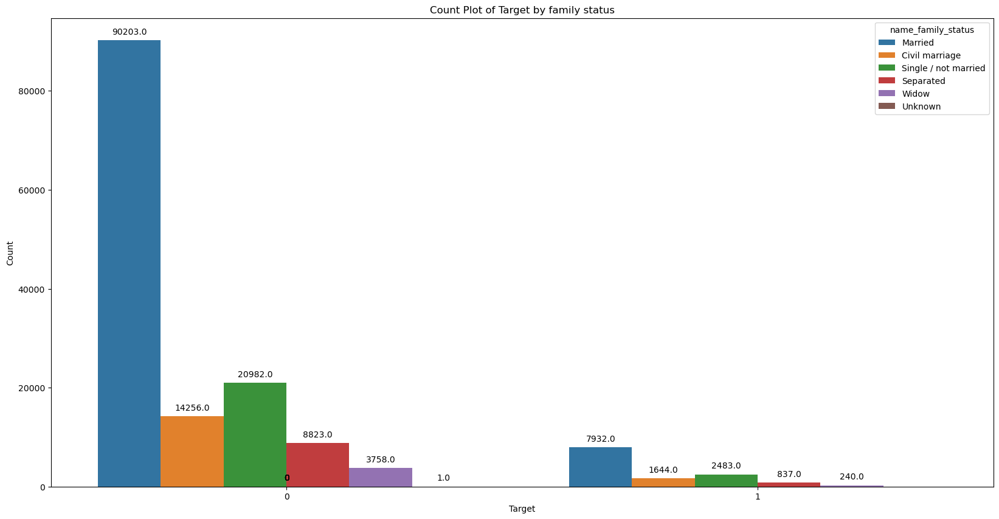

In [524]:
# Set the size of the plot
plt.figure(figsize=(20, 10))

# Create a count plot
ax = sns.countplot(data=df_clean8, x='target', hue='name_family_status')

# Add annotations to each bar
for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add annotation on top of each bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Count Plot of Target by family status')
plt.xlabel('Target')
plt.ylabel('Count')

# Show the plot
plt.show()

In [525]:
# Define the categories to remove
categories_to_remove2 = ['Unknown']

# Filter out the rows with the specified categories
df_clean9 = df_clean8[~df_clean7['name_family_status'].isin(categories_to_remove2)]

# Display the value counts after removal
print("\nAfter removal:")
print(df_clean9['name_family_status'].value_counts())


After removal:
name_family_status
Married                 98135
Single / not married    23465
Civil marriage          15900
Separated                9660
Widow                    3998
Name: count, dtype: int64


C:\Users\luxy2\AppData\Local\Temp\ipykernel_63032\2909702908.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_clean9 = df_clean8[~df_clean7['name_family_status'].isin(categories_to_remove2)]


In [526]:
df_clean9.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 50 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   cnt_children                                  151158 non-null  int32  
 1   amt_income_total                              151158 non-null  int32  
 2   amt_credit                                    151158 non-null  int32  
 3   amt_annuity                                   151158 non-null  int32  
 4   amt_goods_price                               151158 non-null  int32  
 5   name_family_status                            151158 non-null  object 
 6   name_housing_type                             151158 non-null  object 
 7   region_population_relative                    151158 non-null  float64
 8   flag_work_phone                               151158 non-null  int32  
 9   flag_phone                                    151158 

In [527]:
# Create dummy variables for 'name_family_status' column
df_clean9 = pd.get_dummies(df_clean9, columns=['name_family_status'], prefix='')

# Ensure the dummy variables are of type int32
df_clean9 = df_clean9.astype({
    '_Married': 'int32',
    '_Single / not married': 'int32',
    '_Civil marriage': 'int32',
    '_Separated': 'int32',
    '_Widow': 'int32'
})

# Display the DataFrame with dummy variables
print(df_clean9)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price  name_housing_type  region_population_relative  \
0                180000  House / apartment                0.0186340000   
1               1719000  House / apartment     

In [528]:
# Filter columns with object data types
object_columns = df_clean9.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 3 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   name_housing_type  151158 non-null  object
 1   occupation_type    151158 non-null  object
 2   organization_type  151158 non-null  object
dtypes: object(3)
memory usage: 4.6+ MB


In [529]:
df_clean9['name_housing_type'].value_counts()

name_housing_type
House / apartment      132209
With parents             8732
Municipal apartment      5408
Rented apartment         2819
Office apartment         1398
Co-op apartment           592
Name: count, dtype: int64

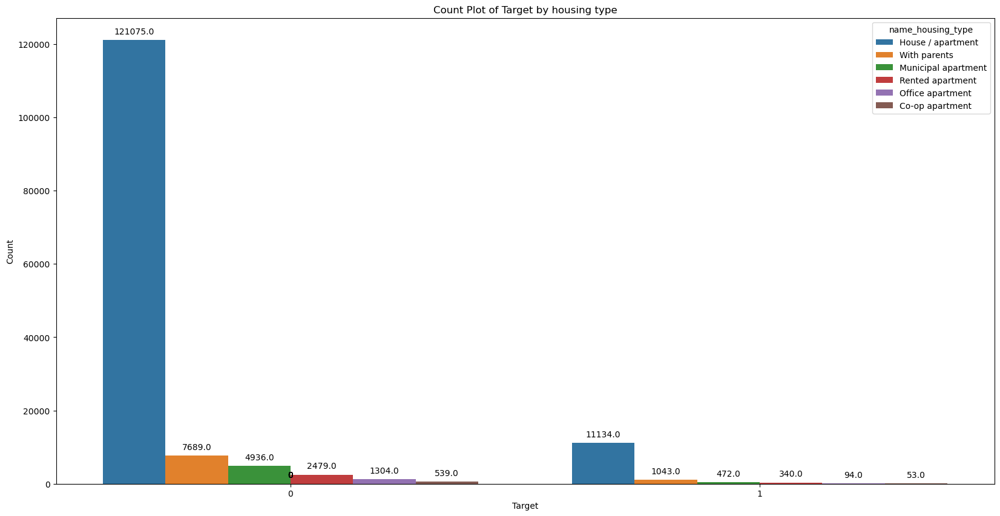

In [530]:
# Set the size of the plot
plt.figure(figsize=(20, 10))

# Create a count plot
ax = sns.countplot(data=df_clean9, x='target', hue='name_housing_type')

# Add annotations to each bar
for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add annotation on top of each bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Count Plot of Target by housing type')
plt.xlabel('Target')
plt.ylabel('Count')

# Show the plot
plt.show()

In [531]:
# Create dummy variables for 'name_family_status' column
df_clean9 = pd.get_dummies(df_clean9, columns=['name_housing_type'], prefix='housing_type')

# Ensure the dummy variables are of type int32
df_clean9 = df_clean9.astype({
    'housing_type_House / apartment': 'int32',
    'housing_type_With parents': 'int32',
    'housing_type_Municipal apartment': 'int32',
    'housing_type_Rented apartment': 'int32',
    'housing_type_Office apartment': 'int32',
    'housing_type_Co-op apartment': 'int32'
})

# Display the DataFrame with dummy variables
print(df_clean9)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price  region_population_relative  flag_work_phone  \
0                180000                0.0186340000                1   
1               1719000                0.0188500000

In [532]:
# Filter columns with object data types
object_columns = df_clean9.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 2 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   occupation_type    151158 non-null  object
 1   organization_type  151158 non-null  object
dtypes: object(2)
memory usage: 3.5+ MB


In [533]:
# To check value counts of Occupation type
df_clean9['occupation_type'].value_counts()

occupation_type
Laborers                 32958
Unknown                  24611
Sales staff              19345
Core staff               16472
Managers                 12748
Drivers                  11234
High skill tech staff     6857
Accountants               5889
Medicine staff            5130
Security staff            4071
Cooking staff             3620
Cleaning staff            2763
Private service staff     1564
Low-skill Laborers        1222
Waiters/barmen staff       819
Secretaries                787
Realty agents              433
HR staff                   321
IT staff                   314
Name: count, dtype: int64

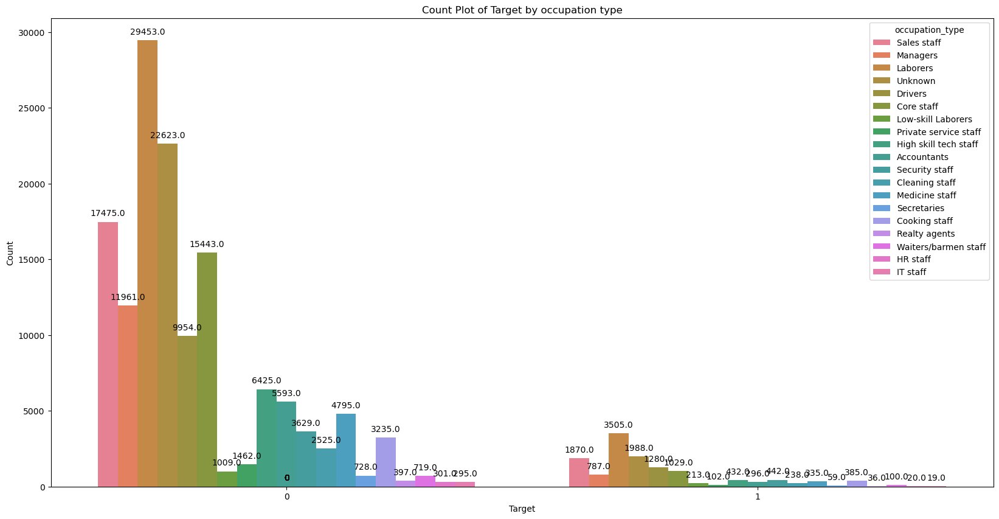

In [534]:
# Set the size of the plot
plt.figure(figsize=(20, 10))

# Create a count plot
ax = sns.countplot(data=df_clean9, x='target', hue='occupation_type')

# Add annotations to each bar
for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add annotation on top of each bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Count Plot of Target by occupation type')
plt.xlabel('Target')
plt.ylabel('Count')

# Show the plot
plt.show()

In [535]:
# Create dummy variables for 'name_family_status' column
df_clean9 = pd.get_dummies(df_clean9, columns=['occupation_type'], prefix='occupation')

# Display the DataFrame with dummy variables
print(df_clean9)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price  region_population_relative  flag_work_phone  \
0                180000                0.0186340000                1   
1               1719000                0.0188500000

Lets go ahead and convert our newly created dummy variables to int32

In [537]:
# List of columns to convert
bool_columns = [
     'occupation_Accountants', 'occupation_Cleaning staff', 'occupation_Cooking staff',
    'occupation_Core staff', 'occupation_Drivers', 'occupation_HR staff',
    'occupation_High skill tech staff', 'occupation_IT staff', 'occupation_Laborers',
    'occupation_Low-skill Laborers', 'occupation_Managers', 'occupation_Medicine staff',
    'occupation_Private service staff', 'occupation_Realty agents', 'occupation_Sales staff',
    'occupation_Secretaries', 'occupation_Security staff', 'occupation_Unknown',
    'occupation_Waiters/barmen staff'
]

# Convert these columns to int32
df_clean9[bool_columns] = df_clean9[bool_columns].astype('int32')

# Verify the conversion
print(df_clean9[bool_columns].dtypes)

occupation_Accountants              int32
occupation_Cleaning staff           int32
occupation_Cooking staff            int32
occupation_Core staff               int32
occupation_Drivers                  int32
occupation_HR staff                 int32
occupation_High skill tech staff    int32
occupation_IT staff                 int32
occupation_Laborers                 int32
occupation_Low-skill Laborers       int32
occupation_Managers                 int32
occupation_Medicine staff           int32
occupation_Private service staff    int32
occupation_Realty agents            int32
occupation_Sales staff              int32
occupation_Secretaries              int32
occupation_Security staff           int32
occupation_Unknown                  int32
occupation_Waiters/barmen staff     int32
dtype: object


In [539]:
# Filter columns with object data types
object_columns = df_clean9.select_dtypes(include=['object'])

# Display information about the DataFrame with only object columns
object_columns.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 1 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   organization_type  151158 non-null  object
dtypes: object(1)
memory usage: 2.3+ MB


In [540]:
# To check the value counts of Organization type
df_clean9['organization_type'].value_counts()

organization_type
Business Entity Type 3    40913
Self-employed             22867
Other                      9953
Medicine                   6750
Business Entity Type 2     6331
Government                 6222
School                     5297
Trade: type 7              4689
Kindergarten               4149
Construction               4075
Business Entity Type 1     3526
Transport: type 4          3226
Trade: type 3              2092
Industry: type 3           2010
Security                   1992
Industry: type 9           1982
Housing                    1785
Industry: type 11          1612
Military                   1545
Bank                       1489
Agriculture                1438
Police                     1403
Transport: type 2          1347
Postal                     1310
Security Ministries        1201
Trade: type 2              1200
Restaurant                 1093
Services                    943
University                  782
Industry: type 7            777
Transport: type 3     

<ins> Combine Similar Named Values <ins>
    
First, lets go ahead and remove "type" and "Type" attached next to industry names and then Combine similar types of organizations can help reduce the number of unique categories and make the data more manageable. 

Business Entity:

Business Entity Type 1, Business Entity Type 2, Business Entity Type 3, Self-employed, Other

Healthcare:

Medicine

Education:

School, University, Kindergarten

Trade:

All variations of Trade

Construction:

Construction

Transport:

All variations of Transport

Security:

Security, Security Ministries

Government/Public Services:

Government, Postal, Police, Military, Emergency, Housing, Legal Services, Religion

Finance:

Bank, Insurance

Technology/Telecommunications:

IT staff, High skill tech staff, Telecom, Mobile

Services:

Cleaning, Services, Advertising, Private service staff, Restaurant, Hotel, Realty agents

Manufacturing/Industry:

All variations of Industry

Agriculture:

Agriculture

Utilities:

Electricity

Culture:

Culture

In [542]:
# Replace variations of "Type" and "type" with numbers and colons
df_clean9['organization_type'] = df_clean9['organization_type'].str.replace(r'\s*:\s*[:Tt]ype\s*\d+', '', regex=True)

# Display the updated value counts
print(df_clean9['organization_type'].value_counts())

organization_type
Business Entity Type 3    40913
Self-employed             22867
Other                      9953
Trade                      8664
Industry                   8530
Medicine                   6750
Business Entity Type 2     6331
Government                 6222
Transport                  5404
School                     5297
Kindergarten               4149
Construction               4075
Business Entity Type 1     3526
Security                   1992
Housing                    1785
Military                   1545
Bank                       1489
Agriculture                1438
Police                     1403
Postal                     1310
Security Ministries        1201
Restaurant                 1093
Services                    943
University                  782
Hotel                       580
Electricity                 559
Insurance                   385
Telecom                     344
Emergency                   329
Advertising                 263
Realtor               

Lets go ahead and combine all the above mentioned columns and categories

In [543]:
# Combine similar types of organizations
df_clean9['organization_type'] = df_clean9['organization_type'].replace({
    'Trade:': 'Trade',
    'Industry:': 'Industry',
    'Transport:': 'Transport',
    'Security': 'Security',
    'Security Ministries' : 'Security',
    'Bank' : 'Finance',
    'Insurance' : 'Finance',
    'Government' : 'Government/Public Services',
    'Postal' : 'Government/Public Services',
    'Police' : 'Government/Public Services', 
    'Military' : 'Government/Public Services',
    'Emergency' : 'Government/Public Services',
    'Medicine': 'Healthcare',
    'Housing': 'Government/Public Services',
    'Legal Services': 'Government/Public Services',
    'Religion': 'Government/Public Services',
    'IT staff': 'Technology/Telecommunications',
    'High skill tech staff': 'Technology/Telecommunications',
    'Telecom': 'Technology/Telecommunications',
    'Mobile': 'Technology/Telecommunications',
    'Cleaning': 'Services',
    'Services': 'Services',
    'Advertising': 'Services',
    'Private service staff': 'Services',
    'Restaurant': 'Services',
    'Hotel': 'Services',
    'Realtor': 'Services',
    'Agriculture': 'Agriculture',
    'Electricity': 'Utilities',
    'Culture': 'Culture',
    'School': 'Education',
    'University': 'Education',
    'Kindergarten': 'Education',
    'Business Entity Type 3': 'Business',
    'Business Entity Type 2': 'Business',
    'Business Entity Type 1': 'Business'
})

# Display the updated value counts
print(df_clean9['organization_type'].value_counts())

organization_type
Business                         50770
Self-employed                    22867
Government/Public Services       12837
Education                        10228
Other                             9953
Trade                             8664
Industry                          8530
Healthcare                        6750
Transport                         5404
Construction                      4075
Services                          3256
Security                          3193
Finance                           1874
Agriculture                       1438
Utilities                          559
Technology/Telecommunications      533
Culture                            227
Name: count, dtype: int64


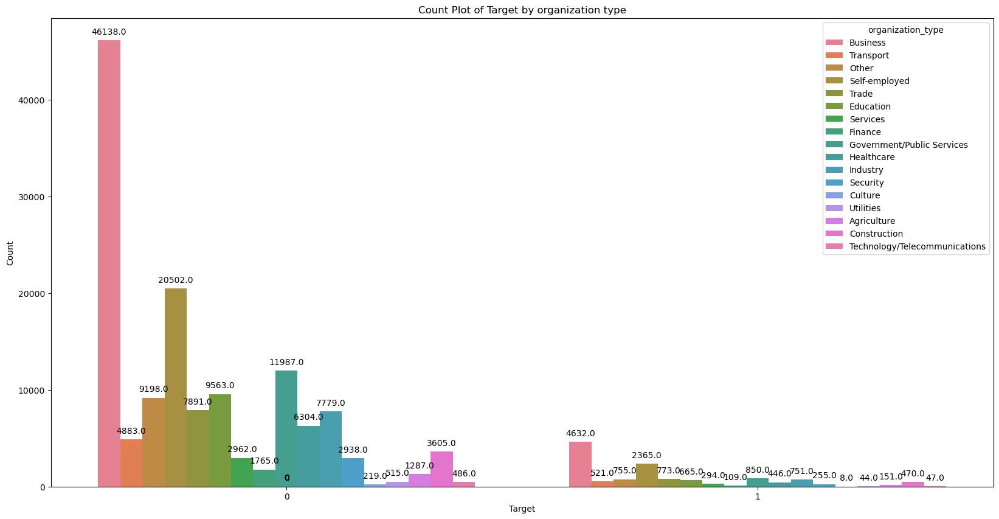

In [544]:
# Set the size of the plot
plt.figure(figsize=(20, 10))

# Create a count plot
ax = sns.countplot(data=df_clean9, x='target', hue='organization_type')

# Add annotations to each bar
for p in ax.patches:
    # Get the height of each bar
    height = p.get_height()
    # Add annotation on top of each bar
    ax.annotate(f'{height}', 
                (p.get_x() + p.get_width() / 2., height), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

# Set plot title and labels
plt.title('Count Plot of Target by organization type')
plt.xlabel('Target')
plt.ylabel('Count')

# Show the plot
plt.show()

<ins> Filter Low Frequency Categories <ins>

Next, lets filter out the low frequency categories and group them under "Other"

In [546]:
# Define a threshold for minimum count
threshold = 1000

# Get value counts of the updated organization_type column
org_type_counts = df_clean9['organization_type'].value_counts()

# Create a mask for the types that should be replaced with "Other"
mask = df_clean9['organization_type'].isin(org_type_counts[org_type_counts < threshold].index)

# Replace low frequency types with "Other"
df_clean9.loc[mask, 'organization_type'] = 'Other'

# Display the updated value counts after grouping
print(df_clean9['organization_type'].value_counts())

organization_type
Business                      50770
Self-employed                 22867
Government/Public Services    12837
Other                         11272
Education                     10228
Trade                          8664
Industry                       8530
Healthcare                     6750
Transport                      5404
Construction                   4075
Services                       3256
Security                       3193
Finance                        1874
Agriculture                    1438
Name: count, dtype: int64


<ins> Create Dummy Variables <ins>
    
Finally, lets create dummy variables for the cleaned and grouped organization_type column

In [548]:
# Create dummy variables for 'name_family_status' column
df_clean9 = pd.get_dummies(df_clean9, columns=['organization_type'], prefix='Industry')

# Display the DataFrame with dummy variables
print(df_clean9)

        cnt_children  amt_income_total  amt_credit  amt_annuity  \
0                  1             67500      227520        11065   
1                  1            247500     1882372        65560   
2                  1            180000      101880        10827   
3                  0             81000      405000        20677   
4                  0            157500      888840        29506   
...              ...               ...         ...          ...   
184498             1            112500      640080        29970   
184499             0             90000      592560        30253   
184501             1            135000      143910        15498   
184503             0            135000      900000        45954   
184505             0             81000      167895        17757   

        amt_goods_price  region_population_relative  flag_work_phone  \
0                180000                0.0186340000                1   
1               1719000                0.0188500000

Lets go ahead and convert our newly created dummy variables to int32

In [549]:
# List of columns to convert to int32
columns_to_convert = [
    'Industry_Agriculture', 'Industry_Business', 'Industry_Construction',
    'Industry_Education', 'Industry_Finance', 'Industry_Government/Public Services',
    'Industry_Healthcare', 'Industry_Industry', 'Industry_Other',
    'Industry_Security', 'Industry_Self-employed', 'Industry_Services',
    'Industry_Trade', 'Industry_Transport'
]

# Convert the specified columns to int32
df_clean9[columns_to_convert] = df_clean9[columns_to_convert].astype('int32')

# Display the updated DataFrame info to verify the changes
print(df_clean9.info())

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 90 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   cnt_children                                  151158 non-null  int32  
 1   amt_income_total                              151158 non-null  int32  
 2   amt_credit                                    151158 non-null  int32  
 3   amt_annuity                                   151158 non-null  int32  
 4   amt_goods_price                               151158 non-null  int32  
 5   region_population_relative                    151158 non-null  float64
 6   flag_work_phone                               151158 non-null  int32  
 7   flag_phone                                    151158 non-null  int32  
 8   flag_email                                    151158 non-null  int32  
 9   region_rating_client                          151158 


We could possibly try to reduce the number of columns such as occupation_Unknown, Industry_Other, accompanied_with_Other_B, accompanied_with_Group of people and accompanied_with_Other_A as we dont particularly have any concrete information about the unkown and other groups. 

Lets go ahead and drop these columns 

In [551]:
# List of column names to drop
columns_to_drop8 = ['occupation_Unknown','Industry_Other', 'accompanied_with_Other_B', 'accompanied_with_Other_A', 'accompanied_with_Group of people']

# Drop the specified columns from the DataFrame
df_clean10 = df_clean9.drop(columns=columns_to_drop8)

In [552]:
df_clean10.shape

(151158, 85)

Currently we have 151158 rows and 85 columns

####  Addressing Multicollinearity

Addressing multicollinearity involves identifying and mitigating issues where predictor variables in a model are highly correlated with each other. This can lead to unstable estimates and reduced interpretability. Variance Inflation Factor (VIF) is a common method used to detect multicollinearity; it measures how much the variance of a regression coefficient is inflated due to collinearity with other predictors. By calculating VIF for each variable, you can identify which ones contribute most to multicollinearity and consider removing or combining them to improve model stability and performance.

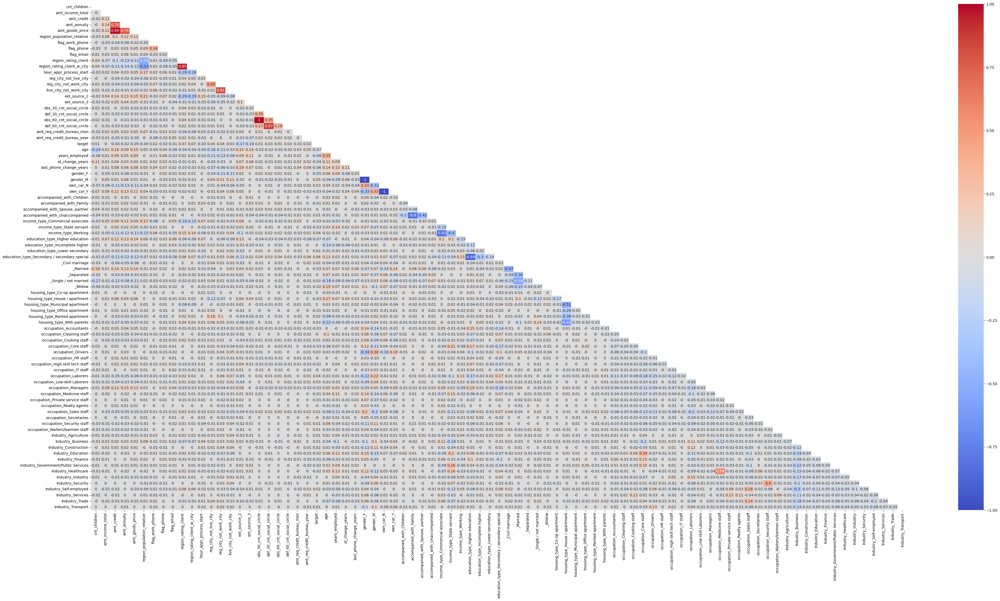

In [554]:
# Select numerical columns
data_num_columns = df_clean10.select_dtypes(include='number').columns.tolist()
mask = np.triu(df_clean10[data_num_columns].corr())
# Generate a heatmap of the correlation matrix
plt.figure(figsize=(50,25))
sns.heatmap(df_clean10[data_num_columns].corr().round(2), annot=True, vmax=1, vmin=-1, cmap='coolwarm', mask=mask, center=0)
plt.show()

In [555]:
# Compute the correlation matrix
corr_matrix = df_clean10.corr()

# Define a threshold for near-perfect correlations
threshold = 0.95

# Create a mask for correlations very close to 1 or -1
mask = (corr_matrix >= threshold) | (corr_matrix <= -threshold)
mask = mask & ~np.eye(mask.shape[0], dtype=bool)  # Exclude diagonal (self-correlation)

# Apply the mask to get the perfect correlations
perfect_corrs = corr_matrix[mask]

# Reshape the data to get it into a readable format
perfect_corrs = perfect_corrs.stack().reset_index()
perfect_corrs.columns = ['Variable 1', 'Variable 2', 'Correlation Coefficient']

# Remove duplicated pairs by sorting the variable names and dropping duplicates
perfect_corrs['sorted_vars'] = perfect_corrs.apply(lambda row: tuple(sorted([row['Variable 1'], row['Variable 2']])), axis=1)
perfect_corrs = perfect_corrs.drop_duplicates(subset='sorted_vars').drop(columns='sorted_vars')

# Print the results
print("Perfect correlations (excluding self-correlation):")
print(perfect_corrs)


Perfect correlations (excluding self-correlation):
                 Variable 1                   Variable 2  \
0                amt_credit              amt_goods_price   
2      region_rating_client  region_rating_client_w_city   
4  obs_30_cnt_social_circle     obs_60_cnt_social_circle   
6                  gender_F                     gender_M   
8                 own_car_N                    own_car_Y   

   Correlation Coefficient  
0             0.9854261463  
2             0.9513865372  
4             0.9985590356  
6            -1.0000000000  
8            -1.0000000000  



The output shows pairs of variables that have a perfect correlation (either +1 or -1) with each other, excluding self-correlations. Here's a breakdown of each pair:

1. amt_credit and amt_goods_price

Correlation Coefficient: 0.985

Explanation: This high positive correlation (close to 1) indicates that amt_credit and amt_goods_price are almost perfectly linearly related. As one variable increases, the other one also increases proportionally. Such high correlations can suggest that one variable might be a function of the other or that they capture similar underlying trends.

2. region_rating_client and region_rating_client_w_city

Correlation Coefficient: 0.951

Explanation: This high positive correlation indicates that these two variables are strongly related. They likely represent similar information with slight differences. For example, region_rating_client could be a general rating, while region_rating_client_w_city could be a more specific rating including city details.

3. obs_30_cnt_social_circle and obs_60_cnt_social_circle

Correlation Coefficient: 0.999

Explanation: This nearly perfect positive correlation suggests that these variables are almost identical in their values, differing only slightly. This might indicate that one variable is a lagged version or a cumulative measure of the other.

4. gender_F and gender_M

Correlation Coefficient: -1.0

Explanation: A perfect negative correlation means that these two variables are inversely related. In the context of gender encoding, if gender_F is 1 (female) then gender_M must be 0 (male), and vice versa. This is expected if these are binary indicator variables.

5. own_car_N and own_car_Y

Correlation Coefficient: -1.0

Explanation: This perfect negative correlation indicates that these two variables are inversely related. If own_car_N (no car) is 1, then own_car_Y (has car) must be 0, and vice versa. This is also expected for binary indicator variables.

Summary:

High Positive Correlations: Pairs like amt_credit and amt_goods_price or obs_30_cnt_social_circle and obs_60_cnt_social_circle show that these variables are closely related, potentially representing similar information.
Perfect Negative Correlations: Binary variables like gender_F and gender_M, or own_car_N and own_car_Y, should naturally exhibit perfect negative correlations due to their binary nature.

Implications for Analysis:

Multicollinearity: High correlations (close to 1 or -1) can indicate multicollinearity, where variables provide overlapping information. This can affect regression models by making them less stable and harder to interpret.

Feature Selection: I might consider removing one of the highly correlated pairs to reduce redundancy and improve model performance. I will combine gender and own car values into respective columns to avoid multicollinearity.

Binary Variables: Perfect correlations in binary variables are expected, but they highlight how binary encoding can be redundant.

Overall, understanding these correlations helps in feature engineering and selection, ensuring that our models are both efficient and effective.

Lests go ahead and replace 'gender_f' and 'gender_M' into one column 'gender'. Similarly will do the same with 'own_car_Y' and 'own_car_N)

In [557]:
# Replace 'gender_F' and 'gender_M' with a single 'gender' column
df_clean10['gender'] = df_clean10['gender_F'] * 1 + df_clean9['gender_M'] * 0
df_clean10 = df_clean10.drop(columns=['gender_F', 'gender_M'])

# Replace 'own_car_Y' and 'own_car_N' with a single 'own_car' column
df_clean10['own_car'] = df_clean10['own_car_Y'] * 1 + df_clean9['own_car_N'] * 0
df_clean10 = df_clean10.drop(columns=['own_car_Y', 'own_car_N'])

# Display the updated DataFrame
print(df_clean10.head())

   cnt_children  amt_income_total  amt_credit  amt_annuity  amt_goods_price  \
0             1             67500      227520        11065           180000   
1             1            247500     1882372        65560          1719000   
2             1            180000      101880        10827            90000   
3             0             81000      405000        20677           405000   
4             0            157500      888840        29506           675000   

   region_population_relative  flag_work_phone  flag_phone  flag_email  \
0                0.0186340000                1           0           0   
1                0.0188500000                0           0           1   
2                0.0226250000                1           0           0   
3                0.0357920000                1           1           0   
4                0.0188010000                0           0           0   

   region_rating_client  ...  Industry_Government/Public Services  \
0          

Similarly let me drop obs_30_cnt_social_circle as its nearly perfectly correlated with its pair obs_60_cnt_social_circle

In [560]:
# List of column names to drop
columns_to_drop9 = ['amt_goods_price',
    'obs_30_cnt_social_circle', 'region_rating_client_w_city', 'obs_60_cnt_social_circle'
    ]

# Drop the specified columns from the DataFrame
df_clean11 = df_clean10.drop(columns=columns_to_drop9)

Lets look at our heat map for the last time to check if the deletion of the above columns created any huge correlation issues.

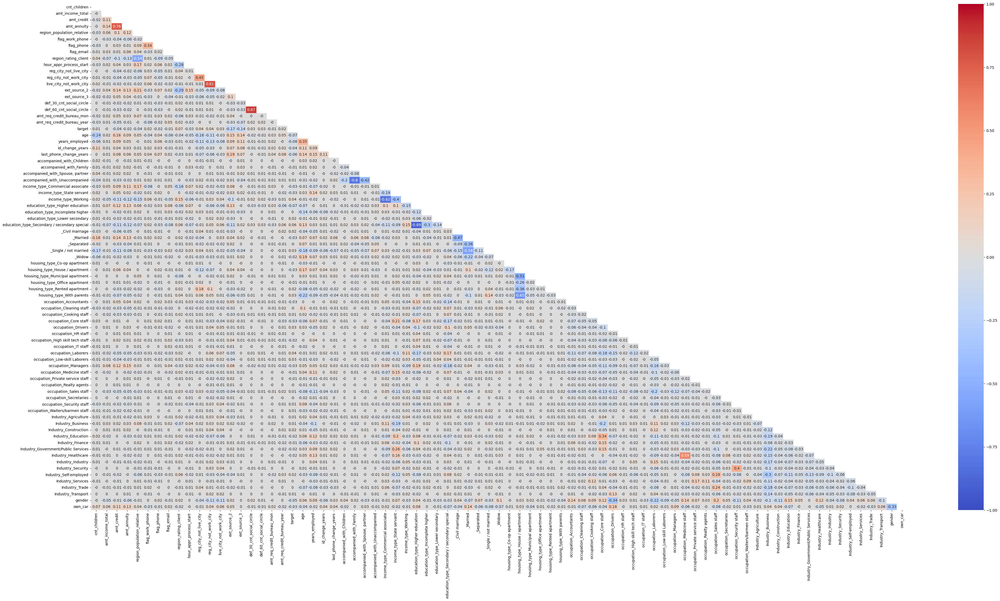

In [561]:
# Select numerical columns
data_num_columns = df_clean11.select_dtypes(include='number').columns.tolist()
mask = np.triu(df_clean11[data_num_columns].corr())
# Generate a heatmap of the correlation matrix
plt.figure(figsize=(50,25))
sns.heatmap(df_clean11[data_num_columns].corr().round(2), annot=True, vmax=1, vmin=-1, cmap='coolwarm', mask=mask, center=0)
plt.show()

As you can see above there are some variables who are positively and negatively correlated with one another. Just for the purpose of this project, I am not looking at deleteing further variables unless it causes severe multicollinearity issues inorder to keep the integrity of the data and not loose much valuable info. 

Lets now look at the VIF score 

#### Variance Inflation Factor (VIF) 

Variance Inflation Factor (VIF) is a measure used to detect multicollinearity in a dataset, particularly in regression models. Multicollinearity occurs when independent variables in a regression model are highly correlated, which can make the model's estimates unstable and difficult to interpret. Here's a breakdown of VIF:

What is VIF?
Definition: VIF quantifies how much the variance of a regression coefficient is inflated due to multicollinearity with other independent variables in the model.
Formula: For a given variable 𝑋, the VIF is calculated as: $$
\text{VIF}_i = \frac{1}{1-R_i^2}
$$ where ${R_i^2}$ is the R-squared value obtained by regressing the $\text{VIF}_i$ on all other independent variables.


How to Interpret VIF Values

VIF = 1: No correlation between the 𝑖 - th variable and the other variables. There is no multicollinearity.

1 < VIF < 5: Moderate correlation. This level of correlation is usually acceptable, but you might want to investigate further if VIF values are consistently high.

VIF ≥ 5: High correlation. This suggests a problematic amount of multicollinearity, indicating that the variable is highly correlated with other variables. Some analysts use a threshold of 10 instead of 5 to identify severe multicollinearity.

VIF ≥ 10: Very high correlation. This indicates a serious multicollinearity issue, and the variable might need to be removed or transformed.

Lets check the VIF scores of our data

In [565]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [566]:
# To define constant X and y
X = df_clean11.drop('target', axis=1)
y = df_clean11['target'].copy()

In [567]:
# To add a constant column to X
X_withconst = sm.add_constant(X)

In [568]:
X_withconst.info()

<class 'pandas.core.frame.DataFrame'>
Index: 151158 entries, 0 to 184505
Data columns (total 79 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   const                                         151158 non-null  float64
 1   cnt_children                                  151158 non-null  int32  
 2   amt_income_total                              151158 non-null  int32  
 3   amt_credit                                    151158 non-null  int32  
 4   amt_annuity                                   151158 non-null  int32  
 5   region_population_relative                    151158 non-null  float64
 6   flag_work_phone                               151158 non-null  int32  
 7   flag_phone                                    151158 non-null  int32  
 8   flag_email                                    151158 non-null  int32  
 9   region_rating_client                          151158 

In [569]:
# this is the VIF for column 1
variance_inflation_factor(X_withconst.values.astype(float), 1)

1.1651238151035348

In [570]:
pd.set_option('display.max_rows', None)  # Show all rows

# let's look at VIF for all columns
pd.Series([variance_inflation_factor(X_withconst.values.astype(float), i) 
           for i in range(X_withconst.shape[1])],
          index=X_withconst.columns)[1:]

C:\Users\luxy2\anaconda3\envs\ensemble\lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


cnt_children                                    1.1651238151
amt_income_total                                1.0338544196
amt_credit                                      2.4783392550
amt_annuity                                     2.4916853145
region_population_relative                      1.4446543979
flag_work_phone                                 1.1694061497
flag_phone                                      1.1671604412
flag_email                                      1.0286059133
region_rating_client                            1.5836039114
hour_appr_process_start                         1.1131506507
reg_city_not_live_city                          2.3951871721
reg_city_not_work_city                          7.0897981435
live_city_not_work_city                         5.6665337856
ext_source_2                                    1.2142390022
ext_source_3                                    1.0520430696
def_30_cnt_social_circle                        4.0208715082
def_60_cnt_social_circle

The inf (infinity) values in the Variance Inflation Factor (VIF) results indicate that there is perfect multicollinearity for those columns. In other words, these variables are perfectly correlated with one or more other variables in your dataset, leading to a situation where $R^2$ is 1

This causes the VIF calculation to produce infinite values because the formula involves division by 1 - $R^2$


Reasons for inf Values
Perfect Multicollinearity: The variable is a linear combination of other variables. For example, if one variable is a perfect combination of other dummy variables or features, it will cause inf VIF values.

Dummy Variable Trap: If you have dummy variables for a categorical feature, you may need to drop one category to avoid perfect multicollinearity. For example, if you have a dummy variable for every category, including all categories will result in perfect multicollinearity.

Redundant Variables: Having multiple features that represent the same underlying information or data can lead to perfect multicollinearity.

How to Address inf Values
Identify Redundancies:

Check if you have included all dummy variables for a categorical feature without omitting one.
Review the features to ensure that they are not redundant.
Drop Perfectly Multicollinear Variables:

Drop the columns that have inf VIF values. Since they are perfectly correlated with other features, removing them will not impact your model's ability to capture information but will help in stabilizing your model.
Reevaluate Feature Engineering:

Ensure that the feature engineering process avoids creating redundant or perfectly correlated features.

I am looking to delete only one or two columns from each dummy variable categorical feature and see if the VIF score has changed overall. 

The Columns I am looking to delete are 
income_type_State servant', 'education_type_Lower secondary', '_Widow', 'housing_type_Office apartment', 'housing_type_Co-op apartment'

In [572]:
# List of column names to drop
columns_to_drop10 = ['income_type_State servant', 'education_type_Lower secondary', '_Widow', 'housing_type_Office apartment', 'housing_type_Co-op apartment']

# Drop the specified columns from the DataFrame
df_clean12 = df_clean11.drop(columns=columns_to_drop10)

Lets check VIF score again after deleting the columns

In [573]:
# To define constant X and y
X = df_clean12.drop('target', axis=1)
y = df_clean12['target'].copy()

In [574]:
# To add a constant column to X
X_withconst = sm.add_constant(X)

In [575]:
# this is the VIF for column 1
variance_inflation_factor(X_withconst.values.astype(float), 1)

1.1651181524660912

In [576]:
# let's look at VIF for all columns
pd.Series([variance_inflation_factor(X_withconst.values.astype(float), i) 
           for i in range(X_withconst.shape[1])],
          index=X_withconst.columns)[1:]

cnt_children                                    1.1651181525
amt_income_total                                1.0338395213
amt_credit                                      2.4783240778
amt_annuity                                     2.4916774044
region_population_relative                      1.4445661362
flag_work_phone                                 1.1692871970
flag_phone                                      1.1670389725
flag_email                                      1.0286018293
region_rating_client                            1.5836006048
hour_appr_process_start                         1.1131086658
reg_city_not_live_city                          2.3951456793
reg_city_not_work_city                          7.0897942494
live_city_not_work_city                         5.6665296860
ext_source_2                                    1.2142146420
ext_source_3                                    1.0520309040
def_30_cnt_social_circle                        4.0208645263
def_60_cnt_social_circle

Lets go ahead and delete all the inf VIF columns

AS we can see above, we have a few columns with VIF>10 we should drop those columns. We need to recalculate VIF for the remainder columns again because VIF values will change for all independent variables after we drop any of them.

Lets identify specific columns above 10 VIF score

In [578]:
# List of column names to drop
columns_to_drop11 = ['accompanied_with_Children', 
                    'accompanied_with_Family','education_type_Incomplete higher' 
                    ]

# Drop the specified columns from the DataFrame
df_final = df_clean12.drop(columns=columns_to_drop11)

Lets check VIF score again after deleting the columns

In [579]:
# To define constant X and y
X = df_final.drop('target', axis=1)
y = df_final['target'].copy()

In [580]:
# To add a constant column to X
X_withconst = sm.add_constant(X)

In [581]:
# this is the VIF for column 1
variance_inflation_factor(X_withconst.values.astype(float), 1)

1.1635189760362414

This score is good. Anything below 5 is a good score. Now lets look at VIF scores over 10

In [583]:
# Calculate VIF for all columns
vif_data = pd.Series(
    [variance_inflation_factor(X_withconst.values.astype(float), i) 
     for i in range(X_withconst.shape[1])],
    index=X_withconst.columns
)

# Identify columns with VIF greater than 10
high_vif_columns = vif_data[vif_data > 10]

# Display columns with high VIF scores
print(high_vif_columns)

const   278.4011923011
dtype: float64


A high VIF value for the constant (intercept) term in my model is expected and generally not a cause for concern. Here’s why:

Understanding VIF for the Constant Term
Interpreting VIF for Constants: The VIF value for the constant term reflects how much the intercept is collinear with other predictors in the model. Since the constant term is inherently constant and non-varying, it can sometimes show a very high VIF value, which does not have the same implications as high VIF values for predictors.
Focus on Predictors: The primary concern with VIF values should be with the predictors (independent variables) rather than the constant term. High VIF values for predictors indicate multicollinearity among them, which can inflate the variance of coefficient estimates and make the model unstable.

In [587]:
# To check the shape of the dataframe
df_final.shape

(151158, 71)

Our final clean data now consists of 151158 rows and 71 columns

_________________________________________________________________________________________________________________________________________________________________

### Train and Test Split

When developing a machine learning model, it's crucial to evaluate its performance on data it hasn't seen during training. This ensures that the model generalizes well to new, unseen data. One of the fundamental techniques to achieve this is splitting the dataset into training and testing sets.

Why Split the Data?

Model Training:

The training set is used to train the model. During this phase, the model learns the patterns, relationships, and structures within the data.
If you use all the available data for training, there won't be any data left to objectively evaluate the model's performance.

Model Evaluation:

The testing set is used to evaluate the trained model. It provides an unbiased assessment of the model's performance on new data.
This evaluation helps identify issues like overfitting (where the model performs well on training data but poorly on new data) and underfitting (where the model performs poorly on both training and testing data).

Benefits of Train-Test Split

Avoid Overfitting:

By keeping a separate testing set, you ensure the model doesn't just memorize the training data but learns to generalize to new data.

Performance Estimation:

The testing set provides a realistic estimate of the model's performance on unseen data. This helps in comparing different models and selecting the best one.

Model Tuning:

By using the training set for model building and the testing set for evaluation, we can fine-tune hyperparameters and improve model performance.

Lets go ahead and split the data into 80/20 split.

In [589]:
# Drop 'target' from X
X = df_final.drop(columns=['target'])

# Target variable
y = df_final['target']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Now we have successfully split our data to test and train

In [590]:
# size of training data
X_train.shape

(120926, 70)

In [591]:
# size of training data
X_test.shape

(30232, 70)

In [592]:
# size of training data
y_train.shape

(120926,)

In [593]:
# size of training data
y_test.shape

(30232,)

#### Normalizing the Data

Let's normalize the data X_train and X_test. Since we don't want data leakge from the test set, we only fit on the X_train data.

In [594]:
from sklearn.preprocessing import StandardScaler

In [595]:
# 3. Scale data
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Lets now convert the resampled training and original test data arrays into DataFrames, including the feature columns and target variable.

In [596]:
# Convert the resampled training data (X_train_resampled and y_train_resampled) into a DataFrame
train_df = pd.DataFrame(np.column_stack((X_train, y_train)), columns=df_final.drop('target', axis=1).columns.tolist() + ['target'])

# Convert the test data (X_test and y_test) into a DataFrame
test_df = pd.DataFrame(np.column_stack((X_test, y_test)), columns=df_final.drop('target', axis=1).columns.tolist() + ['target'])

#### Train Data

Now that we have split our data to test and train lets check the first 5 rows of the newly formed dataset

In [598]:
# Display the final train dataset
train_df.head()

,cnt_children,amt_income_total,amt_credit,amt_annuity,region_population_relative,flag_work_phone,flag_phone,flag_email,region_rating_client,hour_appr_process_start,...,Industry_Healthcare,Industry_Industry,Industry_Security,Industry_Self-employed,Industry_Services,Industry_Trade,Industry_Transport,gender,own_car,target
0,-0.6546486610,-0.1649674402,-0.7456784381,-1.1335463277,-0.8124391397,-0.5664445354,-0.6194891731,-0.2599277547,-0.0877261269,-0.6681218971,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,0.7790545358,-0.7759877244,0.0000000000
1,-0.6546486610,-0.3761114581,-0.8096168167,-0.8420372997,-1.4045028194,-0.5664445354,1.6142332156,-0.2599277547,-0.0877261269,0.2419312898,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,1.2886801795,0.0000000000
2,1.9773097132,-0.3761114581,0.7265027304,0.5628913492,0.5596232024,-0.5664445354,-0.6194891731,3.8472228610,-0.0877261269,-0.0614197725,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,0.7790545358,1.2886801795,0.0000000000
3,-0.6546486610,-0.3761114581,0.9977524215,0.6013628876,-0.7853338257,-0.5664445354,-0.6194891731,-0.2599277547,-0.0877261269,1.1519844767,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,0.7790545358,-0.7759877244,0.0000000000
4,-0.6546486610,0.4684646135,-0.6498596734,0.6702426579,0.8406245689,-0.5664445354,-0.6194891731,-0.2599277547,-2.0435464853,-0.3647708348,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,-0.7759877244,0.0000000000


Lets check the shape of our Train Data

In [599]:
# Display the shape of the training data
train_df.shape

(120926, 71)

We currently have 120926 rows and 71 columns in our Train Data

Lets check for missing values in our train data

In [600]:
# Check for missing values in the dataframe
train_df.isna().sum()

cnt_children                                    0
amt_income_total                                0
amt_credit                                      0
amt_annuity                                     0
region_population_relative                      0
flag_work_phone                                 0
flag_phone                                      0
flag_email                                      0
region_rating_client                            0
hour_appr_process_start                         0
reg_city_not_live_city                          0
reg_city_not_work_city                          0
live_city_not_work_city                         0
ext_source_2                                    0
ext_source_3                                    0
def_30_cnt_social_circle                        0
def_60_cnt_social_circle                        0
amt_req_credit_bureau_mon                       0
amt_req_credit_bureau_year                      0
age                                             0


There are no missing values in our train data

#### Test Data

Now that we have split our data to test and train lets check the first 5 rows of the newly formed dataset

In [602]:
# Display the final test dataset
test_df.head()

,cnt_children,amt_income_total,amt_credit,amt_annuity,region_population_relative,flag_work_phone,flag_phone,flag_email,region_rating_client,hour_appr_process_start,...,Industry_Healthcare,Industry_Industry,Industry_Security,Industry_Self-employed,Industry_Services,Industry_Trade,Industry_Transport,gender,own_car,target
0,-0.6546486610,-0.5872554760,-0.7694777235,-0.8964987847,1.8252827695,-0.5664445354,-0.6194891731,-0.2599277547,-2.0435464853,1.1519844767,...,-0.2159700598,4.0805457833,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,1.2886801795,1.0000000000
1,0.6613305261,-0.1649674402,-0.3661331181,0.2227974832,3.7203479115,-0.5664445354,1.6142332156,-0.2599277547,-2.0435464853,-0.3647708348,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,1.2886801795,0.0000000000
2,0.6613305261,0.0461765777,-0.8531526364,-0.7977574473,0.7518114126,1.7653979119,-0.6194891731,-0.2599277547,-0.0877261269,0.2419312898,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,1.2886801795,0.0000000000
3,-0.6546486610,0.0461765777,-0.3433994724,1.1726959825,-1.0005903882,1.7653979119,1.6142332156,-0.2599277547,-0.0877261269,-0.0614197725,...,-0.2159700598,4.0805457833,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,-1.2836071855,1.2886801795,0.0000000000
4,0.6613305261,-0.3761114581,1.3771645365,0.4359284392,-0.1939910321,1.7653979119,1.6142332156,-0.2599277547,1.8680942314,1.7586866013,...,-0.2159700598,-0.2450652567,-0.1482335748,-0.4214196060,-0.1494236578,-0.2469367322,-0.1925474430,0.7790545358,-0.7759877244,0.0000000000


Lets check the shape of our test data now

In [603]:
# Display the shape of the testing data
test_df.shape

(30232, 71)

The shape of our test data is 30232 rows and 71 columns

Lets check for missing values in our test data

In [604]:
# Check for missing values in the dataframe
test_df.isna().sum()

cnt_children                                    0
amt_income_total                                0
amt_credit                                      0
amt_annuity                                     0
region_population_relative                      0
flag_work_phone                                 0
flag_phone                                      0
flag_email                                      0
region_rating_client                            0
hour_appr_process_start                         0
reg_city_not_live_city                          0
reg_city_not_work_city                          0
live_city_not_work_city                         0
ext_source_2                                    0
ext_source_3                                    0
def_30_cnt_social_circle                        0
def_60_cnt_social_circle                        0
amt_req_credit_bureau_mon                       0
amt_req_credit_bureau_year                      0
age                                             0


There are no null values in our test data

In [1204]:
# To install fastparquet
!pip install fastparquet

  Obtaining dependency information for fastparquet from https://files.pythonhosted.org/packages/6f/72/8047d08e8717e8b201dc87059776ddcaf15863d7a8c4eb5adf43e87ee00a/fastparquet-2024.5.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for cramjam>=2.3 from https://files.pythonhosted.org/packages/08/32/1f90bee4b86d1b92fb76c26f11db07b5bce7db842fb1cc912ed7f045b696/cramjam-2.8.3-cp311-none-win_amd64.whl.metadata
   ---------------------------------------- 0.0/672.0 kB ? eta -:--:--
    --------------------------------------- 10.2/672.0 kB ? eta -:--:--
   -- ------------------------------------ 41.0/672.0 kB 653.6 kB/s eta 0:00:01
   ---------- ----------------------------- 174.1/672.0 kB 1.5 MB/s eta 0:00:01
   ------------------------ --------------- 409.6/672.0 kB 2.6 MB/s eta 0:00:01
   ---------------------------------------- 672.0/672.0 kB 3.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
   ------------ ---------------------

Lets save our Train and Test Datasets

In [606]:
# Save the final train and test datasets to Parquet format
train_df.to_parquet('train_dataset.parquet', index=False)
test_df.to_parquet('test_dataset.parquet', index=False)

In [607]:
pd.reset_option('display.max_rows', None)  # Show all rows

# Part 5 - <ins> Baseline Modeling <ins>

#### Split into Training and Validation Datasets

This process involves dividing the dataset into two subsets, where the training set is used to build the model and the validation set is used to assess the model's performance and generalization capabilities.

In [610]:
# Separate features and target variable from the training dataset
X_train_full = train_df.drop(columns=['target'])
y_train_full = train_df['target']

# Split the training dataset into training and validation subsets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.3, random_state=42)

# Separate features and target variable from the test dataset
X_test = test_df.drop(columns=['target'])
y_test = test_df['target']

# Check the shapes of the datasets
X_train.shape, X_val.shape, X_test.shape

((84648, 70), (36278, 70), (30232, 70))

Now that i have split my Train and Test Data into Train, Validation and Test Datasets. This will be used in fitting my models further. 

_________________________________________________________________________________________________________________________________________________________________

### Fit Baseline Models

Introduction to Baseline Models

Logistic Regression:

Description: A linear model used for binary classification that estimates the probability of a binary outcome based on one or more predictor variables. <br>
Testing: Evaluated on both the original and SMOTE-augmented training data to understand its effectiveness in handling class imbalance. <br>

Decision Tree:

Description: A non-linear model that splits the data into subsets based on the value of input features, forming a tree-like structure. It’s easy to interpret and visualize.<br>
Testing: Assessed on the original and SMOTE-augmented training data to compare its performance with and without resampling.<br>

Random Forest:

Description: An ensemble method that constructs multiple decision trees during training and outputs the mode of the classes (classification) or mean prediction (regression) of the individual trees. <br>
Testing: Evaluated on both the original and SMOTE-augmented training data to determine its robustness to class imbalance. <br>

XGBoost:

Description: An advanced gradient boosting algorithm that builds models in an iterative fashion to improve performance by combining the predictions of several base models. <br>
Testing: Tested on both the original and SMOTE-augmented training data to gauge its handling of imbalanced classes. <br>

Gradient Boosting:

Description: An ensemble technique that builds models sequentially, each new model correcting errors made by the previous models. It’s powerful for capturing complex patterns. <br>
Testing: Analyzed on both the original and SMOTE-augmented training data to evaluate its effectiveness in improving prediction accuracy for the minority class.

Support Vector Machine (SVM):

Description: A classification technique that finds the hyperplane that best separates the data into classes by maximizing the margin between them.<br>
Testing: Evaluated on both the original and SMOTE-augmented training data to understand its performance in handling imbalanced datasets.<br>

These models will be tested on both the original and SMOTE-augmented training data to compare their effectiveness in handling class imbalance and to determine the most suitable model for the dataset.


In [612]:
#creating metric function 
def metrics_score(actual, predicted):
    print(classification_report(actual, predicted))
    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(8,5))
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels=['Not Default', 'Default'], yticklabels=['Not Default', 'Default'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

In [613]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score, roc_curve, auc
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

_________________________________________________________________________________________________________________________________________________________________

#### Apply SMOTE (Synthetic Minority Over-sampling Technique) to the Training Set (dealing with imbalanced classes)

We will be using SMOTE (Synthetic Minority Over-sampling Technique) to handle class imbalance in our training data, it's important to consider how and when to evaluate our model's performance. 

Evaluating Model Performance

#### Initial Model Evaluation (Before SMOTE)

Objective: To understand the baseline performance of my model on the original imbalanced training data.

Steps:

* Train my model on the original training data.<br>
* Evaluate the model's performance on a validation set. <br>
* This helps us to understand how our model handles the class imbalance without any intervention.

#### SMOTE and Model Evaluation

Objective: To see the impact of SMOTE on our model's ability to learn from balanced data.

Steps:

* Apply SMOTE to our training data. <br>
* Train our model on the SMOTE-balanced training data.<br>
* Evaluate the model's performance on the same validation set. <br>
* Compare the results with the baseline to see if there's an improvement in handling the minority class. <br>

Final Model Evaluation (On Test Data)

Objective: To assess the final performance of our model on unseen data.

Steps:

* Once we've decided on the best model (after comparing the baseline and SMOTE-trained models), train it on the SMOTE-balanced training data.
* Evaluate the model's performance on the test data. This test data should not have been used during any part of the training process, including SMOTE application.
* Report metrics such as accuracy, precision, recall, F1-score, and confusion matrix.

In [615]:
pip install imbalanced-learn

Note: you may need to restart the kernel to use updated packages.


In [616]:
from imblearn.over_sampling import SMOTE

In [617]:
# Applying SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

_________________________________________________________________________________________________________________________________________________________________

### Logistic Regression

Logistic regression is a statistical method used for binary classification that predicts the probability of a binary outcome based on one or more predictor variables.

Handling Data Imbalance with SMOTE:

Imbalanced Data: When one class significantly outnumbers the other, leading to biased predictions.

SMOTE: Synthetic Minority Over-sampling Technique generates synthetic samples for the minority class to balance the class distribution.

Step-by-Step Implementation

Initial Train and Test Split:

Split the data into training and testing sets to evaluate model performance on unseen data.

Baseline Model Evaluation:

Train the logistic regression model on the original imbalanced training data. <br>
Evaluate the model's performance on the validation to establish a baseline. <br>

SMOTE Application:

Apply SMOTE to the training data to balance the class distribution.<br>
Train the logistic regression model on the SMOTE-balanced training data. <br>

Final Model Evaluation:

Evaluate the model's performance on the test data to assess how well it generalizes to unseen data.

Lets go ahead and fit our Logisitic Regression Model to our original Train Data first

#### <ins> Logistic Regression on Original Train data <ins>

In [619]:
# Defining the Logistic regression model
my_logreg = LogisticRegression(random_state=42)

# Fitting the model on the training data 
my_logreg.fit(X_train,y_train)

LogisticRegression(random_state=42)

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.41      0.00      0.01      3163

    accuracy                           0.91     36278
   macro avg       0.66      0.50      0.48     36278
weighted avg       0.87      0.91      0.87     36278



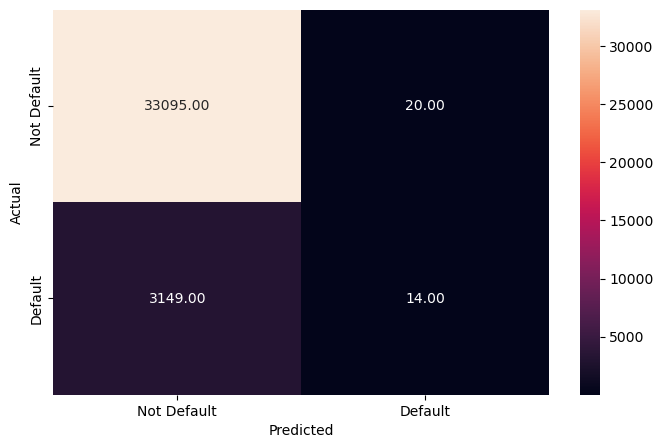

Logistic Regression on Original Train Metrics:
Accuracy: 0.9126467831743756
Precision: 0.4117647058823529
Recall: 0.004426177679418274
F1 Score: 0.008758210822646231
[[33095    20]
 [ 3149    14]]
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.41      0.00      0.01      3163

    accuracy                           0.91     36278
   macro avg       0.66      0.50      0.48     36278
weighted avg       0.87      0.91      0.87     36278



In [1162]:
# Make predictions
preds = my_logreg.predict(X_val)

# Compute metrics
accuracy_lg = accuracy_score(y_val, preds)
precision_lg = precision_score(y_val, preds)
recall_lg = recall_score(y_val, preds)
f1_lg = f1_score(y_val, preds)
conf_mat_lg = confusion_matrix(y_val, preds)
clf_report_lg = classification_report(y_val, preds)
matrix_lg = metrics_score(y_val, preds)

# Print metrics
print("Logistic Regression on Original Train Metrics:")
print(f"Accuracy: {accuracy_lg}")
print(f"Precision: {precision_lg}")
print(f"Recall: {recall_lg}")
print(f"F1 Score: {f1_lg}")
print(conf_mat_lg)
print(clf_report_lg)

Interpretation:

Accuracy:

High Accuracy: The model shows high accuracy (91.3%), which indicates that it correctly classifies most of the samples. However, in the context of imbalanced datasets, accuracy alone can be misleading.

Precision:

Positive Class Precision: The precision for the positive class (1.0) is 41.2%. This means that when the model predicts a positive case, it's correct 41.2% of the time.

Recall:

Positive Class Recall: The recall for the positive class (1.0) is very low at 0.44%. This indicates that the model identifies only a tiny fraction of the actual positive cases.

F1 Score:

F1 Score for Positive Class: The F1 score for the positive class is 0.88%, which is very low. This reflects the model’s difficulty in balancing precision and recall for the positive class.

Interpretation:

The model is performing well in predicting the negative class (0.0), achieving high precision and recall for it.<br>
However, the model struggles significantly with the positive class (1.0), showing extremely low recall and F1 score. This is a common issue with imbalanced datasets where the model might be biased towards predicting the majority class.

#### <ins> Logistic Regression on SMOTE Train data <ins>

In [622]:
# Defining the Logistic regression model
my_logreg_smote = LogisticRegression(random_state=42)

# Fitting the model on the training data 
my_logreg_smote.fit(X_train_smote,y_train_smote)

LogisticRegression(random_state=42)

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.41      0.00      0.01      3163

    accuracy                           0.91     36278
   macro avg       0.66      0.50      0.48     36278
weighted avg       0.87      0.91      0.87     36278



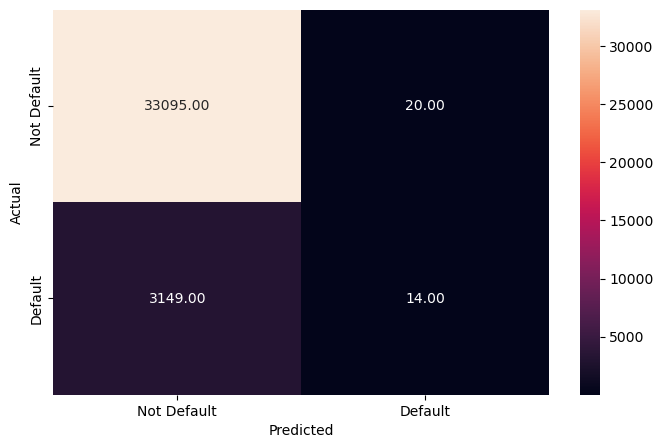

Logistic Regression SMOTE Metrics:
Accuracy: 0.9126467831743756
Precision: 0.4117647058823529
Recall: 0.004426177679418274
F1 Score: 0.008758210822646231
[[33095    20]
 [ 3149    14]]
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.41      0.00      0.01      3163

    accuracy                           0.91     36278
   macro avg       0.66      0.50      0.48     36278
weighted avg       0.87      0.91      0.87     36278



In [623]:
# Make predictions
preds_smote = my_logreg.predict(X_val)

# Compute metrics
accuracy_lg_smote = accuracy_score(y_val, preds_smote)
precision_lg_smote = precision_score(y_val, preds_smote)
recall_lg_smote = recall_score(y_val, preds_smote)
f1_lg_smote = f1_score(y_val, preds_smote)
conf_mat_lg_smote = confusion_matrix(y_val, preds_smote)
clf_report_lg_smote = classification_report(y_val, preds_smote)
matrix_lg_smote = metrics_score(y_val, preds_smote)

# Print metrics
print("Logistic Regression SMOTE Metrics:")
print(f"Accuracy: {accuracy_lg_smote}")
print(f"Precision: {precision_lg_smote}")
print(f"Recall: {recall_lg_smote}")
print(f"F1 Score: {f1_lg_smote}")
print(conf_mat_lg_smote)
print(clf_report_lg_smote)

Analysis and Interpretation

Similarities:

Accuracy: In both cases, the accuracy is the same (91.3%). This indicates that the proportion of correctly classified samples is identical.<br>
Precision, Recall, F1 Score: All these metrics for the positive class (1.0) are also identical, suggesting no improvement from SMOTE in terms of these metrics.<br>

Insights:

Effectiveness of SMOTE: In this case, applying SMOTE did not change the performance metrics. This could imply that the model's ability to predict the positive class (1.0) was not improved by oversampling.<br>

Imbalance Handling: Despite the application of SMOTE, the recall for the positive class remains extremely low (0.44%), and the F1 score is also very low (0.88%). This indicates that the model is still struggling to identify positive cases effectively.

Model Performance: Given the metrics remain the same, it’s important to consider other methods for handling class imbalance or improving model performance. SMOTE alone may not be sufficient in this context.

_________________________________________________________________________________________________________________________________________________________________

### Decision Tree Model

A Decision Tree is a machine learning model used for both classification and regression tasks. It works by splitting the data into subsets based on the value of input features. This process is repeated recursively, creating a tree-like structure of decisions. Each internal node of the tree represents a decision based on the value of a specific feature, each branch represents the outcome of the decision, and each leaf node represents a final decision or prediction.

Key Concepts:

Root Node: The topmost node of the tree which represents the entire dataset.<br>
Internal Nodes: Nodes that represent decisions based on the value of a feature.<br>
Leaf Nodes: Terminal nodes that represent the final outcome or prediction.<br>
Splitting: The process of dividing a node into two or more sub-nodes based on a certain criterion.<br>
Pruning: The process of removing branches from the tree to prevent overfitting and improve generalization.<br>

#### <ins> Decision Tree Model on Original Train data <ins>

In [626]:
# Defining the Logistic regression model
dtree_model = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Train the model
dtree_model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=42)

              precision    recall  f1-score   support

         0.0       0.92      0.91      0.92     33115
         1.0       0.15      0.16      0.15      3163

    accuracy                           0.85     36278
   macro avg       0.53      0.54      0.53     36278
weighted avg       0.85      0.85      0.85     36278



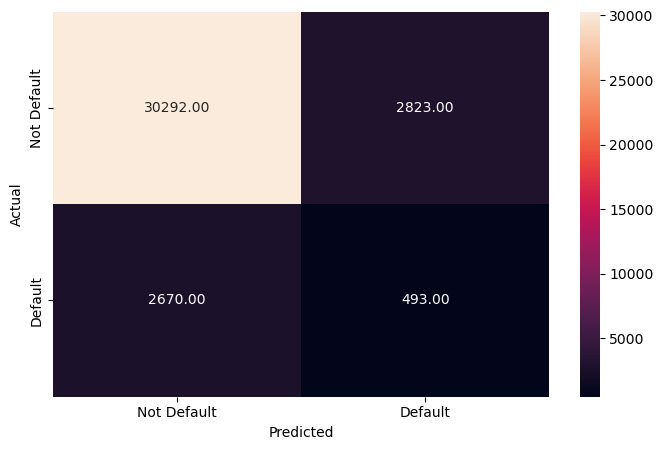

Decision Tree on Original Train Metrics:
Accuracy: 0.8485859198412261
Precision: 0.14867310012062726
Recall: 0.15586468542522922
F1 Score: 0.15218397900910632
[[30292  2823]
 [ 2670   493]]
              precision    recall  f1-score   support

         0.0       0.92      0.91      0.92     33115
         1.0       0.15      0.16      0.15      3163

    accuracy                           0.85     36278
   macro avg       0.53      0.54      0.53     36278
weighted avg       0.85      0.85      0.85     36278



In [1153]:
# Make predictions
preds_dt = dtree_model.predict(X_val)

# Compute metrics
accuracy_dt = accuracy_score(y_val, preds_dt)
precision_dt = precision_score(y_val, preds_dt)
recall_dt = recall_score(y_val, preds_dt)
f1_dt = f1_score(y_val, preds_dt)
conf_mat_dt = confusion_matrix(y_val, preds_dt)
clf_report_dt = classification_report(y_val, preds_dt)
matrix_dt = metrics_score(y_val, preds_dt)

# Print metrics
print("Decision Tree on Original Train Metrics:")
print(f"Accuracy: {accuracy_dt}")
print(f"Precision: {precision_dt}")
print(f"Recall: {recall_dt}")
print(f"F1 Score: {f1_dt}")
print(conf_mat_dt)
print(clf_report_dt)

Interpretation:

Imbalance in Performance:

Our Decision Tree model has high accuracy but performs poorly on the positive class (1.0). This is a common issue in imbalanced datasets where the model may be biased towards predicting the majority class.

Precision vs. Recall:

The low precision and recall for the positive class suggest that the model is not effectively identifying positive cases. This indicates potential issues with class imbalance or insufficient model complexity.

Confusion Matrix Insights:

The model is predicting the majority class (0.0) quite well but struggles with the minority class (1.0). This might be due to the model not capturing the nuances of the minority class effectively.

#### <ins> Decision Tree Model on SMOTE Train data <ins>

              precision    recall  f1-score   support

         0.0       0.92      0.89      0.90     33115
         1.0       0.13      0.18      0.15      3163

    accuracy                           0.83     36278
   macro avg       0.53      0.53      0.53     36278
weighted avg       0.85      0.83      0.84     36278



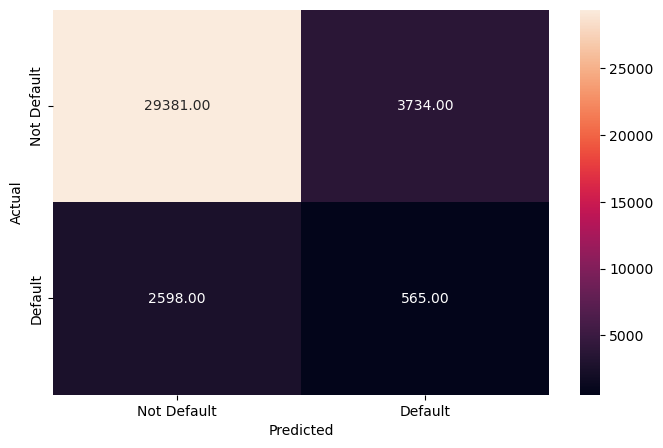

Decision Tree with SMOTE Metrics:
Accuracy: 0.8254589558410056
Precision: 0.13142591300302395
Recall: 0.17862788491938034
F1 Score: 0.1514339319217368
[[29381  3734]
 [ 2598   565]]
              precision    recall  f1-score   support

         0.0       0.92      0.89      0.90     33115
         1.0       0.13      0.18      0.15      3163

    accuracy                           0.83     36278
   macro avg       0.53      0.53      0.53     36278
weighted avg       0.85      0.83      0.84     36278



In [1151]:
# Define and fit Decision Tree model on SMOTE data
dt_model_smote = DecisionTreeClassifier(random_state=42, class_weight='balanced')
dt_model_smote.fit(X_train_smote, y_train_smote)

# Make predictions
preds_dt_smote = dt_model_smote.predict(X_val)

# Compute metrics
accuracy_dt_smote = accuracy_score(y_val, preds_dt_smote)
precision_dt_smote = precision_score(y_val, preds_dt_smote)
recall_dt_smote = recall_score(y_val, preds_dt_smote)
f1_dt_smote = f1_score(y_val, preds_dt_smote)
conf_mat_dt_smote = confusion_matrix(y_val, preds_dt_smote)
clf_report_dt_smote = classification_report(y_val, preds_dt_smote)
matrix_dt_smote = metrics_score(y_val, preds_dt_smote)

# Print metrics
print("Decision Tree with SMOTE Metrics:")
print(f"Accuracy: {accuracy_dt_smote}")
print(f"Precision: {precision_dt_smote}")
print(f"Recall: {recall_dt_smote}")
print(f"F1 Score: {f1_dt_smote}")
print(conf_mat_dt_smote)
print(clf_report_dt_smote)

Comparison and Interpretation

1. Accuracy:
With SMOTE: 82.5%<br>
Original: 84.9% <br>
Interpretation: The accuracy is slightly lower with SMOTE, but both accuracies are relatively high. Accuracy alone may not be a good metric in the context of imbalanced datasets.

2. Precision:
With SMOTE: 13.1%<br>
Original: 14.9%<br>
Interpretation: Precision for the positive class (1.0) is similar in both cases. It indicates how many of the positive predictions are actually correct.

3. Recall:
With SMOTE: 17.9%<br>
Original: 15.6%<br>
Interpretation: Recall improves slightly with SMOTE, meaning the model identifies more positive cases compared to the original data.

4. F1 Score:
With SMOTE: 15.1%<br>
Original: 15.2%<br>
Interpretation: The F1 score, which balances precision and recall, is nearly the same for both cases. Both scores are low, indicating that the model struggles with positive class predictions.

Interpretation:

SMOTE increases the number of true positives and false negatives, indicating an improvement in identifying positive cases but also an increase in false positives.<br>
The original data has fewer false positives but also fewer true positives.<br>

Summary:

SMOTE improves recall slightly, meaning it helps the model identify more positive cases, but the overall performance is still limited.<br>
Precision and F1 Score are similar between the two approaches, suggesting that while SMOTE helps in balancing the dataset, it does not drastically change the precision or overall F1 score.

_________________________________________________________________________________________________________________________________________________________________

###  Random Forest Model

Random Forest is an ensemble learning method primarily used for classification and regression tasks. It constructs a multitude of decision trees during training and outputs the class that is the mode of the classes (for classification) or mean prediction (for regression) of the individual trees.

Key Concepts:

Ensemble Learning:

Random Forest is an ensemble of decision trees. The principle is that a group of weak learners (individual decision trees) can come together to form a strong learner.

Bagging (Bootstrap Aggregating):

Each tree in the forest is trained on a random subset of the training data (with replacement). This technique is called bagging. It helps to reduce variance and avoid overfitting.

Random Feature Selection:

At each split in the tree, a random subset of features is considered for splitting. This introduces additional randomness and decorrelates the trees in the forest, further reducing overfitting.

Voting Mechanism:

For classification tasks, each tree in the forest votes for a class, and the class with the most votes is the model's prediction.
For regression tasks, the mean prediction of all the trees is used as the final prediction.

#### <ins> Random Forest on Original Train data <ins>

In [632]:
# Define and fit Random Forest model with class weights
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')

# Train the model
rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.67      0.00      0.00      3163

    accuracy                           0.91     36278
   macro avg       0.79      0.50      0.48     36278
weighted avg       0.89      0.91      0.87     36278



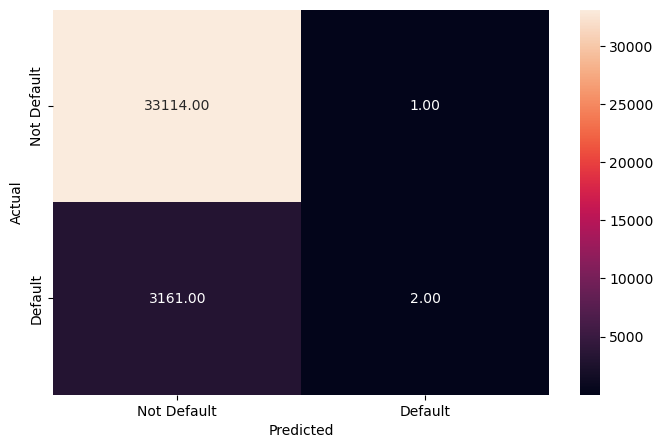

Random Forest with Original Train Metrics:
Accuracy: 0.9128397375820057
Precision: 0.6666666666666666
Recall: 0.0006323110970597534
F1 Score: 0.0012634238787113078
[[33114     1]
 [ 3161     2]]
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.67      0.00      0.00      3163

    accuracy                           0.91     36278
   macro avg       0.79      0.50      0.48     36278
weighted avg       0.89      0.91      0.87     36278



In [1146]:
# Make predictions
preds_rf = rf_model.predict(X_val)

# Compute metrics
accuracy_rf = accuracy_score(y_val, preds_rf)
precision_rf = precision_score(y_val, preds_rf)
recall_rf = recall_score(y_val, preds_rf)
f1_rf = f1_score(y_val, preds_rf)
conf_mat_rf = confusion_matrix(y_val, preds_rf)
clf_report_rf = classification_report(y_val, preds_rf)
matrix_rf = metrics_score(y_val, preds_rf)

# Print metrics
print("Random Forest with Original Train Metrics:")
print(f"Accuracy: {accuracy_rf}")
print(f"Precision: {precision_rf}")
print(f"Recall: {recall_rf}")
print(f"F1 Score: {f1_rf}")
print(conf_mat_rf)
print(clf_report_rf)

Interpretation:

1. Accuracy:
The model achieves a high accuracy of 91.3%, indicating that it classifies the majority of samples correctly.<br>

2. Precision:
The precision for the positive class (1.0) is 66.7%. This means that when the model predicts a sample as positive, it is correct about 67% of the time.<br>

3. Recall:
The recall for the positive class (1.0) is extremely low at 0.0632%. This suggests that the model is not identifying positive cases effectively. Out of all actual positive cases, it identifies almost none.<br>

4. F1 Score:
The F1 score for the positive class is 0.0013, reflecting the poor performance of the model in balancing precision and recall for the positive class.<br>

Summary:

Accuracy is high, but this metric is not very informative in the context of imbalanced datasets. <br>
The model's performance on the positive class is poor.<br>
Precision is relatively good, but the model rarely predicts positive cases.<br>
Recall and F1 Score for the positive class are very low, highlighting the model’s difficulty in identifying positive cases.<br>

#### <ins> Random Forest on SMOTE Train data <ins>

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.29      0.01      0.03      3163

    accuracy                           0.91     36278
   macro avg       0.60      0.51      0.49     36278
weighted avg       0.86      0.91      0.87     36278



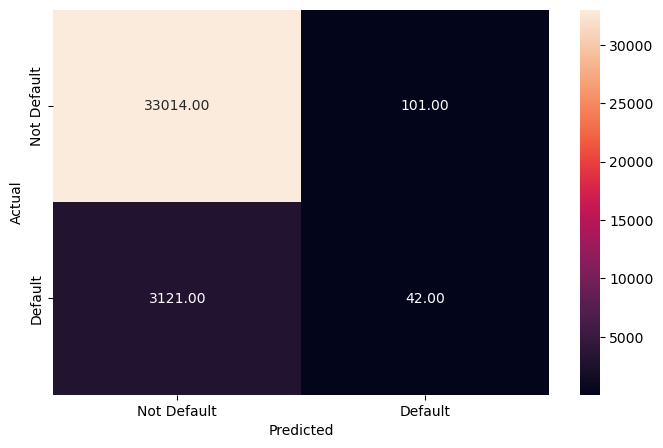

Random Forest with SMOTE Metrics:
Accuracy: 0.911185842659463
Precision: 0.2937062937062937
Recall: 0.013278533038254822
F1 Score: 0.02540834845735027
[[33014   101]
 [ 3121    42]]
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.29      0.01      0.03      3163

    accuracy                           0.91     36278
   macro avg       0.60      0.51      0.49     36278
weighted avg       0.86      0.91      0.87     36278



In [1140]:
# Define and fit Random Forest model on SMOTE data
rf_model_smote = RandomForestClassifier(random_state=42, class_weight='balanced')

# Train the model
rf_model_smote.fit(X_train_smote, y_train_smote)

# Make predictions
preds_rf_smote = rf_model_smote.predict(X_val)

# Compute metrics
accuracy_rf_smote = accuracy_score(y_val, preds_rf_smote)
precision_rf_smote = precision_score(y_val, preds_rf_smote)
recall_rf_smote = recall_score(y_val, preds_rf_smote)
f1_rf_smote = f1_score(y_val, preds_rf_smote)
conf_mat_rf_smote = confusion_matrix(y_val, preds_rf_smote)
clf_report_rf_smote = classification_report(y_val, preds_rf_smote)
matrix_rf_smote = metrics_score(y_val, preds_rf_smote)

# Print metrics
print("Random Forest with SMOTE Metrics:")
print(f"Accuracy: {accuracy_rf_smote}")
print(f"Precision: {precision_rf_smote}")
print(f"Recall: {recall_rf_smote}")
print(f"F1 Score: {f1_rf_smote}")
print(conf_mat_rf_smote)
print(clf_report_rf_smote)

Interpretation:

1. Random Forest with SMOTE:

Accuracy: 91% indicates that the model is correctly classifying a high percentage of samples. <br>
Precision (0.29): The model's precision for the positive class (1.0) is 0.29, which means that when it predicts the positive class, it's correct 29% of the time.<br>
Recall (0.01): The recall for the positive class is very low (0.01), meaning it identifies only 1% of the actual positive cases. <br>
F1 Score (0.03): The F1 score reflects the balance between precision and recall and is quite low, showing poor performance in identifying positive cases. <br>

2. Random Forest with Original Training Data:

Accuracy: Similar to the SMOTE model, the accuracy is 91%. <br>
Precision (0.67): Much higher precision for the positive class (67%), indicating better performance when predicting positive cases compared to the SMOTE model. <br>
Recall (0.0006): Extremely low recall for the positive class (0.0006), almost none of the actual positives are identified.<br>
F1 Score (0.0013): Very low F1 score, reflecting the poor balance between precision and recall for the positive class.<br>

Comparison and Recommendations:

Performance on Positive Class:

SMOTE: Despite handling class imbalance, the SMOTE model still has a very low recall for the positive class, which means it struggles to identify positive cases.<br>
Original Data: Even without SMOTE, the model has low recall for the positive class, although precision is higher in this case.<br>

Accuracy:

Both models show similar accuracy, indicating that overall the models are performing similarly when it comes to correctly classifying samples, but this metric is not very informative given the class imbalance. <br>

Precision vs. Recall:

SMOTE: Although it improves the precision slightly, the recall is still very low, suggesting that SMOTE did not effectively solve the problem of identifying positive cases.<br>
Original Data: High precision for the positive class but negligible recall, indicating that the model is not identifying positive cases well.

_________________________________________________________________________________________________________________________________________________________________

###  XGBoost Model

XGBoost is an advanced implementation of the gradient boosting algorithm designed to be highly efficient, flexible, and portable. It is widely used in machine learning competitions and practical applications due to its performance and speed.

Regularization:

XGBoost includes regularization terms to prevent overfitting. These terms penalize the complexity of the model, encouraging simpler models that generalize better to new data.

Regularization parameters include:
Lambda (L2 regularization): L2 regularization term on weights.
Alpha (L1 regularization): L1 regularization term on weights.

Tree Pruning:

XGBoost uses a more sophisticated tree pruning algorithm compared to traditional gradient boosting. It prunes trees backward, removing splits that do not improve the model, leading to optimal tree structures.

Sparsity Awareness:

XGBoost is designed to handle sparse data efficiently. It includes a sparsity-aware algorithm for handling missing values and sparse feature matrices.

Parallel and Distributed Computing:

XGBoost can leverage multi-core CPUs and distributed computing environments for faster training. This makes it highly scalable and suitable for large datasets. XGBoost is a powerful and flexible machine learning algorithm that excels in a variety of tasks due to its performance, scalability, and ability to handle different types of data and objectives.

#### <ins> XGBoost on Original Train data <ins>

Class weights are used to handle class imbalance in machine learning models. In datasets where one class is significantly more frequent than the other (such as with rare events), the model may become biased towards predicting the majority class because it minimizes the overall error.

By setting class weights helps to:

Improve Performance on Minority Class:

By assigning a higher weight to the minority class, the model is encouraged to pay more attention to it, which can lead to better performance metrics (like precision, recall, and F1 score) for the minority class.

Balance Learning:

It helps balance the impact of each class on the learning process. Without class weights, the model might ignore the minority class due to its lower frequency in the data.

In [639]:
# Calculate class weight for XGBoost
num_neg = len(y_train[y_train == 0])
num_pos = len(y_train[y_train == 1])
class_weight = num_neg / num_pos
class_weight


10.42039935240151

In [640]:
# Define and fit XGBoost model with class weights
xgb_model = XGBClassifier(random_state=42, scale_pos_weight=class_weight)

# Train the mode
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=10.42039935240151,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

              precision    recall  f1-score   support

         0.0       0.95      0.76      0.84     33115
         1.0       0.18      0.56      0.27      3163

    accuracy                           0.74     36278
   macro avg       0.56      0.66      0.56     36278
weighted avg       0.88      0.74      0.79     36278



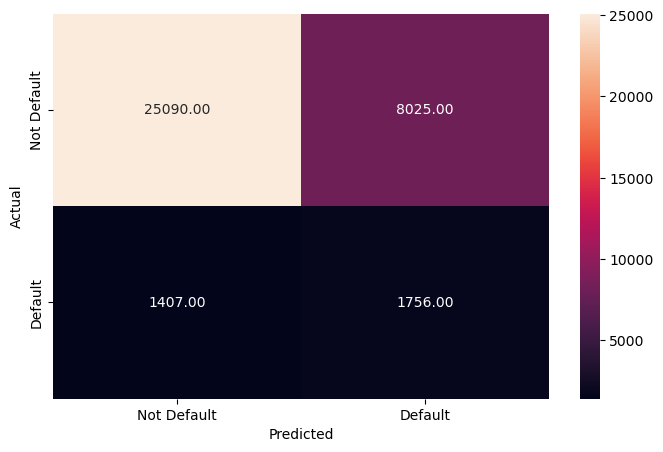

XGBoost with Original Train Metrics:
Accuracy: 0.7400077181763052
Precision: 0.1795317452203251
Recall: 0.5551691432184634
F1 Score: 0.27132262051915945
[[25090  8025]
 [ 1407  1756]]
              precision    recall  f1-score   support

         0.0       0.95      0.76      0.84     33115
         1.0       0.18      0.56      0.27      3163

    accuracy                           0.74     36278
   macro avg       0.56      0.66      0.56     36278
weighted avg       0.88      0.74      0.79     36278



In [1135]:
# Make predictions
preds_xgb = xgb_model.predict(X_val)

# Compute metrics
accuracy_xgb = accuracy_score(y_val, preds_xgb)
precision_xgb = precision_score(y_val, preds_xgb)
recall_xgb = recall_score(y_val, preds_xgb)
f1_xgb = f1_score(y_val, preds_xgb)
conf_mat_xgb = confusion_matrix(y_val, preds_xgb)
clf_report_xgb = classification_report(y_val, preds_xgb)
matrix_xgb = metrics_score(y_val, preds_xgb)

# Print metrics
print("XGBoost with Original Train Metrics:")
print(f"Accuracy: {accuracy_xgb}")
print(f"Precision: {precision_xgb}")
print(f"Recall: {recall_xgb}")
print(f"F1 Score: {f1_xgb}")
print(conf_mat_xgb)
print(clf_report_xgb)

Interpretation:

Accuracy (0.74): The model correctly predicts 74% of the samples. This is a general measure of how often the model is correct overall.

Precision (0.18): Of all the positive predictions, only 18% are true positives. This indicates that the model has a high rate of false positives when predicting the positive class.

Recall (0.56): The model correctly identifies 56% of all actual positive cases. This is an important measure when the goal is to identify as many positive cases as possible, even if it means some false positives.

F1 Score (0.27): This is the harmonic mean of precision and recall, providing a balance between the two metrics. A score of 0.27 suggests that the model is struggling to balance precision and recall effectively.

Confusion Matrix Analysis:

True Negatives (25090): The number of correctly predicted negative cases.<br>
False Positives (8025): The number of negative cases incorrectly predicted as positive.<br>
False Negatives (1407): The number of positive cases incorrectly predicted as negative.<br>
True Positives (1756): The number of correctly predicted positive cases.<br>

Classification Report:

For Class 0.0 (negative class):

Precision: 0.95, indicating very good performance for the negative class.<br>
Recall: 0.76, indicating that the model captures 76% of actual negatives.<br>

For Class 1.0 (positive class):

Precision: 0.18, indicating poor performance in predicting positive cases.<br>
Recall: 0.56, indicating that the model captures 56% of actual positives. <br>

#### <ins> XGBoost on SMOTE Train data <ins>

              precision    recall  f1-score   support

         0.0       0.95      0.73      0.82     33115
         1.0       0.17      0.57      0.26      3163

    accuracy                           0.71     36278
   macro avg       0.56      0.65      0.54     36278
weighted avg       0.88      0.71      0.77     36278



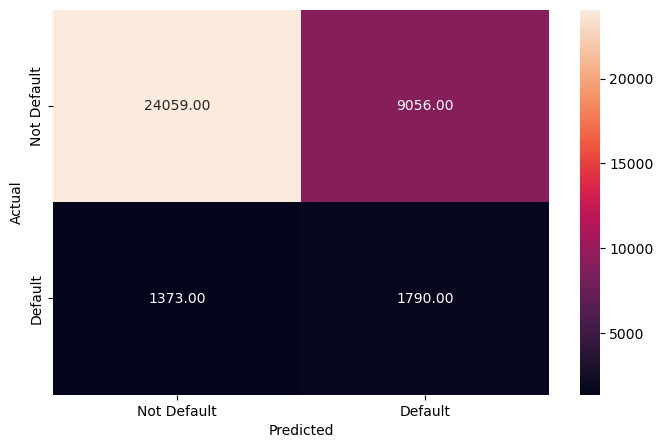

XGBoost with SMOTE Metrics:
Accuracy: 0.7125254975467226
Precision: 0.16503780195463766
Recall: 0.5659184318684793
F1 Score: 0.2555500035691341
[[24059  9056]
 [ 1373  1790]]
              precision    recall  f1-score   support

         0.0       0.95      0.73      0.82     33115
         1.0       0.17      0.57      0.26      3163

    accuracy                           0.71     36278
   macro avg       0.56      0.65      0.54     36278
weighted avg       0.88      0.71      0.77     36278



In [1131]:
# Define and fit XGBoost model on SMOTE data
xgb_model_smote = XGBClassifier(random_state=42, scale_pos_weight=class_weight)

# Train the model
xgb_model_smote.fit(X_train_smote, y_train_smote)

# Make predictions
preds_xgb_smote = xgb_model_smote.predict(X_val)

# Compute metrics
accuracy_xgb_smote = accuracy_score(y_val, preds_xgb_smote)
precision_xgb_smote = precision_score(y_val, preds_xgb_smote)
recall_xgb_smote = recall_score(y_val, preds_xgb_smote)
f1_xgb_smote = f1_score(y_val, preds_xgb_smote)
conf_mat_xgb_smote = confusion_matrix(y_val, preds_xgb_smote)
clf_report_xgb_smote = classification_report(y_val, preds_xgb_smote)
matrix_xgb_smote = metrics_score(y_val, preds_xgb_smote)

# Print metrics
print("XGBoost with SMOTE Metrics:")
print(f"Accuracy: {accuracy_xgb_smote}")
print(f"Precision: {precision_xgb_smote}")
print(f"Recall: {recall_xgb_smote}")
print(f"F1 Score: {f1_xgb_smote}")
print(conf_mat_xgb_smote)
print(clf_report_xgb_smote)

Comparison:

1. XGBoost with SMOTE:

Accuracy: Lower (0.71) compared to the original training data. <br>
Precision: Lower (0.17) compared to the original, indicating more false positives. <br>
Recall: Higher (0.57), meaning it identifies more true positive cases. <br>
F1 Score: Lower (0.26) compared to the original, reflecting a trade-off between precision and recall. <br>

2. XGBoost with Original Train Data:

Accuracy: Higher (0.74), suggesting better overall classification performance. <br>
Precision: Slightly higher (0.18) compared to SMOTE, indicating fewer false positives. <br>
Recall: Slightly lower (0.56) compared to SMOTE, indicating slightly fewer true positive cases identified. <br>
F1 Score: Higher (0.27), showing a better balance between precision and recall. <br>

Summary:

XGBoost with SMOTE improves recall for the positive class but reduces overall accuracy and precision. It is better at capturing positive cases but with some trade-offs in accuracy and precision.

XGBoost with Original Training Data has higher accuracy and precision but slightly lower recall for the positive class. It is better at distinguishing between classes overall but might miss some positive cases.

_________________________________________________________________________________________________________________________________________________________________

### Support Vector Machine (SVM)

Support Vector Machine (SVM) is a powerful and versatile supervised machine learning algorithm that can be used for both classification and regression tasks. It is particularly well-suited for binary classification problems.

Key Concepts:

Hyperplane:

A hyperplane in an n-dimensional space (where n is the number of features) is a flat affine subspace of dimension n-1. In the context of SVM, a hyperplane is used to separate the data points of different classes.

Support Vectors:

Support vectors are the data points that are closest to the hyperplane. These points are critical in defining the position and orientation of the hyperplane. The SVM algorithm finds the hyperplane that maximizes the margin, which is the distance between the hyperplane and the nearest support vectors from either class.

Margin:

The margin is the distance between the hyperplane and the nearest data points from each class (support vectors). The objective of SVM is to maximize this margin. A larger margin implies better generalization to unseen data.


I will be including custom class weights as the model on its own took a very long time to fit. Therefore you can see the calculation below to determine the class weights. After hypertuning for my final project i may adjust the weights to get a robust model performance. This information can be useful for understanding the class distribution in the dataset, which is important for tasks such as handling class imbalance.

#### <ins> SVM on Original Train data <ins>

In [648]:
from collections import Counter
# Count the occurrences of each class in y_train
class_counts = Counter(y_train)

# Calculate the total number of samples in y_train
total_samples = len(y_train)

In [649]:
# Calculate class weights
class_weights = {cls: total_samples / (len(class_counts) * count) for cls, count in class_counts.items()}

In [650]:
# Run the Results
class_weights

{1.0: 5.710199676200755, 0.0: 0.547982805945414}

Now that we have determined our class weights lets go ahead and fit our model Support Vector machine. 

In [651]:
# Calculated weights
class_weights = {1.0: 5.71, 0.0: 0.5478}  

In [652]:
# Define and fit SVM model on original train data
svm_model = SVC(class_weight=class_weights, random_state=42)
svm_model.fit(X_train, y_train)


SVC(class_weight={0.0: 0.5478, 1.0: 5.71}, random_state=42)

              precision    recall  f1-score   support

         0.0       0.95      0.74      0.83     33115
         1.0       0.17      0.55      0.26      3163

    accuracy                           0.72     36278
   macro avg       0.56      0.65      0.54     36278
weighted avg       0.88      0.72      0.78     36278



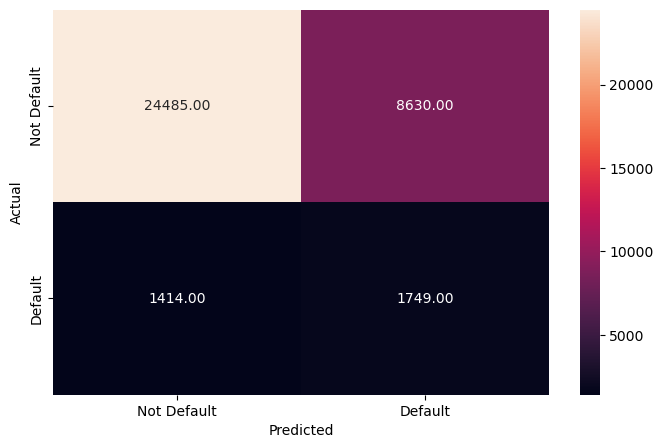

SVM Metrics with Custom Class Weights:
Accuracy: 0.7231379899663708
Precision: 0.1685133442528182
Recall: 0.5529560543787544
F1 Score: 0.2583074878156846
Confusion Matrix:
[[24485  8630]
 [ 1414  1749]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.74      0.83     33115
         1.0       0.17      0.55      0.26      3163

    accuracy                           0.72     36278
   macro avg       0.56      0.65      0.54     36278
weighted avg       0.88      0.72      0.78     36278



In [653]:
y_pred = svm_model.predict(X_val)

# Compute metrics
accuracy_svm = accuracy_score(y_val, y_pred)
precision_svm = precision_score(y_val, y_pred)
recall_svm = recall_score(y_val, y_pred)
f1_svm = f1_score(y_val, y_pred)
conf_matrix_svm = confusion_matrix(y_val, y_pred)
clf_report_svm = classification_report(y_val, y_pred)
matrix_svm = metrics_score(y_val, y_pred)

# Print metrics
print("SVM Metrics with Custom Class Weights:")
print(f"Accuracy: {accuracy_svm}")
print(f"Precision: {precision_svm}")
print(f"Recall: {recall_svm}")
print(f"F1 Score: {f1_svm}")
print("Confusion Matrix:")
print(conf_matrix_svm)
print("Classification Report:")
print(clf_report_svm)

Overall Summary:

The model shows good performance for the majority class (class 0) but struggles with the minority class (class 1), which is common in imbalanced datasets.

High Recall for Class 1: The recall for class 1 is relatively high, indicating the model can identify some defaulters but fails in precision.<br>
Low Precision for Class 1: Many of the samples predicted as class 1 are not actually defaulters, which lowers the precision significantly. <br>
High Accuracy: The overall accuracy of 72% may be misleading due to class imbalance. The model may perform well on the majority class while underperforming on the minority class.<br>

#### <ins> SVM on SMOTE Train data <ins>

              precision    recall  f1-score   support

         0.0       0.93      0.90      0.91     33115
         1.0       0.19      0.26      0.22      3163

    accuracy                           0.84     36278
   macro avg       0.56      0.58      0.57     36278
weighted avg       0.86      0.84      0.85     36278



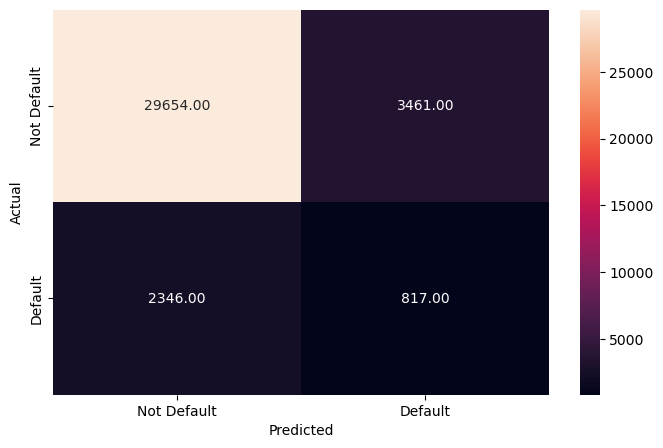

SVM with SMOTE Metrics:
Accuracy: 0.8399305364132532
Precision: 0.19097709209911173
Recall: 0.25829908314890926
F1 Score: 0.21959414057250368
[[29654  3461]
 [ 2346   817]]
              precision    recall  f1-score   support

         0.0       0.93      0.90      0.91     33115
         1.0       0.19      0.26      0.22      3163

    accuracy                           0.84     36278
   macro avg       0.56      0.58      0.57     36278
weighted avg       0.86      0.84      0.85     36278



In [655]:
# Define and fit SVM model on SMOTE data
svm_model_smote = SVC(random_state=42)
svm_model_smote.fit(X_train_smote, y_train_smote)

# Make predictions
preds_svm_smote = svm_model_smote.predict(X_val)

# Compute metrics
accuracy_svm_smote = accuracy_score(y_val, preds_svm_smote)
precision_svm_smote = precision_score(y_val, preds_svm_smote)
recall_svm_smote = recall_score(y_val, preds_svm_smote)
f1_svm_smote = f1_score(y_val, preds_svm_smote)
conf_mat_svm_smote = confusion_matrix(y_val, preds_svm_smote)
clf_report_svm_smote = classification_report(y_val, preds_svm_smote)
matrix_svm_smote = metrics_score(y_val, preds_svm_smote)

# Print metrics
print("SVM with SMOTE Metrics:")
print(f"Accuracy: {accuracy_svm_smote}")
print(f"Precision: {precision_svm_smote}")
print(f"Recall: {recall_svm_smote}")
print(f"F1 Score: {f1_svm_smote}")
print(conf_mat_svm_smote)
print(clf_report_svm_smote)

Comparison:

1. SVM with SMOTE:

Accuracy: Higher (0.84) compared to custom class weights SVM.<br>
Precision: Lower (0.19), indicating that while the model identifies a moderate number of true positives, it also has a considerable amount of false positives.<br>
Recall: Lower (0.26), suggesting that the model misses many actual positive cases.<br>
F1 Score: Lower (0.22), reflecting the balance between precision and recall is not optimal.<br>

2. SVM with Custom Class Weights:

Accuracy: Lower (0.72) compared to SMOTE, suggesting it might not be as good at distinguishing between the classes overall.<br>
Precision: Lower (0.17), similar to SMOTE, but with higher recall.<br>
Recall: Higher (0.55), meaning it identifies more true positives compared to the SMOTE model.<br>
F1 Score: Higher (0.26), indicating a better balance between precision and recall compared to SMOTE.<br>

Summary:

SVM with SMOTE shows better overall accuracy but struggles with recall and precision for the positive class. It’s good at predicting the majority class but less effective at capturing the minority class.

SVM with Custom Class Weights improves recall for the positive class at the cost of lower accuracy and precision. This model is better at identifying positive cases but may not be as reliable in distinguishing them from negatives.

_________________________________________________________________________________________________________________________________________________________________

### Gradient Boosting Model

Gradient Boosting is a powerful machine learning technique used for regression and classification tasks. It builds a model in a stage-wise fashion from weak learners (typically decision trees) and optimizes for a loss function.

Key Concepts:

Boosting:

Boosting is an ensemble technique that combines the predictions of multiple weak learners to create a strong learner. The key idea is to add new models that correct the errors made by existing models.

Gradient Descent:

Gradient Boosting uses gradient descent to minimize a loss function. In each iteration, it fits a new model to the residual errors (the difference between the predicted and actual values) of the combined ensemble of previous models.

#### <ins> Gradient Boosting on Original Train data <ins>

In [659]:
from sklearn.ensemble import GradientBoostingClassifier

In [660]:
# Initialize the Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Fit the model
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.54      0.01      0.02      3163

    accuracy                           0.91     36278
   macro avg       0.73      0.50      0.49     36278
weighted avg       0.88      0.91      0.87     36278



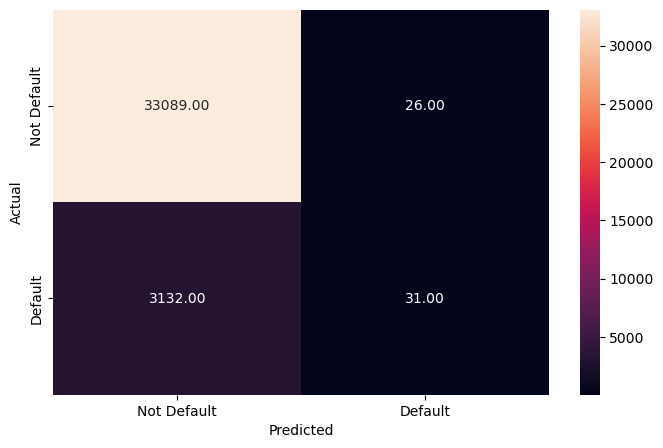

Gradient Boosting Metrics:
Accuracy: 0.9129499972435084
Precision: 0.543859649122807
Recall: 0.009800822004426177
F1 Score: 0.019254658385093167
Confusion Matrix:
[[33089    26]
 [ 3132    31]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.54      0.01      0.02      3163

    accuracy                           0.91     36278
   macro avg       0.73      0.50      0.49     36278
weighted avg       0.88      0.91      0.87     36278



In [661]:
# Make predictions
y_pred = gb_model.predict(X_val)

# Evaluate the model
accuracy_gb = accuracy_score(y_val, y_pred)
precision_gb = precision_score(y_val, y_pred)
recall_gb = recall_score(y_val, y_pred)
f1_gb = f1_score(y_val, y_pred)
conf_matrix_gb = confusion_matrix(y_val, y_pred)
clf_report_gb = classification_report(y_val, y_pred)
matrix_gb = metrics_score(y_val, y_pred)

# Print metrics
print("Gradient Boosting Metrics:")
print(f"Accuracy: {accuracy_gb}")
print(f"Precision: {precision_gb}")
print(f"Recall: {recall_gb}")
print(f"F1 Score: {f1_gb}")
print("Confusion Matrix:")
print(conf_matrix_gb)
print("Classification Report:")
print(clf_report_gb)

Interpretation:

Accuracy: The model achieves an accuracy of 91%, which suggests that it is performing well overall, especially in predicting the majority class.

Precision: The precision for the positive class (1.0) is 0.54, which indicates that when the model predicts the positive class, it is correct 54% of the time. This is relatively good but doesn't fully address the model's performance for the minority class.

Recall: The recall for the positive class is 0.01, which is very low. This means the model is only identifying 1% of the actual positive cases. This is a significant issue, as the model is failing to capture most of the positive instances.

F1 Score: The F1 score of 0.02 is very low, reflecting the model's poor performance in identifying positive cases. It combines both precision and recall into a single metric, and the low recall is the main factor contributing to the low F1 score.

Confusion Matrix:

The matrix shows that the model is correctly classifying 33089 negatives and only 31 positives.<br>
It misclassifies 26 negatives as positives and 3132 positives as negatives.<br>

Summary:
Performance on Majority Class: The model is excellent at predicting the majority class (0.0), as evidenced by the high accuracy and recall for this class.

Performance on Minority Class: The model performs poorly on the minority class (1.0), with very low recall. This indicates that the model is not effectively capturing positive instances.

#### <ins> Gradient Boosting on SMOTE Train data <ins>

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.35      0.03      0.05      3163

    accuracy                           0.91     36278
   macro avg       0.63      0.51      0.50     36278
weighted avg       0.87      0.91      0.87     36278



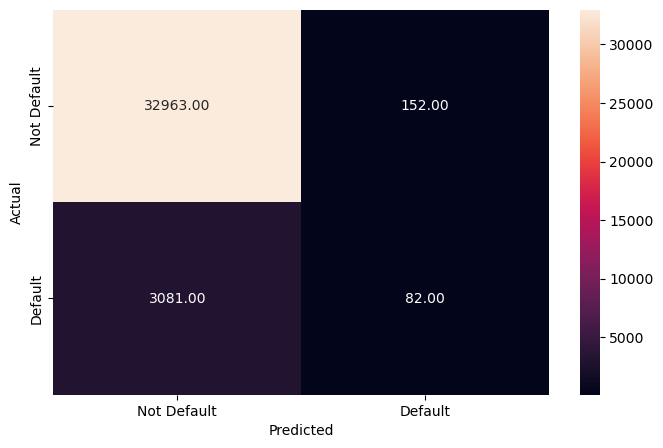

Gradient Boosting with SMOTE Metrics:
Accuracy: 0.9108826285903302
Precision: 0.3504273504273504
Recall: 0.02592475497944989
F1 Score: 0.0482778922578746
Confusion Matrix:
[[32963   152]
 [ 3081    82]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95     33115
         1.0       0.35      0.03      0.05      3163

    accuracy                           0.91     36278
   macro avg       0.63      0.51      0.50     36278
weighted avg       0.87      0.91      0.87     36278



In [663]:
# Initialize the Gradient Boosting model
gb_model_smote = GradientBoostingClassifier(random_state=42)

# Fit the model on the SMOTE-transformed training data
gb_model_smote.fit(X_train_smote, y_train_smote)

# Make predictions on the test set
y_pred_smote = gb_model_smote.predict(X_val)

# Evaluate the model
accuracy_gb_smote = accuracy_score(y_val, y_pred_smote)
precision_gb_smote = precision_score(y_val, y_pred_smote)
recall_gb_smote = recall_score(y_val, y_pred_smote)
f1_gb_smote = f1_score(y_val, y_pred_smote)
conf_matrix_gb_smote = confusion_matrix(y_val, y_pred_smote)
clf_report_gb_smote = classification_report(y_val, y_pred_smote)
matrix_gb_smote = metrics_score(y_val, y_pred_smote)

# Print metrics
print("Gradient Boosting with SMOTE Metrics:")
print(f"Accuracy: {accuracy_gb_smote}")
print(f"Precision: {precision_gb_smote}")
print(f"Recall: {recall_gb_smote}")
print(f"F1 Score: {f1_gb_smote}")
print("Confusion Matrix:")
print(conf_matrix_gb_smote)
print("Classification Report:")
print(clf_report_gb_smote)

Comparison of Gradient Boosting Metrics with and without SMOTE

1. Accuracy:

Both models show similar accuracy, with the non-SMOTE model slightly outperforming the SMOTE model (91.29% vs. 91.09%). This indicates that accuracy alone might not be a sufficient metric due to class imbalance.

2. Precision:

The non-SMOTE model has a higher precision (0.54) for the positive class compared to the SMOTE model (0.35). This suggests that the non-SMOTE model is better at identifying positive cases correctly when it predicts them.

3. Recall:

The recall for the positive class is extremely low in both cases, with only a slight improvement when using SMOTE (0.01 vs. 0.03). This indicates that neither model is effective at identifying all actual positive cases.

4. F1 Score:

Both models have very low F1 scores for the positive class, with the non-SMOTE model slightly higher (0.02 vs. 0.05). The F1 score reflects a trade-off between precision and recall, and both models struggle with this trade-off, showing that improvements are needed.

5. Confusion Matrix:

The confusion matrices reveal that both models are struggling with a large number of false negatives (misclassified positive cases). The SMOTE model has more false positives and false negatives, indicating that SMOTE might not have significantly improved performance in this case.

In conclusion, while both Gradient Boosting models show similar performance, the non-SMOTE model currently has slightly better precision and similar accuracy. 

_________________________________________________________________________________________________________________________________________________________________

#### Summary of Baseline Models

Lets now look at the summary of our Baseline Model's performance that we saw above one with SMOTE and the other without SMOTE. 

First lets get a table of all the baseline models with their Accuracy, Precision, Recall and F1 Scores for easy interpretation of results.

In [667]:
# Create an empty DataFrame to store the metrics
metrics_df = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Add the metrics for the baseline models
metrics_df.loc['Logistic Regression'] = [accuracy_lg, precision_lg, recall_lg, f1_lg]
metrics_df.loc['SVM'] = [accuracy_svm, precision_svm, recall_svm, f1_svm]
metrics_df.loc['Decision Tree'] = [accuracy_dt, precision_dt, recall_dt, f1_dt]
metrics_df.loc['Random Forest'] = [accuracy_rf, precision_rf, recall_rf, f1_rf]
metrics_df.loc['XGBoost'] = [accuracy_xgb, precision_xgb, recall_xgb, f1_xgb]
metrics_df.loc['Gradient Boosting'] = [accuracy_gb, precision_gb, recall_gb, f1_gb]

# Print the comparison table
print(metrics_df)

                        Accuracy    Precision       Recall     F1 Score
Logistic Regression 0.9126467832 0.4117647059 0.0044261777 0.0087582108
SVM                 0.7231379900 0.1685133443 0.5529560544 0.2583074878
Decision Tree       0.8485859198 0.1486731001 0.1558646854 0.1521839790
Random Forest       0.9128397376 0.6666666667 0.0006323111 0.0012634239
XGBoost             0.7400077182 0.1795317452 0.5551691432 0.2713226205
Gradient Boosting   0.9129499972 0.5438596491 0.0098008220 0.0192546584


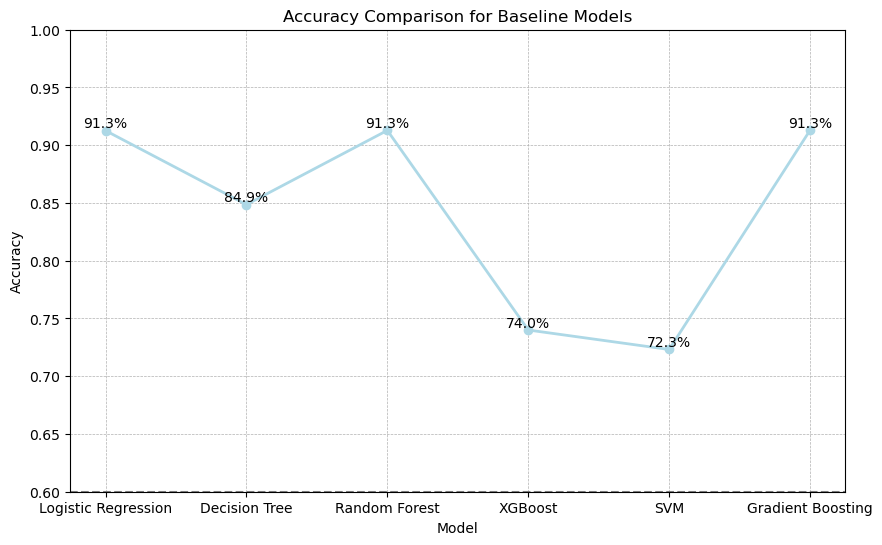

In [668]:
# List of model names and corresponding accuracy scores
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'SVM', 'Gradient Boosting']
accuracy_scores = [accuracy_lg, accuracy_dt, accuracy_rf, accuracy_xgb, accuracy_svm, accuracy_gb]

# Plot the line graph with an orange color theme and grid lines
plt.figure(figsize=(10, 6))
plt.plot(models, accuracy_scores, color='lightblue', marker='o', linestyle='-', linewidth=2)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison for Baseline Models')
plt.ylim(0.6, 1.0)  # Set y-axis limits to 0.6 to 1.0
plt.axhline(y=0.6, color='gray', linestyle='--')  # Add a horizontal line at y=0.6 for reference

# Add accuracy score labels
for i, score in enumerate(accuracy_scores):
    plt.text(models[i], score, f"{score*100:.1f}%", ha='center', va='bottom')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add both horizontal and vertical grid lines
plt.show()

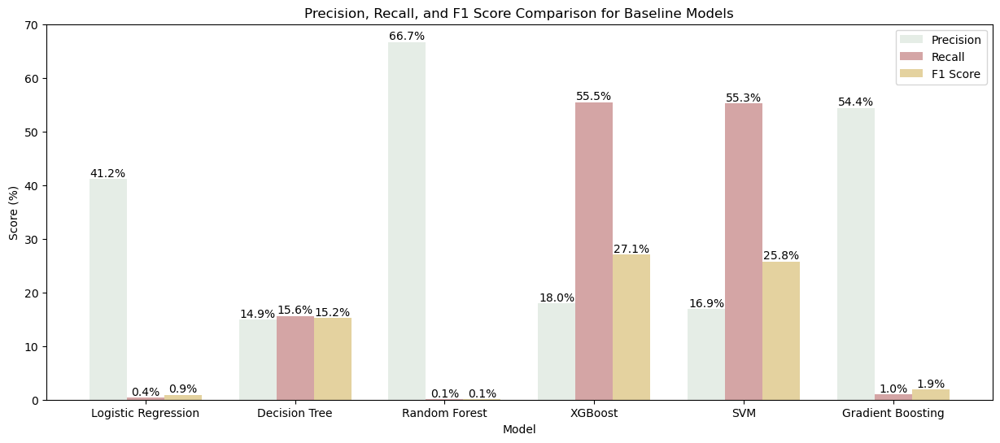

In [669]:
# List of model names and corresponding precision, recall, and F1 scores
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost', 'SVM', 'Gradient Boosting']
precision_scores = [precision_lg, precision_dt, precision_rf, precision_xgb, precision_svm, precision_gb]
recall_scores = [recall_lg, recall_dt, recall_rf, recall_xgb, recall_svm, recall_gb]
f1_scores = [f1_lg, f1_dt, f1_rf, f1_xgb, f1_svm, f1_gb]

# Convert scores to percentages with one decimal place
precision_scores_pct = [round(score * 100, 1) for score in precision_scores]
recall_scores_pct = [round(score * 100, 1) for score in recall_scores]
f1_scores_pct = [round(score * 100, 1) for score in f1_scores]

# Set the positions and width for the bars
pos = np.arange(len(models))
width = 0.25

# Plot the bar graph for precision with an orange color theme
plt.figure(figsize=(15, 6))
plt.bar(pos, precision_scores_pct, width, color='#BFD3C1', alpha=0.4, label='Precision')

# Plot the bar graph for recall with a darker orange color
plt.bar(pos + width, recall_scores_pct, width, color='#D4A5A5', label='Recall')

# Plot the bar graph for F1 score with a much darker orange color
plt.bar(pos + 2 * width, f1_scores_pct, width, color='#D9BF77', alpha=0.7, label='F1 Score')

# Add xticks on the middle of the group bars
plt.xlabel('Model')
plt.ylabel('Score (%)')
plt.title('Precision, Recall, and F1 Score Comparison for Baseline Models')
plt.xticks(pos + width, models, rotation=360)
plt.legend()

# Add score labels on top of the bars
for i in range(len(models)):
    plt.text(pos[i], precision_scores_pct[i], f"{precision_scores_pct[i]:.1f}%", ha='center', va='bottom')
    plt.text(pos[i] + width, recall_scores_pct[i], f"{recall_scores_pct[i]:.1f}%", ha='center', va='bottom')
    plt.text(pos[i] + 2 * width, f1_scores_pct[i], f"{f1_scores_pct[i]:.1f}%", ha='center', va='bottom')

plt.show()

Comparison of Models for Predicting Home Loan Default

Interpretation of Results:

Logistic Regression:

Analysis: Despite high accuracy, the recall for predicting the minority class (loan default) is very low. This suggests the model is not identifying many actual defaults.

SVM:

Analysis: Lower accuracy compared to other models but much better recall. The SVM model is better at identifying loan defaults but at the cost of many false positives.

Decision Tree:

Analysis: Moderate accuracy with balanced but low precision and recall, indicating the model struggles with both false positives and false negatives.

Random Forest:

Analysis: High accuracy and precision but extremely low recall. The model almost never predicts loan defaults, leading to many false negatives.

XGBoost:

Analysis: Similar to SVM, it has a better recall and a reasonable F1 score, suggesting a decent balance between identifying defaults and minimizing false positives.

Gradient Boosting:

Analysis: High accuracy and precision but very low recall. The model rarely predicts defaults, missing many actual default cases.

Conclusion:

Best Models for Recall:

SVM (0.5530) and XGBoost (0.5552): These models show the best recall, making them more suitable for detecting loan defaults. However, they also have lower accuracy, meaning they predict more false positives.

Best Models for Accuracy:
Logistic Regression (0.9126), Random Forest (0.9128), and Gradient Boosting (0.9130): These models have high accuracy but very low recall, meaning they fail to identify many actual defaults.

Lets now look at our results from the baseline models with SMOTE below

_________________________________________________________________________________________________________________________________________________________________

#### Comparison of metrics of Baseline Models with SMOTE

In [672]:
# Create an empty DataFrame to store the metrics
metrics_df_smote = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Add the metrics for the baseline models
metrics_df_smote.loc['Logistic Regression SMOTE'] = [accuracy_lg_smote, precision_lg_smote, recall_lg_smote, f1_lg_smote]
metrics_df_smote.loc['SVM SMOTE'] = [accuracy_svm_smote, precision_svm_smote, recall_svm_smote, f1_svm_smote]
metrics_df_smote.loc['Decision Tree SMOTE'] = [accuracy_dt_smote, precision_dt_smote, recall_dt_smote, f1_dt_smote]
metrics_df_smote.loc['Random Forest SMOTE'] = [accuracy_rf_smote, precision_rf_smote, recall_rf_smote, f1_rf_smote]
metrics_df_smote.loc['XGBoost SMOTE'] = [accuracy_xgb_smote, precision_xgb_smote, recall_xgb_smote, f1_xgb_smote]
metrics_df_smote.loc['Gradient Boosting SMOTE'] = [accuracy_gb_smote, precision_gb_smote, recall_gb_smote, f1_gb_smote]

# Print the comparison table
print(metrics_df_smote)

                              Accuracy    Precision       Recall     F1 Score
Logistic Regression SMOTE 0.9126467832 0.4117647059 0.0044261777 0.0087582108
SVM SMOTE                 0.8399305364 0.1909770921 0.2582990831 0.2195941406
Decision Tree SMOTE       0.8254589558 0.1314259130 0.1786278849 0.1514339319
Random Forest SMOTE       0.9111858427 0.2937062937 0.0132785330 0.0254083485
XGBoost SMOTE             0.9117647059 0.4020618557 0.0246601328 0.0464700626
Gradient Boosting SMOTE   0.9108826286 0.3504273504 0.0259247550 0.0482778923


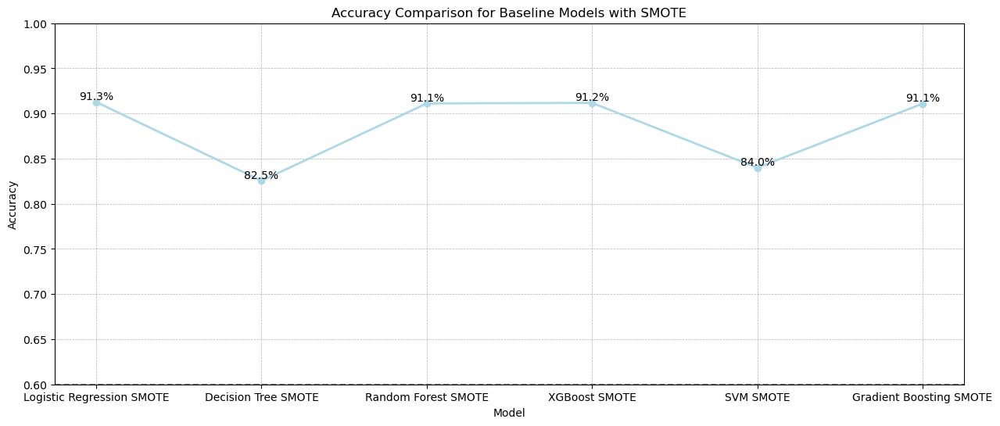

In [673]:
# List of model names and corresponding accuracy scores
models = ['Logistic Regression SMOTE', 'Decision Tree SMOTE', 'Random Forest SMOTE', 'XGBoost SMOTE', 'SVM SMOTE', 'Gradient Boosting SMOTE']
accuracy_scores = [accuracy_lg_smote, accuracy_dt_smote, accuracy_rf_smote, accuracy_xgb_smote, accuracy_svm_smote, accuracy_gb_smote]

# Plot the line graph with an orange color theme and grid lines
plt.figure(figsize=(15, 6))
plt.plot(models, accuracy_scores, color='lightblue', marker='o', linestyle='-', linewidth=2)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison for Baseline Models with SMOTE')
plt.ylim(0.6, 1.0)  # Set y-axis limits to 0.6 to 1.0
plt.axhline(y=0.6, color='gray', linestyle='--')  # Add a horizontal line at y=0.6 for reference

# Add accuracy score labels
for i, score in enumerate(accuracy_scores):
    plt.text(models[i], score, f"{score*100:.1f}%", ha='center', va='bottom')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add both horizontal and vertical grid lines
plt.show()

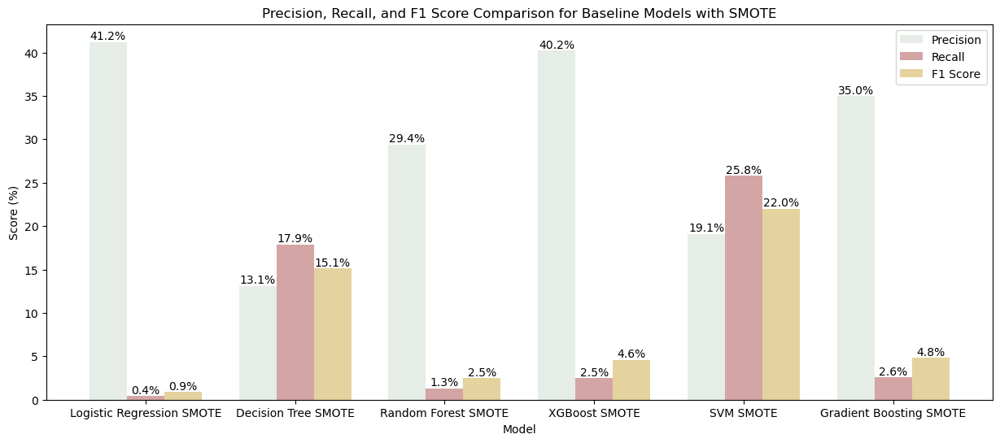

In [674]:
# List of model names and corresponding precision, recall, and F1 scores
models_SMOTE = ['Logistic Regression SMOTE', 'Decision Tree SMOTE', 'Random Forest SMOTE', 'XGBoost SMOTE', 'SVM SMOTE', 'Gradient Boosting SMOTE']
precision_scores_SMOTE = [precision_lg_smote, precision_dt_smote, precision_rf_smote, precision_xgb_smote, precision_svm_smote, precision_gb_smote]
recall_scores_SMOTE = [recall_lg_smote, recall_dt_smote, recall_rf_smote, recall_xgb_smote, recall_svm_smote, recall_gb_smote]
f1_scores_SMOTE = [f1_lg_smote, f1_dt_smote, f1_rf_smote, f1_xgb_smote, f1_svm_smote, f1_gb_smote]

# Convert scores to percentages with one decimal place
precision_scores_pct = [round(score * 100, 1) for score in precision_scores_SMOTE]
recall_scores_pct = [round(score * 100, 1) for score in recall_scores_SMOTE]
f1_scores_pct = [round(score * 100, 1) for score in f1_scores_SMOTE]

# Set the positions and width for the bars
pos = np.arange(len(models))
width = 0.25

# Plot the bar graph for precision with an orange color theme
plt.figure(figsize=(15, 6))
plt.bar(pos, precision_scores_pct, width, color='#BFD3C1', alpha=0.4, label='Precision')

# Plot the bar graph for recall with a darker orange color
plt.bar(pos + width, recall_scores_pct, width, color='#D4A5A5', label='Recall')

# Plot the bar graph for F1 score with a much darker orange color
plt.bar(pos + 2 * width, f1_scores_pct, width, color='#D9BF77', alpha=0.7, label='F1 Score')

# Add xticks on the middle of the group bars
plt.xlabel('Model')
plt.ylabel('Score (%)')
plt.title('Precision, Recall, and F1 Score Comparison for Baseline Models with SMOTE')
plt.xticks(pos + width, models, rotation=360)
plt.legend()

# Add score labels on top of the bars
for i in range(len(models)):
    plt.text(pos[i], precision_scores_pct[i], f"{precision_scores_pct[i]:.1f}%", ha='center', va='bottom')
    plt.text(pos[i] + width, recall_scores_pct[i], f"{recall_scores_pct[i]:.1f}%", ha='center', va='bottom')
    plt.text(pos[i] + 2 * width, f1_scores_pct[i], f"{f1_scores_pct[i]:.1f}%", ha='center', va='bottom')

plt.show()

##### Comparison of Models with SMOTE for Predicting Home Loan Default

Interpretation of Results:

Logistic Regression SMOTE:

Accuracy: 0.9126
Precision: 0.4118
Recall: 0.0044
F1 Score: 0.0088
Analysis: High accuracy but extremely low recall. This model fails to identify many actual defaults despite a balanced dataset.

SVM SMOTE:

Accuracy: 0.8399
Precision: 0.1910
Recall: 0.2583
F1 Score: 0.2196
Analysis: Reasonable trade-off between precision and recall. Better recall than many other models, making it more effective at identifying loan defaults.

Decision Tree SMOTE:

Accuracy: 0.8255
Precision: 0.1314
Recall: 0.1786
F1 Score: 0.1514
Analysis: Lower precision and recall. Struggles with both false positives and false negatives.

Random Forest SMOTE:

Accuracy: 0.9112
Precision: 0.2937
Recall: 0.0133
F1 Score: 0.0254
Analysis: High accuracy but very low recall. Similar to Logistic Regression SMOTE, it fails to identify most defaults.

XGBoost SMOTE:

Accuracy: 0.9118
Precision: 0.4021
Recall: 0.0247
F1 Score: 0.0465
Analysis: Better precision and recall compared to Random Forest and Logistic Regression, but still has low recall.

Gradient Boosting SMOTE:

Accuracy: 0.9109
Precision: 0.3504
Recall: 0.0259
F1 Score: 0.0483
Analysis: Similar performance to XGBoost SMOTE. Moderate precision but low recall.

Conclusion:

<ins> Best Models for Recall <ins>:

SVM SMOTE (0.2583): This model has the best recall among all the models tested with SMOTE, indicating it is more effective at identifying loan defaults.

Decision Tree SMOTE (0.1786): Although not as effective as SVM, it has a better recall than the other models.

<ins> Best Models for Accuracy <ins>:
    
Logistic Regression SMOTE (0.9126), Random Forest SMOTE (0.9112), XGBoost SMOTE (0.9118), and Gradient Boosting SMOTE (0.9109): These models have high accuracy but very low recall, meaning they fail to identify many actual defaults.
    
Recommendations:
    
Balanced Approach: SVM SMOTE is recommended due to its higher recall, despite lower accuracy. This model is more effective at identifying defaults, which is crucial in predicting loan defaults.
    
Threshold Adjustment: May Consider adjusting the decision threshold for models like Logistic Regression, Random Forest, or Gradient Boosting to improve recall while monitoring precision and overall performance.
    
Further Experimentation: Continue experimenting with different resampling techniques and hyperparameter tuning to optimize model performance, particularly for the minority class will give better results.
    
By focusing on recall and employing strategies to balance the trade-offs, you can improve the detection of home loan defaults, which is critical for this problem.

_________________________________________________________________________________________________________________________________________________________________

#### Overall Explanation of Model Performance

Model Performance Without SMOTE:

Logistic Regression: 

High accuracy (91.3%) but very low recall and F1 score for the positive class (1.0). This indicates that while the model is good at classifying the majority class (0.0), it struggles significantly with the minority class (1.0). Precision is relatively better but still indicates that the model is not effective in identifying the minority class.

Decision Tree: 

Moderate accuracy (84.9%) with low precision and recall for the positive class. The decision tree also struggles with the minority class but is somewhat better at handling it compared to logistic regression, though it still shows poor performance.

Random Forest: 

High accuracy (91.3%) similar to logistic regression but with very low recall and F1 score for the positive class. It’s good at classifying the majority class but fails to identify the minority class effectively.

XGBoost: 

Moderate accuracy (74.0%) with better balance between precision and recall for the positive class compared to logistic regression and random forest, though still not optimal. It performs better in identifying the positive class compared to some other models.

Gradient Boosting: 

High accuracy (91.3%) but very low recall and F1 score for the positive class, similar to logistic regression and random forest.

SVM: 

Accuracy (72.3%) is lower compared to other models. The recall for the positive class is better than logistic regression and random forest but at the cost of lower precision and overall accuracy.

Model Performance With SMOTE:

Logistic Regression: 

The metrics remain identical to the version without SMOTE, indicating that SMOTE did not improve performance. The model still struggles to identify the minority class effectively.

Decision Tree: 

Accuracy decreases slightly (82.5%) with improved recall for the positive class compared to the original model but at the cost of precision and overall performance.

Random Forest: 

Accuracy is similar (91.1%) to the model without SMOTE, but the recall for the positive class is still very low. The model performs better at classifying the majority class but shows limited improvement in identifying the minority class.

XGBoost: 

Accuracy is lower (71.3%) with SMOTE compared to the model without SMOTE. The recall for the positive class improves significantly, indicating that SMOTE has made the model better at identifying the positive class, though precision and overall performance are still suboptimal.

SVM: 

Accuracy (83.9%) is similar to XGBoost with SMOTE. The recall for the positive class is improved, but precision remains low, showing that SMOTE has some impact but does not completely solve the problem.

Summary and Recommendations:

Impact of SMOTE:

SMOTE tends to improve recall for the minority class but can sometimes negatively affect precision and overall accuracy. The improvements vary across different models. In some cases, like XGBoost and SVM, SMOTE seems to have a noticeable impact on recall, while in others like logistic regression, it makes no difference.

Choosing the Best Model:

* XGBoost with SMOTE shows the best trade-off between recall and precision for the positive class, although it still needs improvement. It seems to benefit from SMOTE by improving recall.

* Decision Tree with SMOTE provides improved recall but with lower accuracy, precision, and F1 score. It might be useful if recall is a priority.
Random Forest and Gradient Boosting with SMOTE provide high accuracy but fail to improve recall for the minority class.

* SVM shows moderate improvements with SMOTE but at the cost of lower accuracy.

In summary, XGBoost with SMOTE seems to offer the best balance and improvements in recall, making it a promising candidate. However, fine-tuning and exploring additional methods may further enhance performance.

_________________________________________________________________________________________________________________________________________________________________

# Part 6 - <ins> Conclusion and Next Steps <a id='conclusion'></a> <ins>

## Conclusion:
Key Findings from Preprocessing, EDA and Baseline Modeling:

Data Quality and Preprocessing:

We addressed issues related to missing values, categorical variables, and feature scaling. <br>
Advanced preprocessing techniques, such as SMOTE for handling class imbalance, were implemented to improve model performance. <br>

Exploratory Data Analysis (EDA):

We identified different features and their relationships with the target variable. <br>
Insights gained from feature distributions and correlations informed our feature engineering and model selection processes. <br>

Baseline Models:

Model Performance:

Logistic Regression, SVM, Decision Trees, Random Forests, XGBoost, and Gradient Boosting were evaluated. <br>
Performance metrics such as accuracy, precision, recall, and F1 scores were analyzed for both models with and without SMOTE. <br>

Evaluation Metrics:

Models were assessed based on their ability to balance precision and recall, especially in the context of predicting rare default events. <br>
The models showed varying strengths, with SVM and XGBoost demonstrating better performance in handling the imbalanced data. <br>

## Next Steps:

### Further Optimization Steps

Hyperparameter Tuning:

Grid Search: We can Perform an exhaustive search over a specified parameter grid to find the optimal parameters for each model.
Random Search: May also Use random search for a less exhaustive but faster approach to parameter tuning.

Cross-Validation:

Stratified K-Fold: Can Use stratified k-fold cross-validation to ensure each fold maintains the class distribution, providing a more reliable estimate of model performance.

Regularization:

For Logistic Regression: Can Explore regularization techniques (L1, L2) to prevent overfitting and improve model generalization.
For Decision Trees and Random Forests: Prune trees to avoid overfitting and control model complexity.

Feature Selection:

Feature Importance: Can Use feature importance scores from models like Random Forests or XGBoost to identify and retain the most impactful features.

Evaluation

Metrics:

AUC-ROC Curve: Evaluate the Receiver Operating Characteristic (ROC) curve and Area Under the Curve (AUC) to understand the trade-off between true positive rate and false positive rate.

Finally evaluate my model's performance on the unseen (SMOTE Test Data)

_________________________________________________________________________________________________________________________________________________________________

### Some Steps to consider for my final Sprint

Below are the codes that can help me identify and focus on very important and least important features, possibly may help in improving my model's performance.

In [680]:
model = RandomForestClassifier()
model.fit(X_train, y_train)
importance = model.feature_importances_

In [681]:
# Get the feature names from X_train
feature_names = X_train.columns

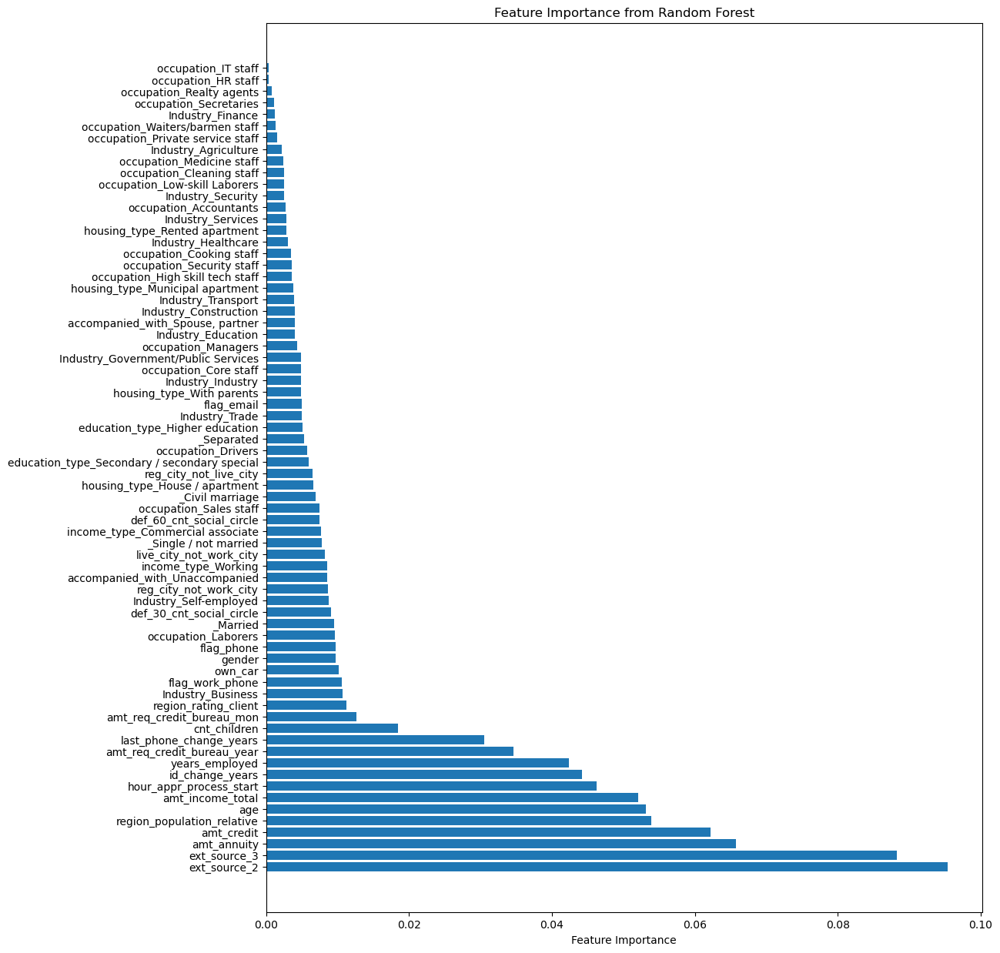

In [682]:
# Assuming X_train is a DataFrame with feature names
feature_names = X_train.columns.tolist()

# Check if the length of feature names matches the importance array
if len(feature_names) != len(importance):
    raise ValueError("The length of feature names does not match the number of features")

# Get indices of features sorted by importance
sorted_idx = np.argsort(importance)[::-1]

# Plot feature importances
plt.figure(figsize=(12, 15))
plt.barh(np.array(feature_names)[sorted_idx], importance[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance from Random Forest')
plt.show()